## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_14"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


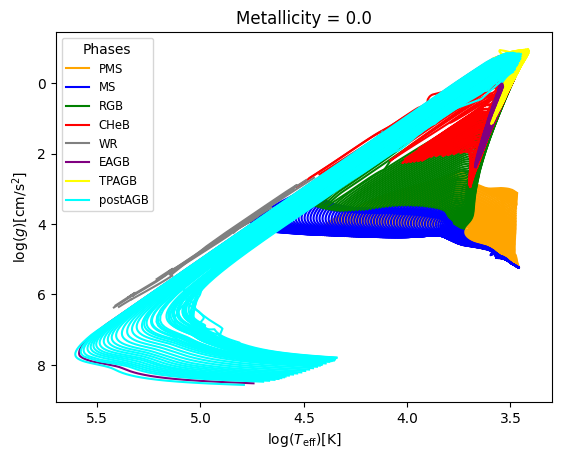

In [5]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [6]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
633331,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
633332,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
633333,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
633334,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


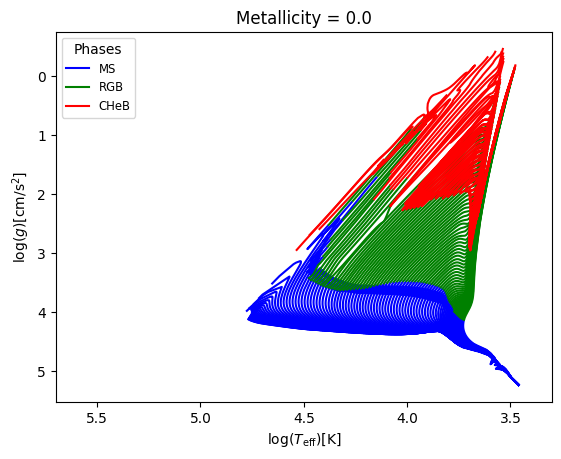

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 633336 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.00,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.00,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.00,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.05,4.482577,4.350883,0.0,-0.25,12.925175,0.596074
4,5.05,4.485667,4.349692,0.0,-0.25,13.105490,0.600130
...,...,...,...,...,...,...,...
522017,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
522018,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
522019,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
522020,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


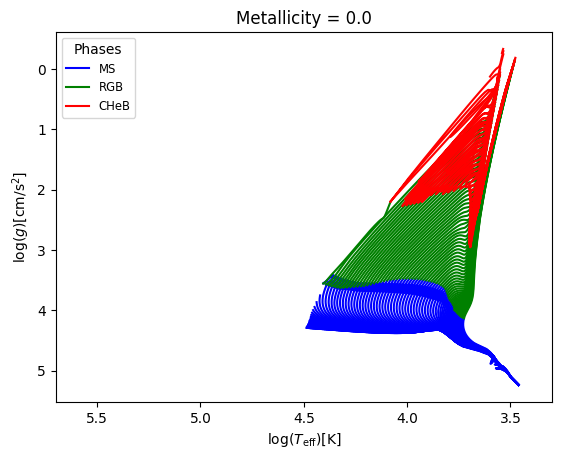

In [9]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 14)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [10]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 5.0 - 10.3, Mean : 8.4693, Median : 8.5

log_Teff  : Range : 3.34 - 5.2138, Mean : 3.9383, Median : 3.867

log_g  : Range : -1.08 - 7.9405, Mean : 3.5574, Median : 3.9537

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 13.9995, Mean : 3.3831, Median : 2.0289

log_R  : Range : -1.86 - 3.0828, Mean : 0.6007, Median : 0.5357



In [11]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.213751178569124
Median value in train data for the log_Teff parameter: 3.8670163782366114
Mean value in train data for the log_Teff parameter: 3.9384274370453722

Range in train data for the log_g parameter : -1.0828963170617296 - 7.937578027609092
Median value in train data for the log_g parameter: 3.952761457001375
Mean value in train data for the log_g parameter: 3.556483239184975

Range in train data for the log_R parameter : -1.859644360427887 - 3.0827540579576227
Median value in train data for the log_R parameter: 0.5359659870072869
Mean value in train data for the log_R parameter: 0.601508525333496

Testing set statistics:
Range in test data for the log_Teff parameter : 3.3447003632081813 - 5.211251545703222
Median value in test data for the log_Teff parameter: 3.8670502831100153
Mean value in test data for the log_Teff parameter: 3.9378306609946634

Range in test data for the log_g p

## Model training

### Linear regression

In [12]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.7481117994014141
  RMSE :  0.1559639030454318
  MAE :  0.13450667690395926
  MedAE :  0.13605378066909424
  CORR :  0.8679193680761645
  MAX_ER :  0.7731090201067672
  Percentiles : 
    75th percentile :  0.19060915585067384
    90th percentile :  0.22853670184574676
    95th percentile :  0.24716367972154707
    99th percentile :  0.3297548466801481

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.6775877482458732
  RMSE :  0.144307516495637
  MAE :  0.10971224424893855
  MedAE :  0.09035986920906014
  CORR :  0.8234732477782282
  MAX_ER :  0.7340239614583957
  Percentiles : 
    75th percentile :  0.14668073048603691
    90th percentile :  0.21068888482835882
    95

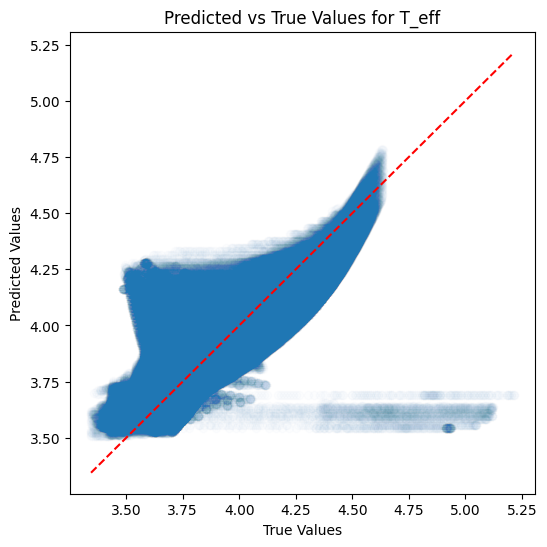

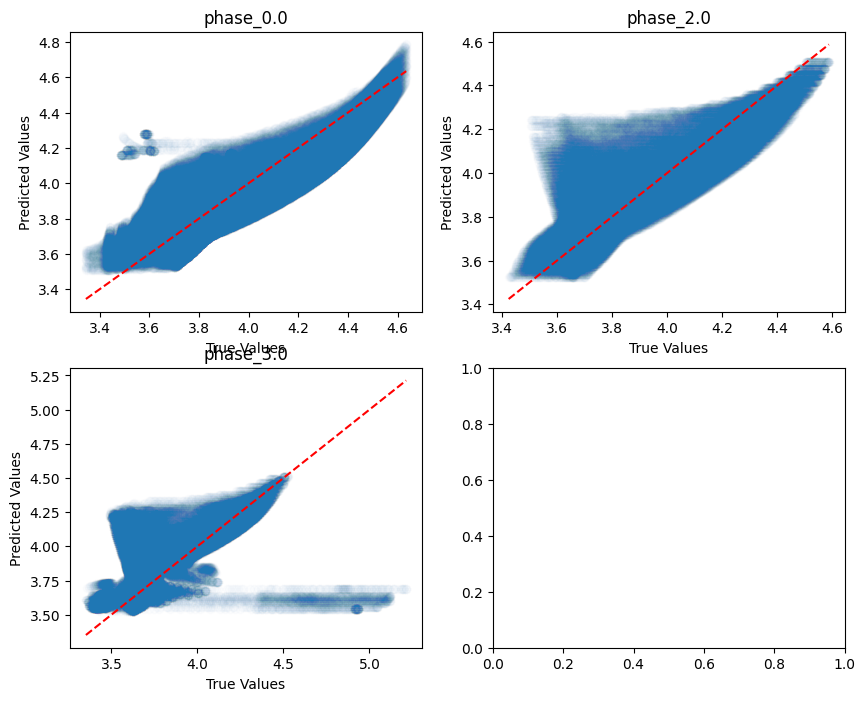

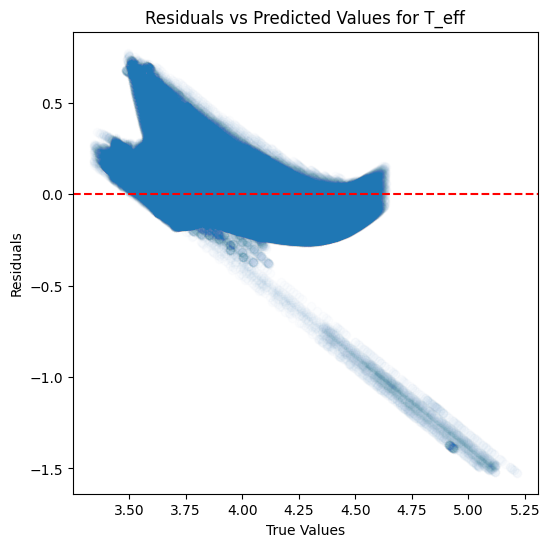

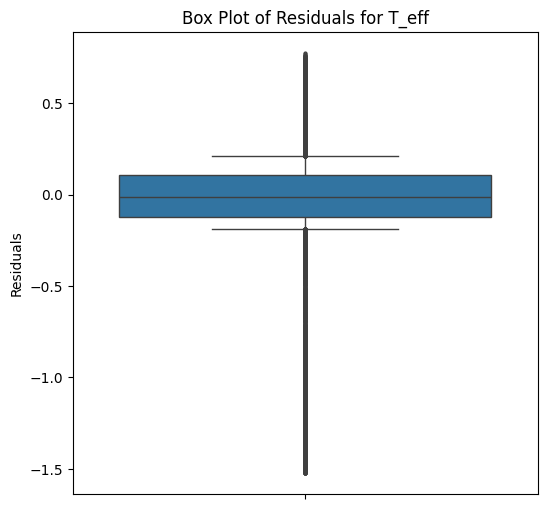

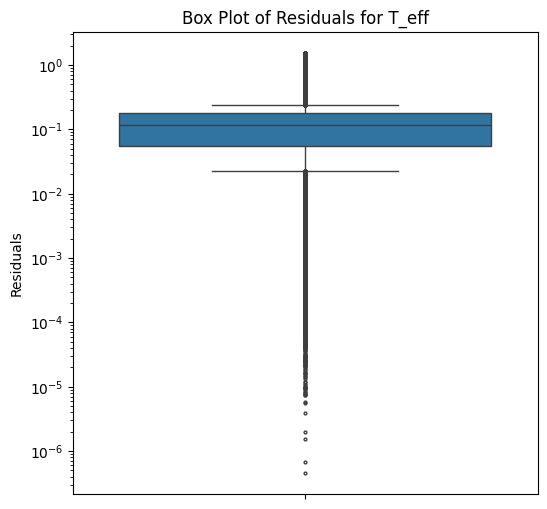

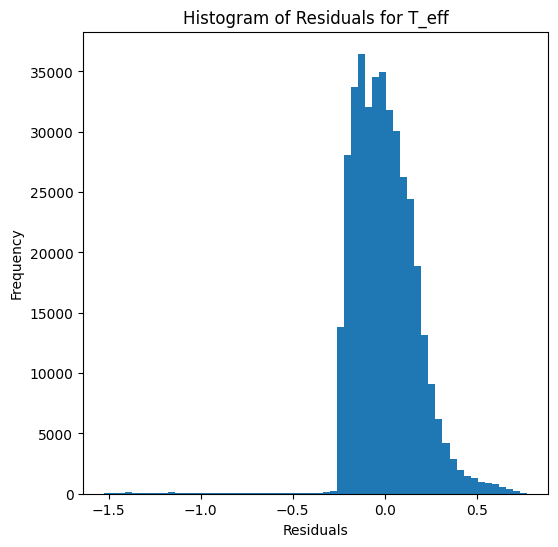

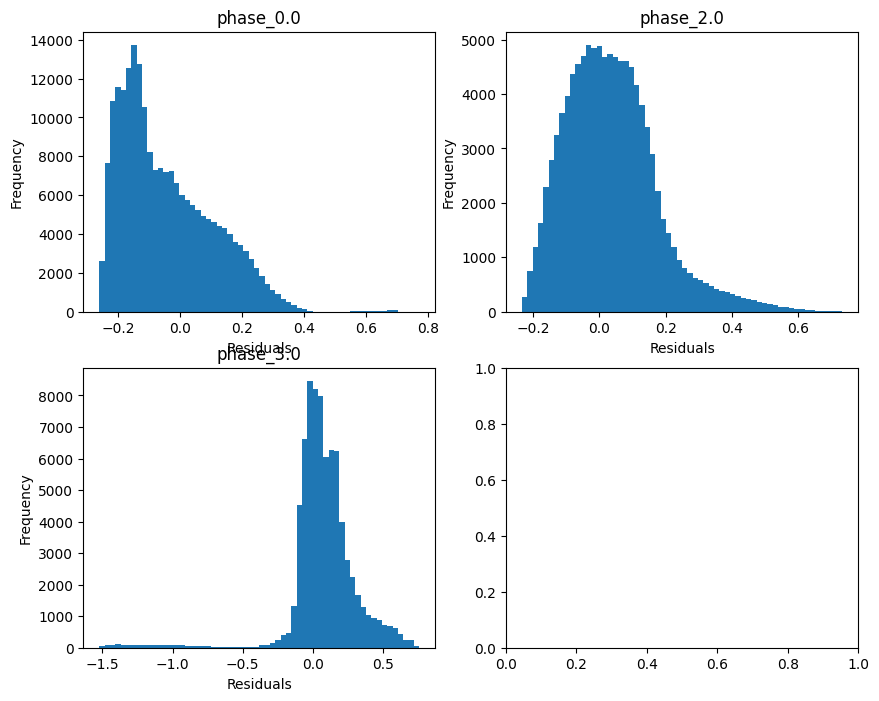

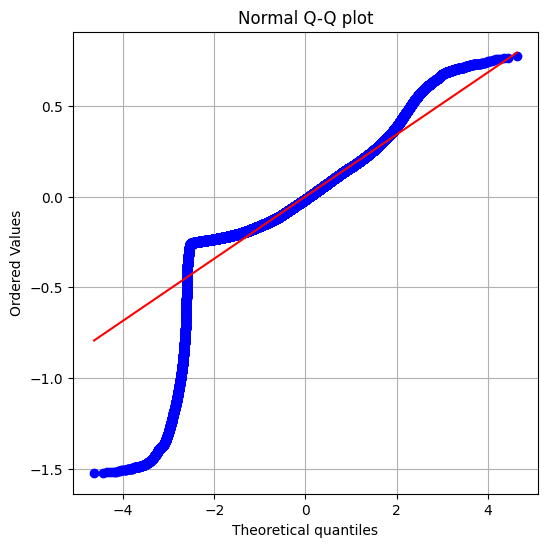

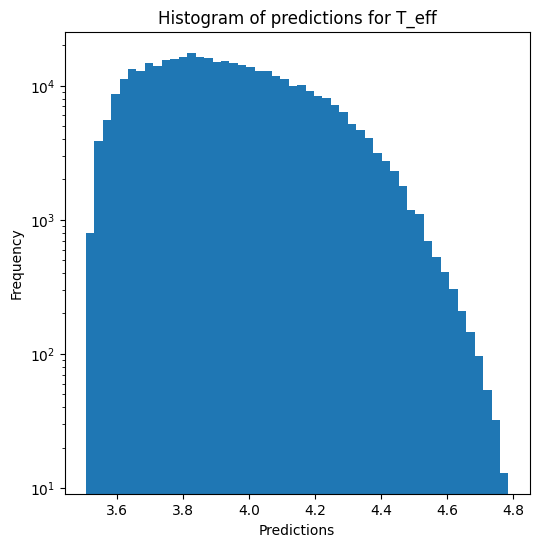

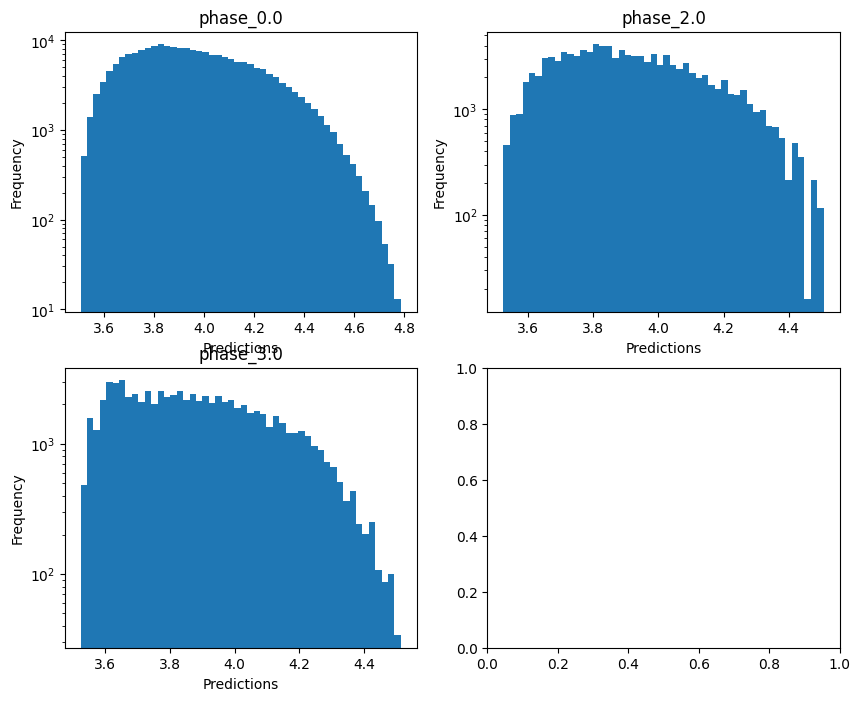

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.772934553719302
  RMSE :  0.9143154335130173
  MAE :  0.7541061464476594
  MedAE :  0.6285800814216977
  CORR :  0.46160986539202076
  MAX_ER :  3.143405040112451
  Percentiles : 
    75th percentile :  1.0828257125100076
    90th percentile :  1.547394333891552
    95th percentile :  1.7577891601442828
    99th percentile :  2.0829169902917624

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.10772737067321458
  RMSE :  1.0630741445215628
  MAE :  0.8372580762356999
  MedAE :  0.684743051485647
  CORR :  0.359030741656177
  MAX_ER :  2.8146735058666805
  Percentiles : 
    75th percentile :  1.262551004637639
    90th percentile :  1.8205698720817165
    95th percentile :  2.1473333316221797
    99th percentile :  2.5551348723974527

log_g results for the phase categ

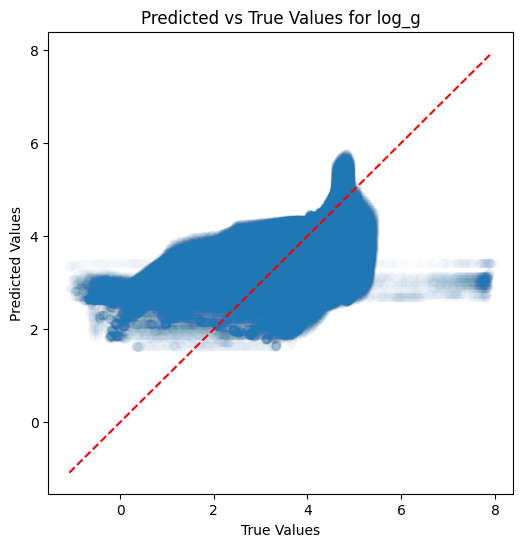

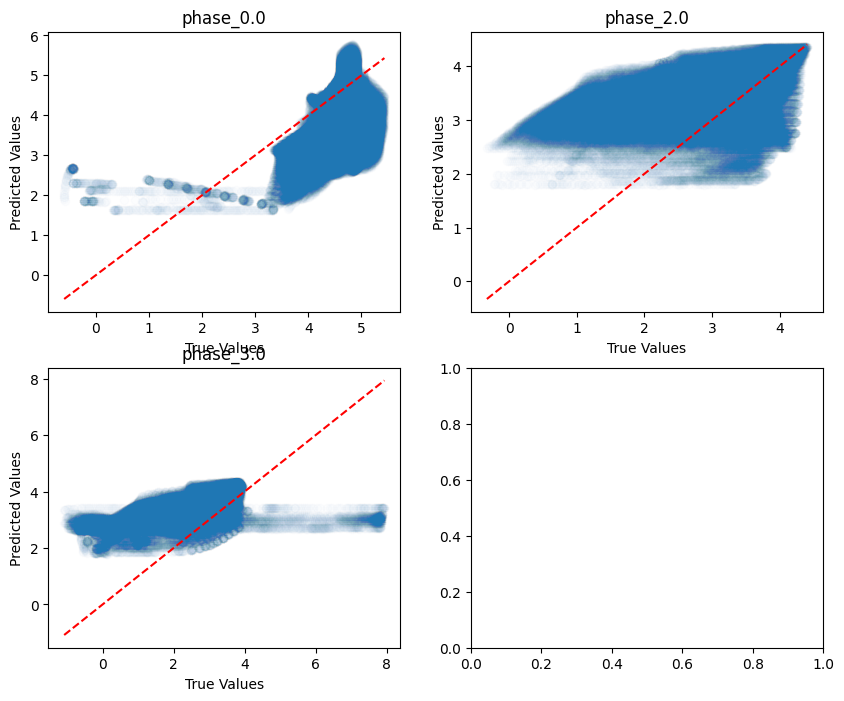

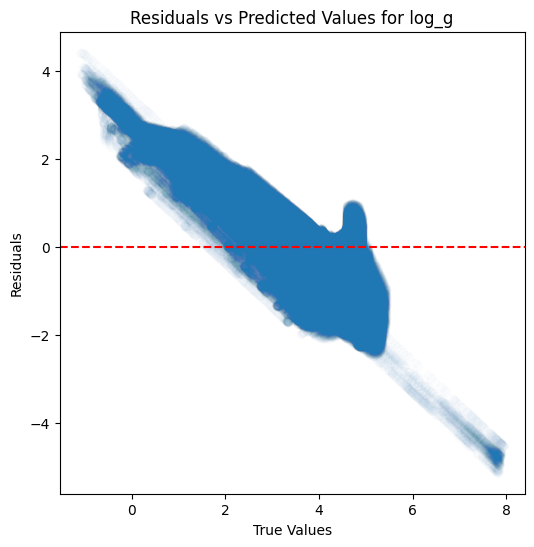

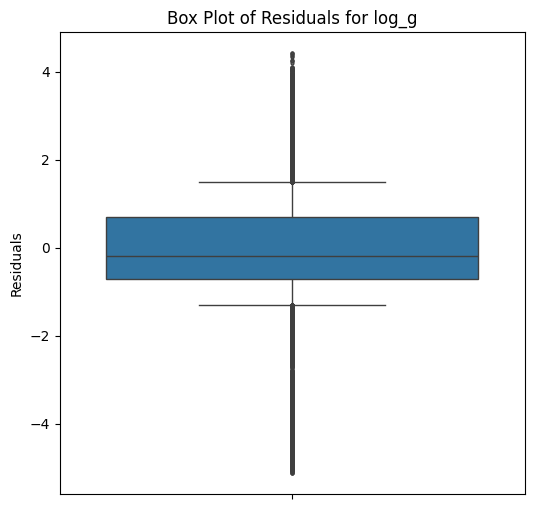

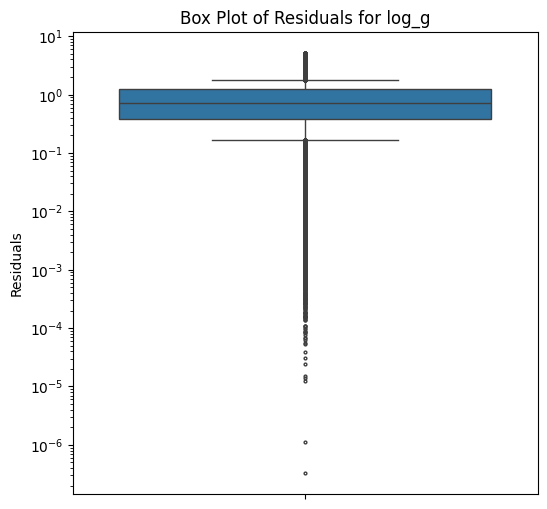

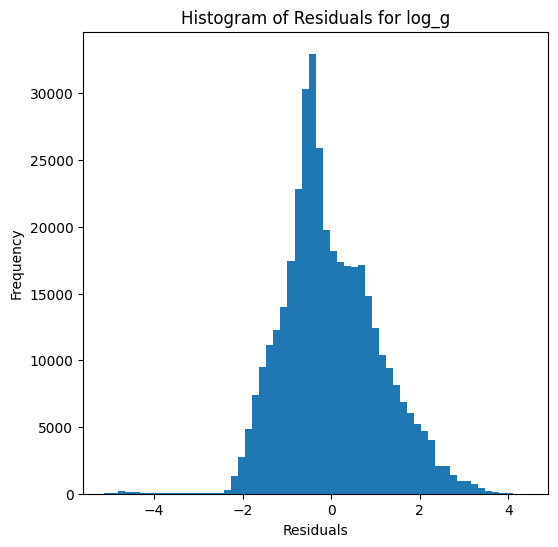

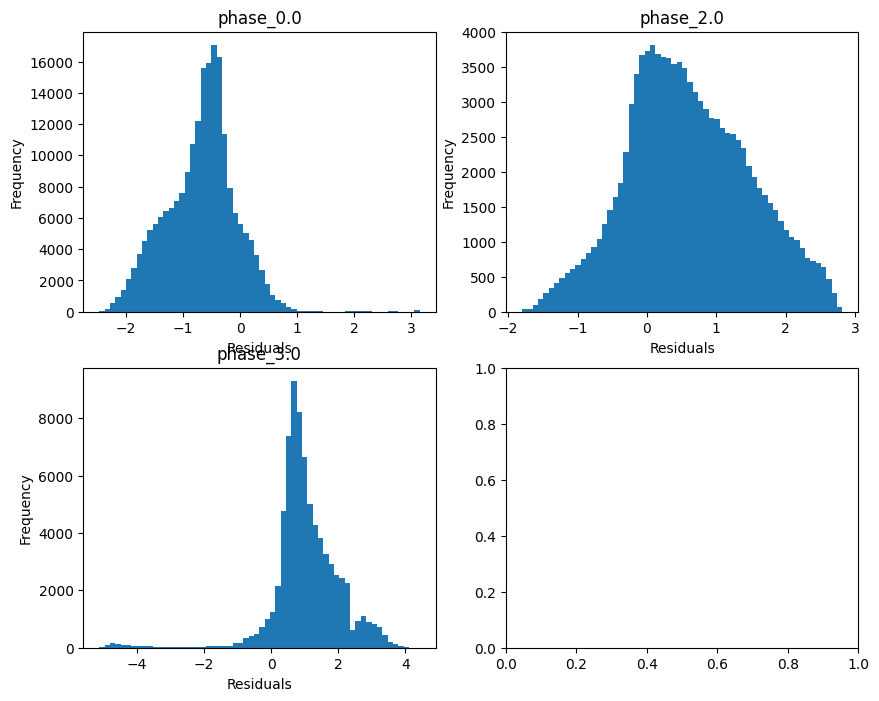

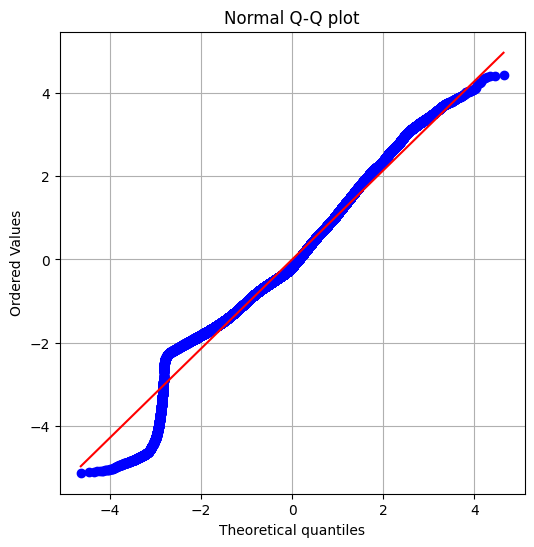

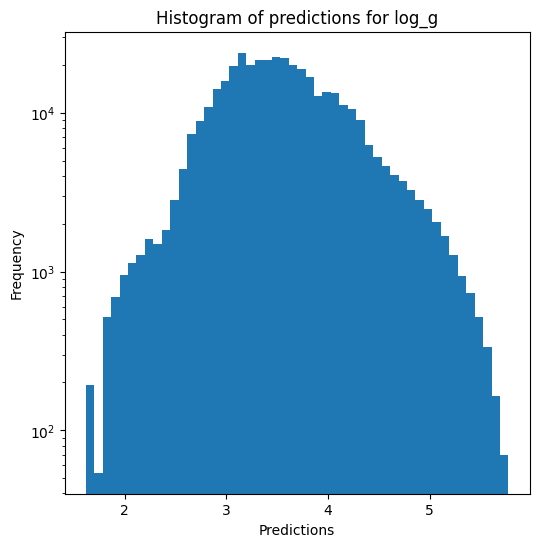

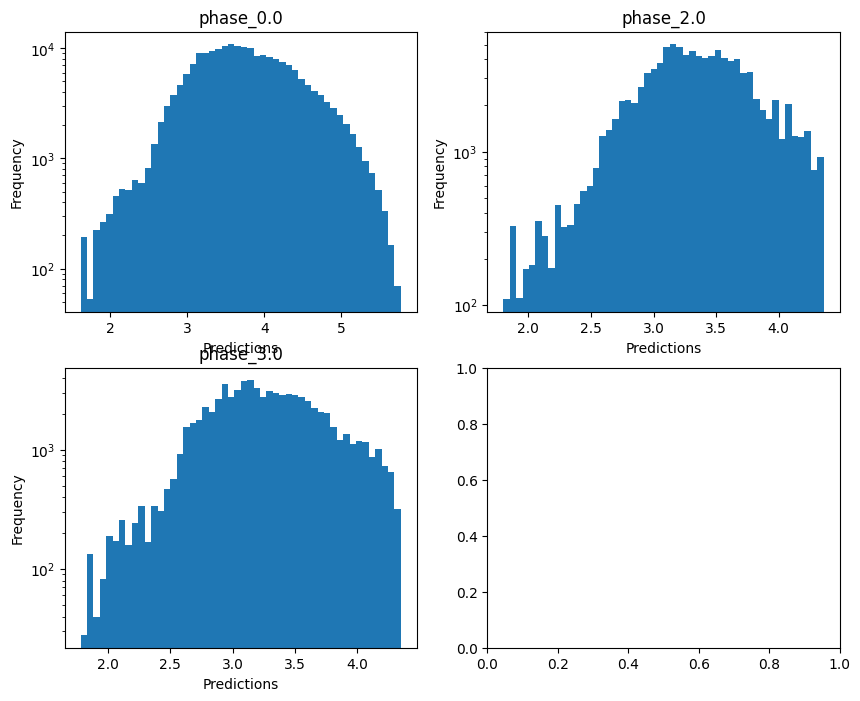


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.24852229160709727
  RMSE :  0.5266448985146538
  MAE :  0.40855426759452557
  MedAE :  0.30310962126577445
  CORR :  0.6055029725990131
  MAX_ER :  1.6518222024052285
  Percentiles : 
    75th percentile :  0.6219933482590301
    90th percentile :  0.9151536770268238
    95th percentile :  1.0686630957855325
    99th percentile :  1.3243730980205866

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.05219894300247496
  RMSE :  0.5700099083555813
  MAE :  0.45951953549876834
  MedAE :  0.3938218105473391
  CORR :  0.413543904373821
  MAX_ER :  1.4294441997880623
  Percentiles : 
    75th percentile :  0.6922775109596424
    90th percentile :  0.9576180436558388
    95th percentile :  1.1095399145123868
    99th percentile :  1.3038179211549101

radius results for the phase category with 

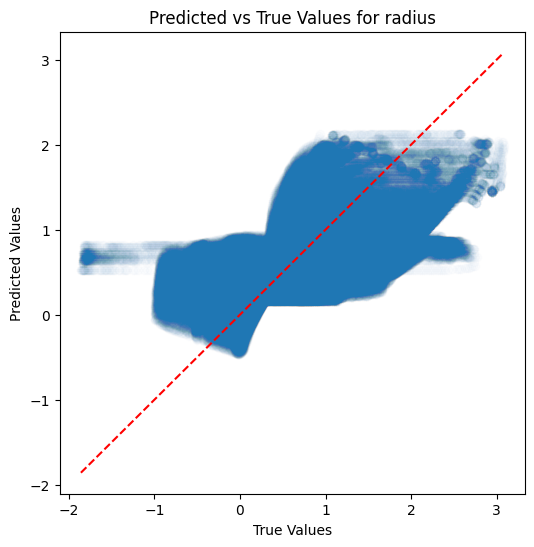

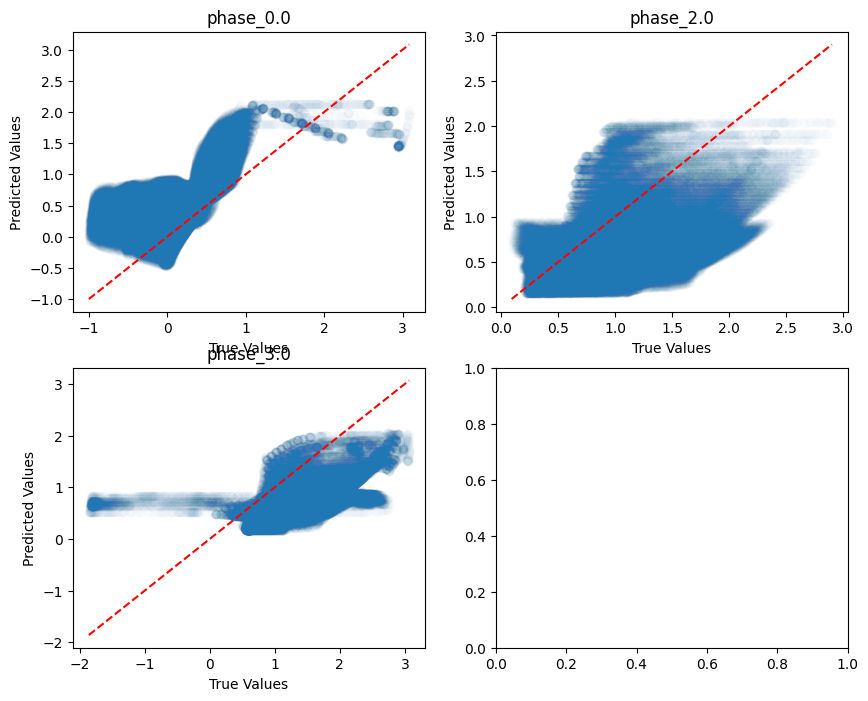

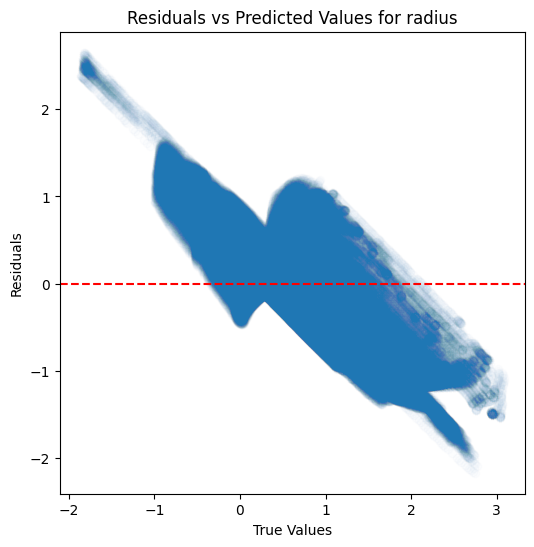

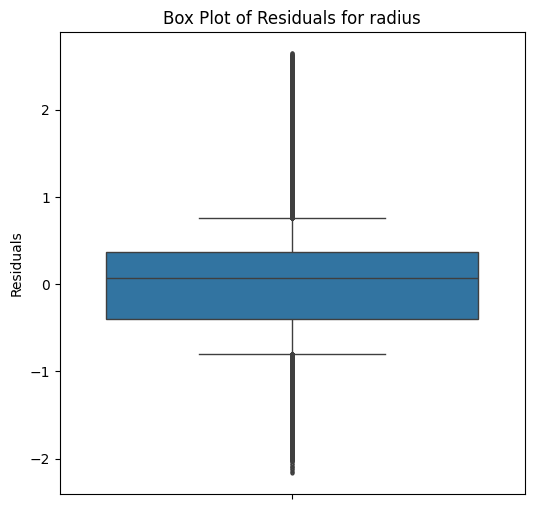

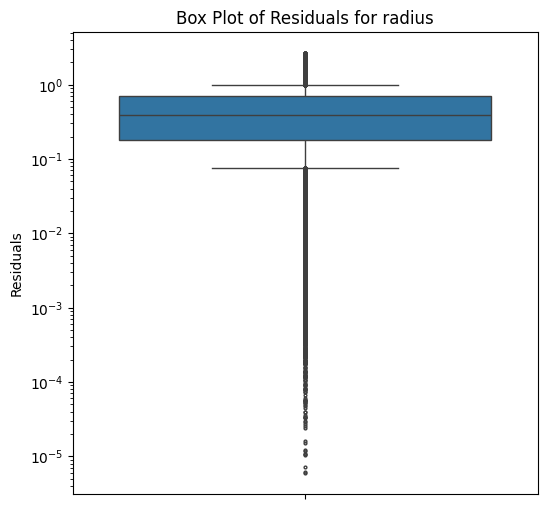

...

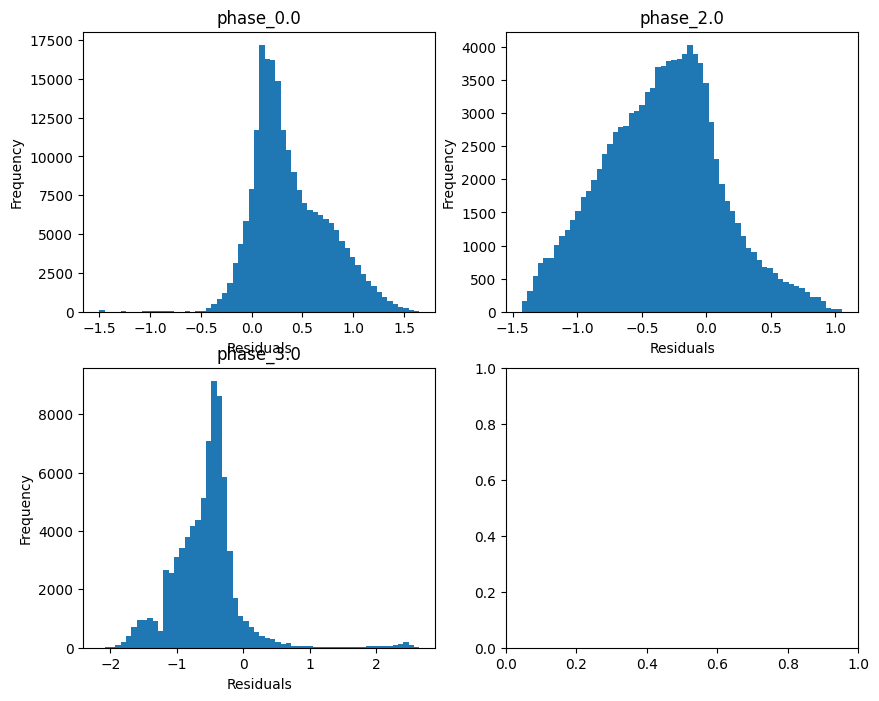

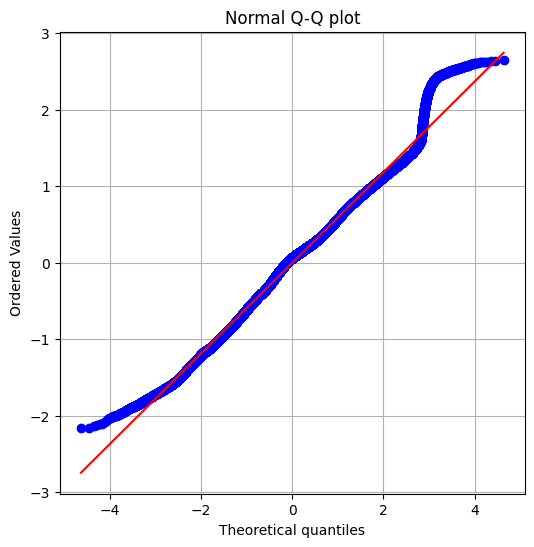

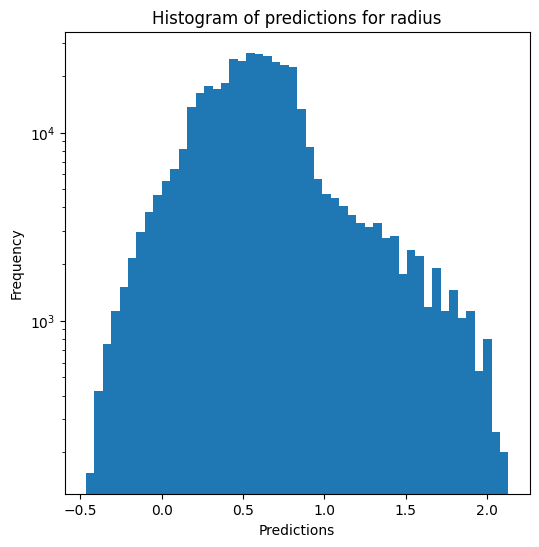

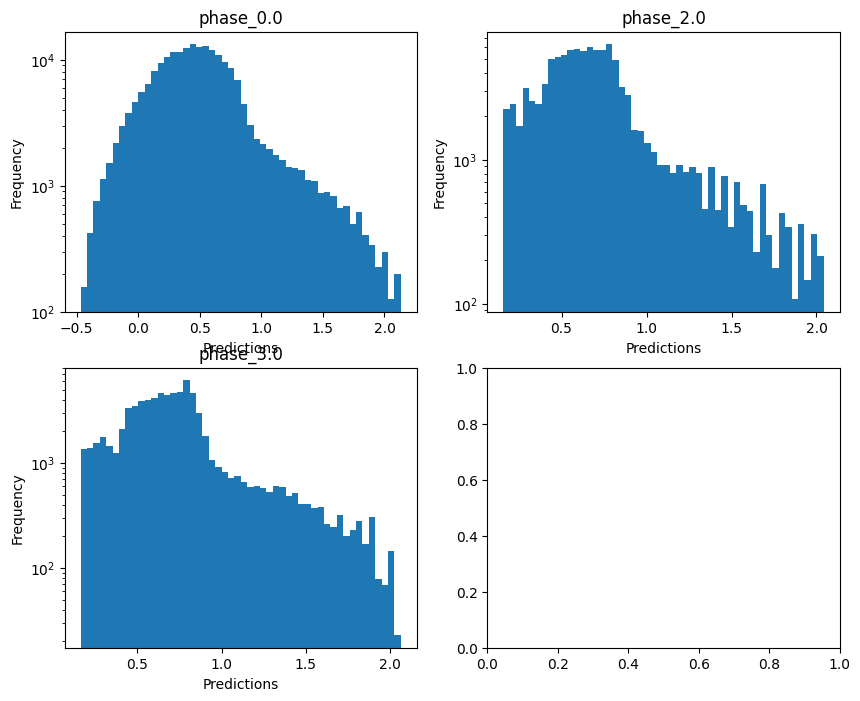

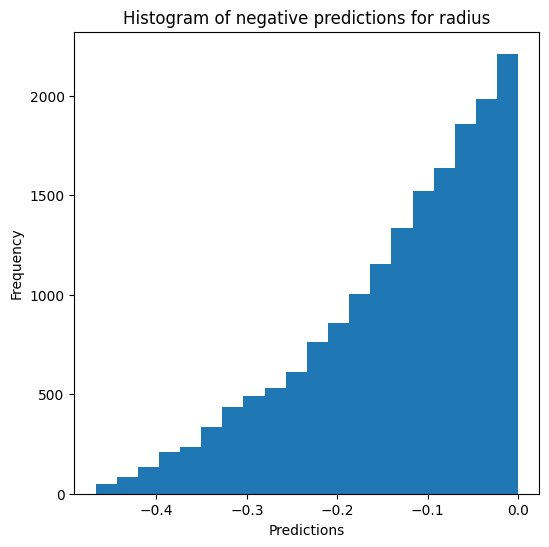

Saving predictions and results...


In [13]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True) # override=False, use_preds=True

### Decision tree

In [14]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9697058103037522
  RMSE :  0.05200193786395361
  MAE :  0.007134429534242776
  MedAE :  0.0010138572166562554
  CORR :  0.9850705104813858
  MAX_ER :  1.6183296565391196
  Percentiles : 
    75th percentile :  0.0022311727259669567
    90th percentile :  0.003989979737731009
    95th percentile :  0.007459494118645222
    99th percentile :  0.19593351057606784

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.9293182449392119
  RMSE :  0.06544419801843547
  MAE :  0.02676490197699377
  MedAE :  0.003712504689868723
  CORR :  0.9644001423079157
  MAX_ER :  0.8297717313302497
  Percentiles : 
    75th percentile :  0.014535591131230596
    90th percentile :  0.09420407946

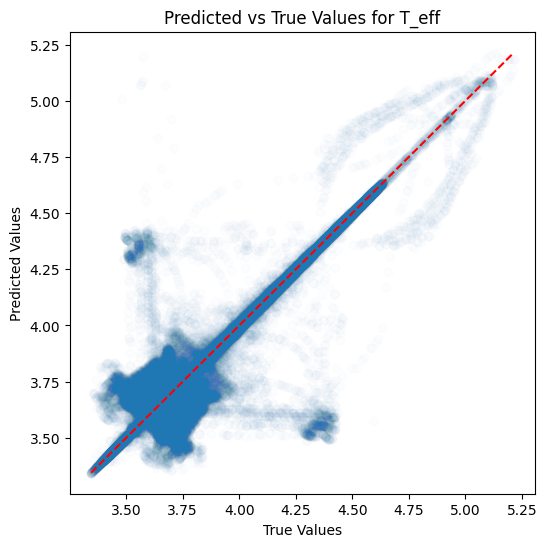

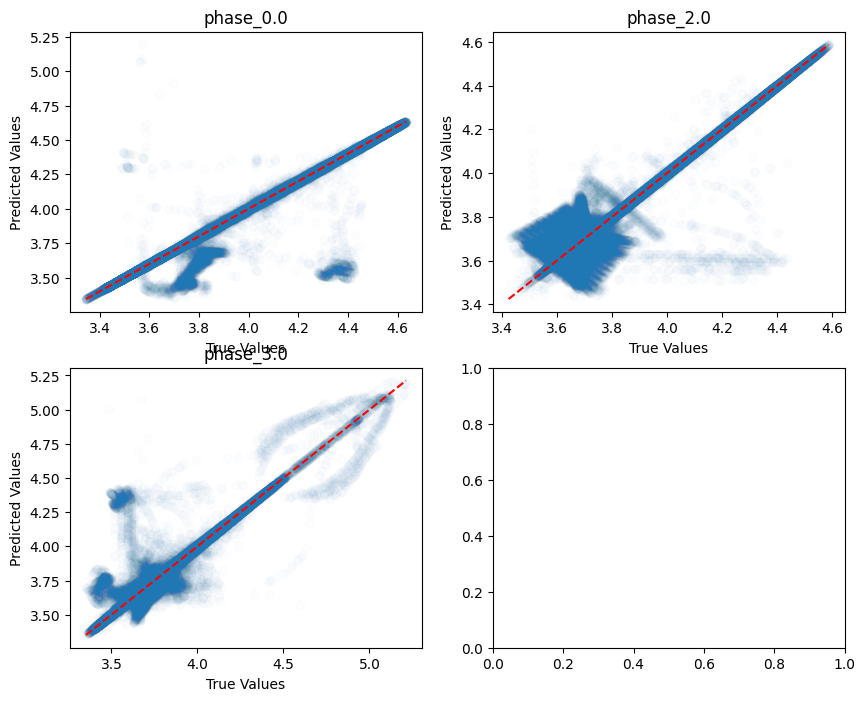

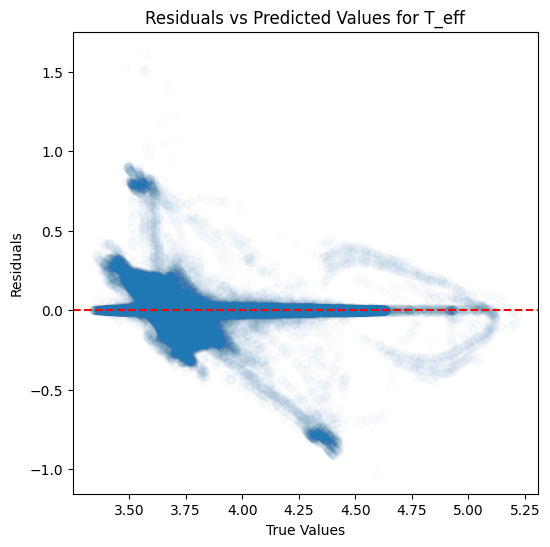

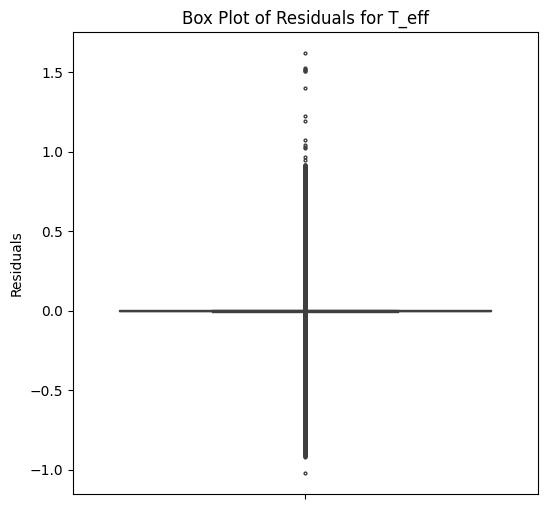

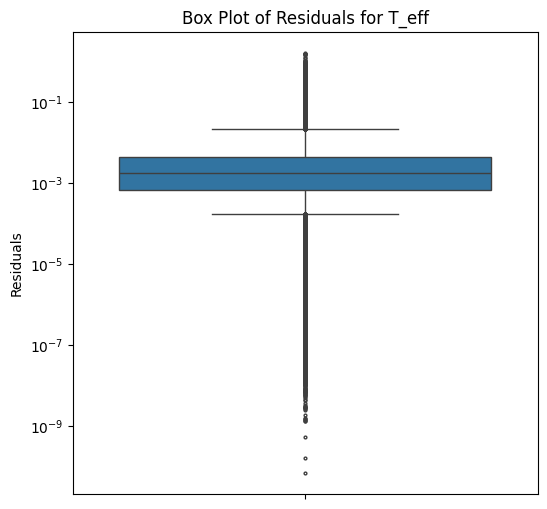

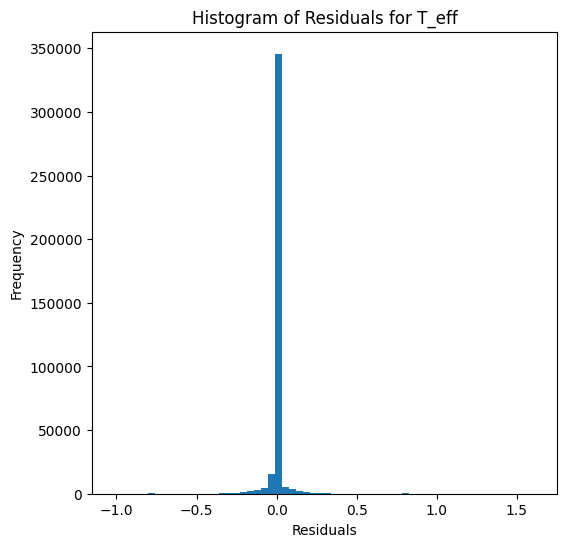

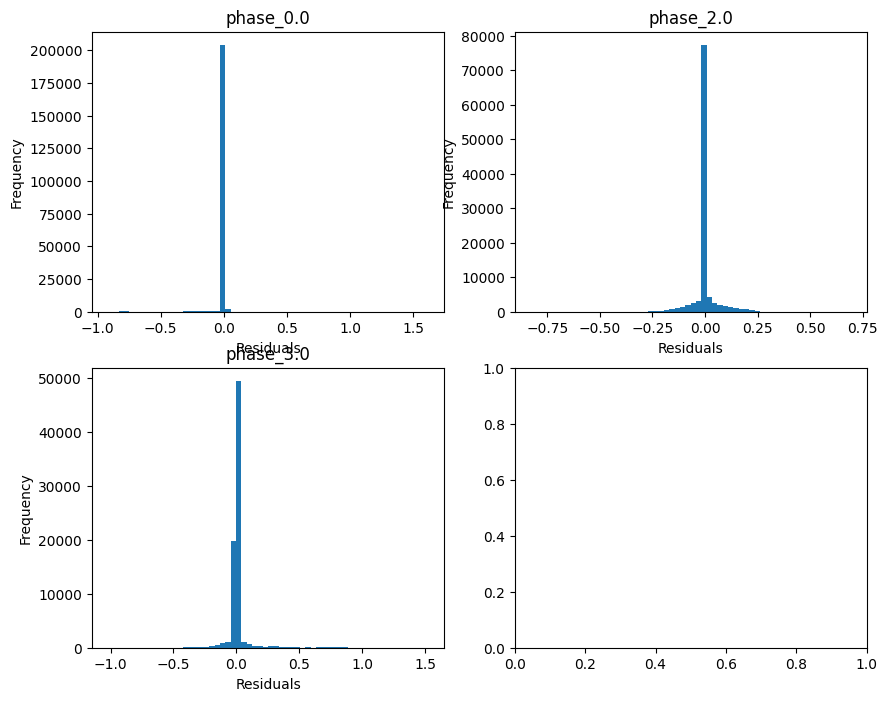

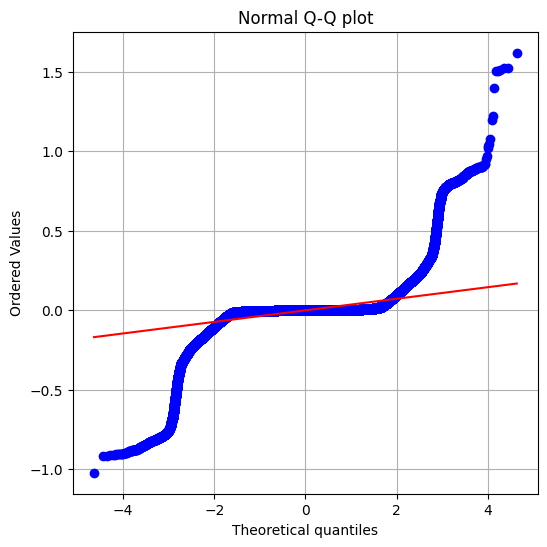

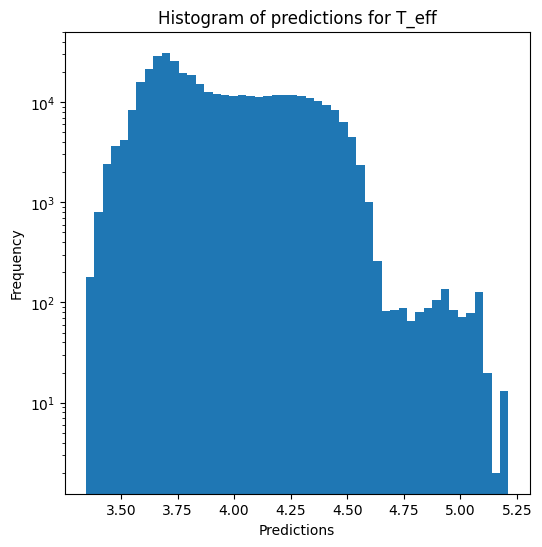

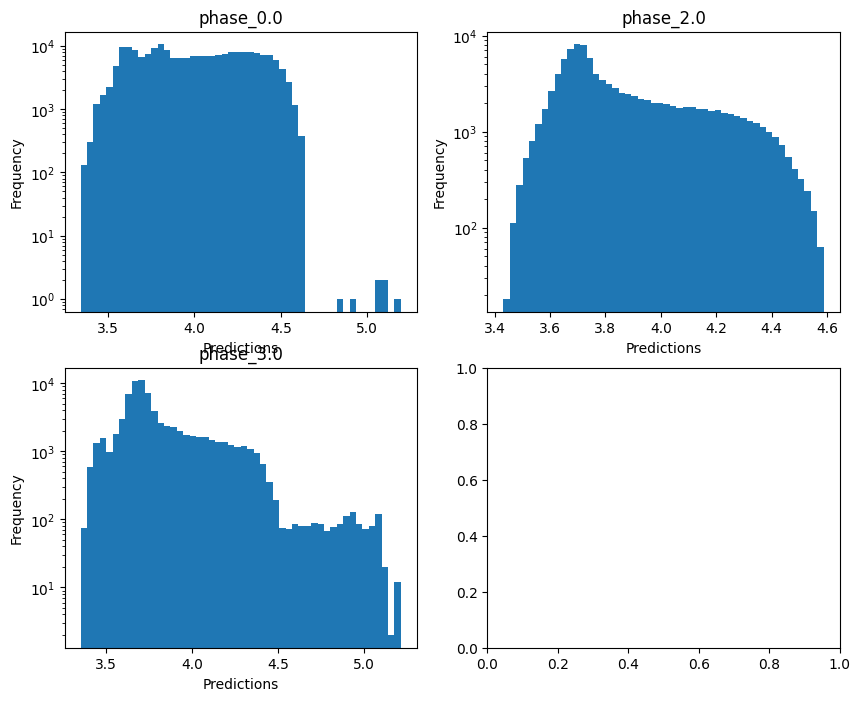


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.040364345114322187
  RMSE :  0.4501939944235145
  MAE :  0.06079311124475576
  MedAE :  0.0036205604475583186
  CORR :  0.7373011953789202
  MAX_ER :  5.676861755991622
  Percentiles : 
    75th percentile :  0.007197808964976016
    90th percentile :  0.01254808995137218
    95th percentile :  0.021464616181369776
    99th percentile :  3.2096780344353557

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  -0.038437688057819
  RMSE :  0.946177521361646
  MAE :  0.42030366113317524
  MedAE :  0.01826473435716558
  CORR :  0.47885666704609026
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  0.25182306539135335
    90th percentile :  1.7540969116474647
    95th percentile :  2.537460820233285
    99th percentile :  3.5376341101124757

log_g results for the phase category w

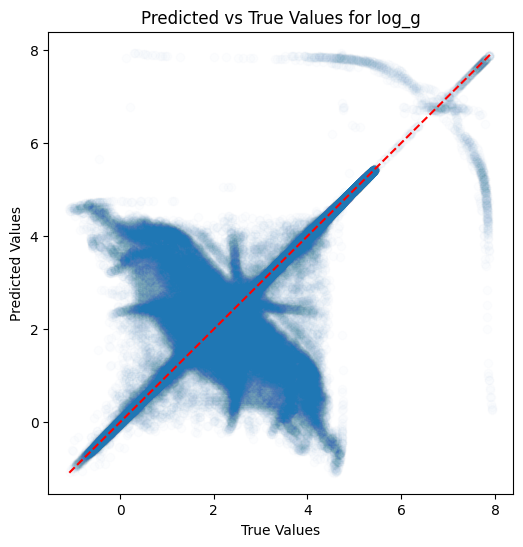

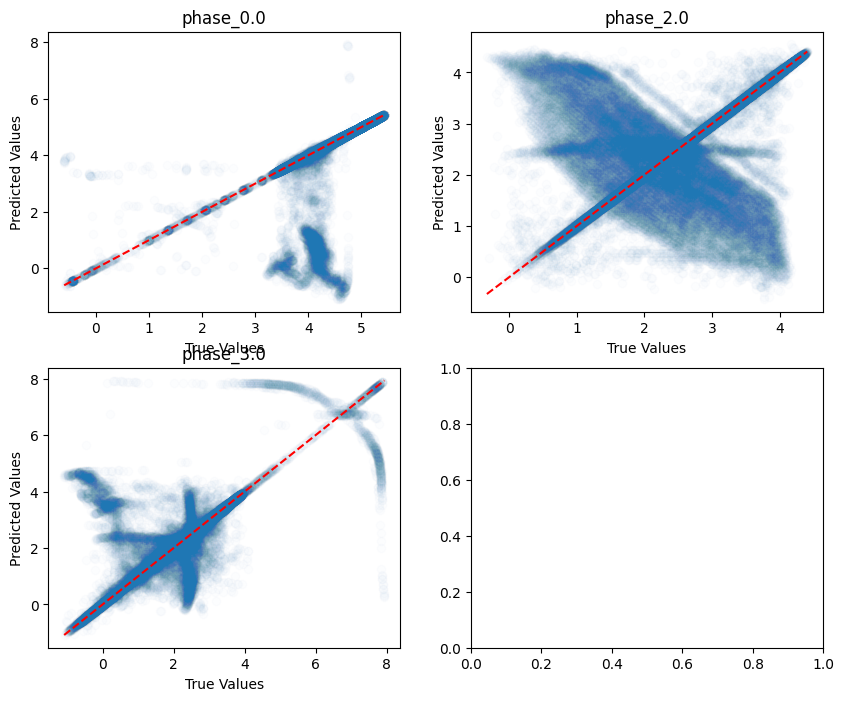

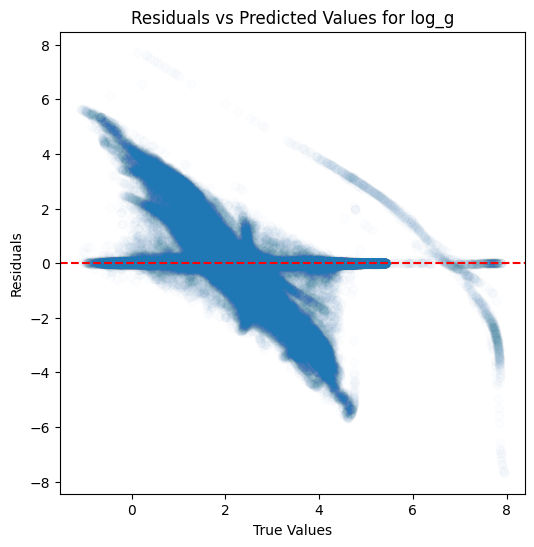

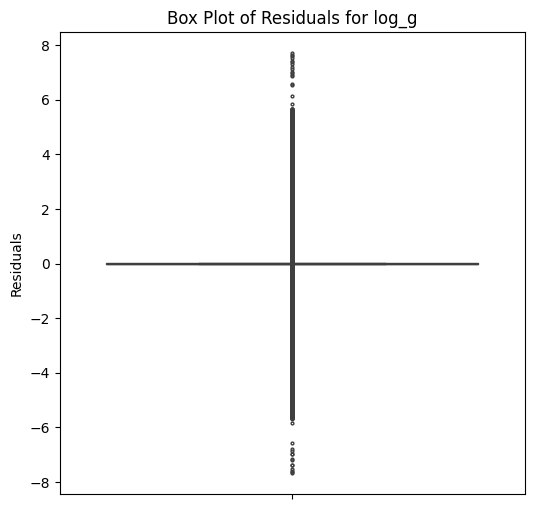

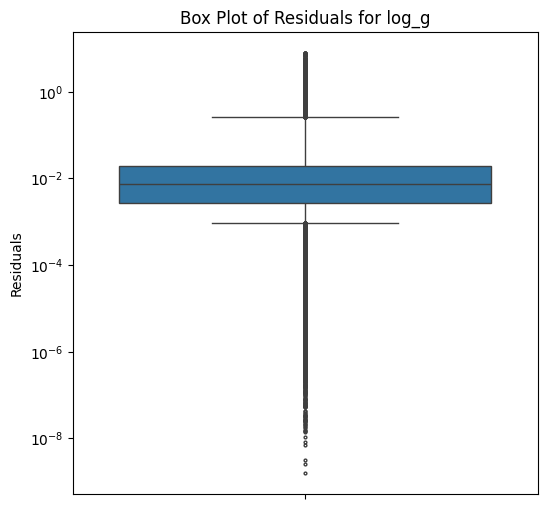

...

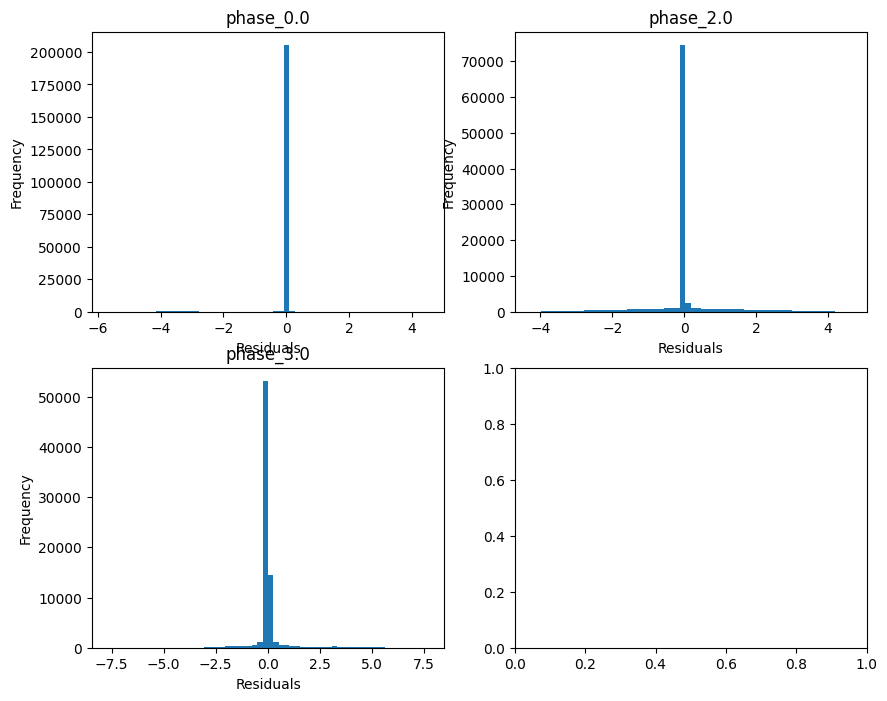

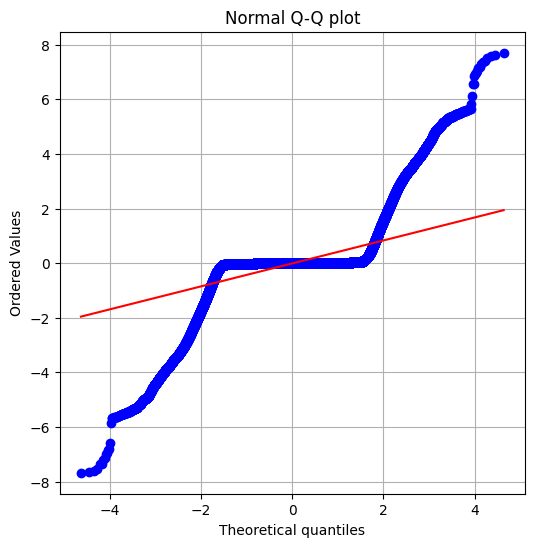

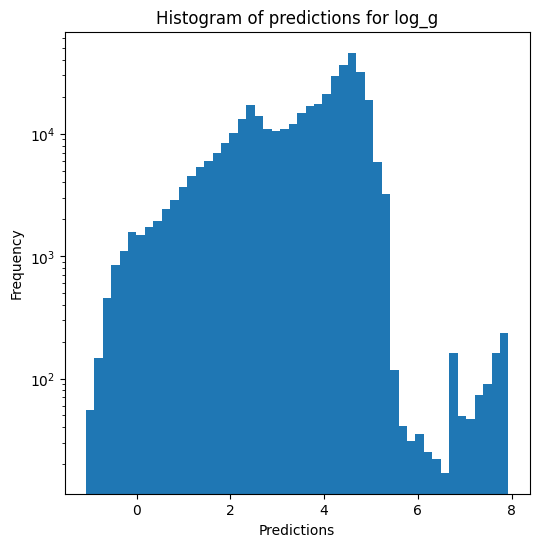

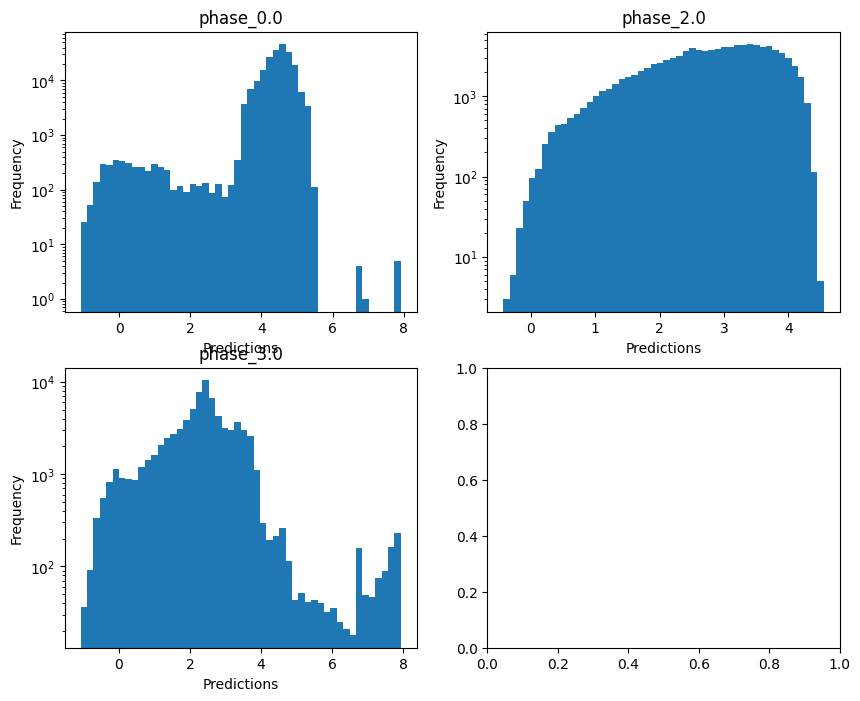

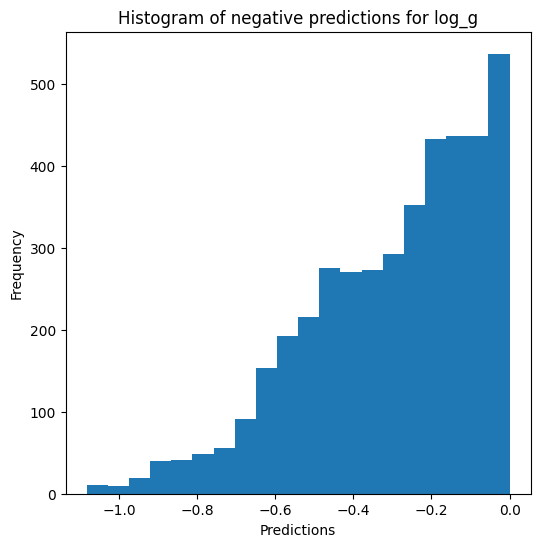


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.7186259733782887
  RMSE :  0.22512793926193692
  MAE :  0.03110105377432857
  MedAE :  0.0024808375702739527
  CORR :  0.8856481453920699
  MAX_ER :  2.838497549427592
  Percentiles : 
    75th percentile :  0.004656432301230584
    90th percentile :  0.007960345911446265
    95th percentile :  0.012325691390776706
    99th percentile :  1.6043401352117908

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  -0.03380878766177697
  RMSE :  0.47308018426291953
  MAE :  0.2101594456276812
  MedAE :  0.009146317550850824
  CORR :  0.49576563108251454
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.12585688169555054
    90th percentile :  0.87700493408826
    95th percentile :  1.2687149490156677
    99th percentile :  1.768668932255583

radius results for the phase cate

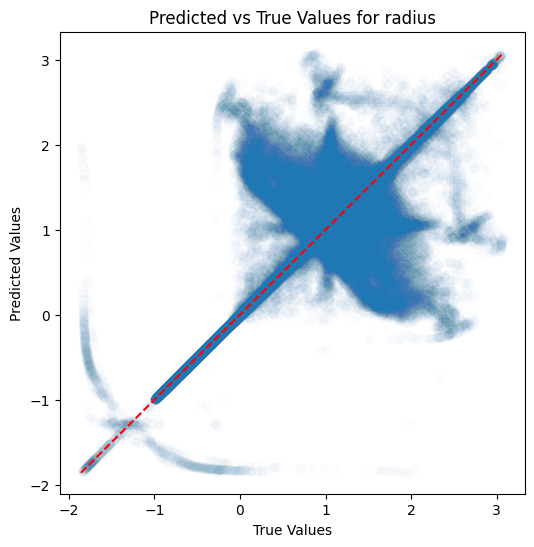

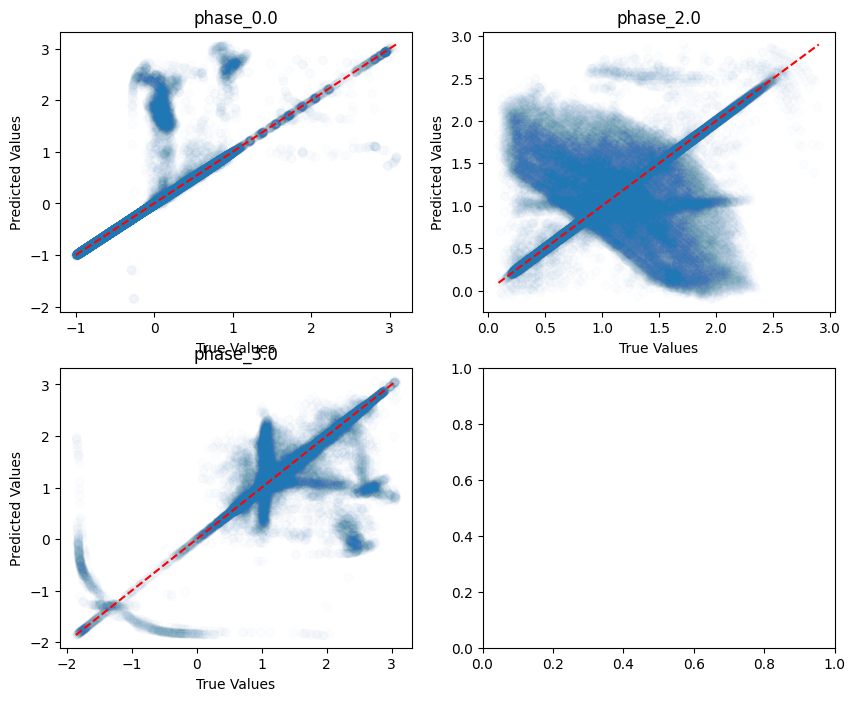

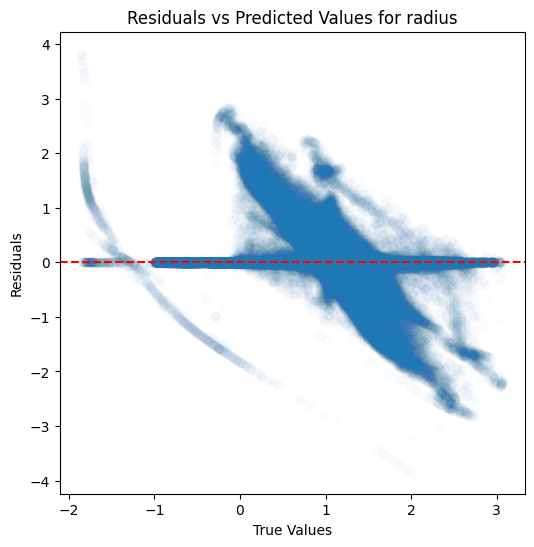

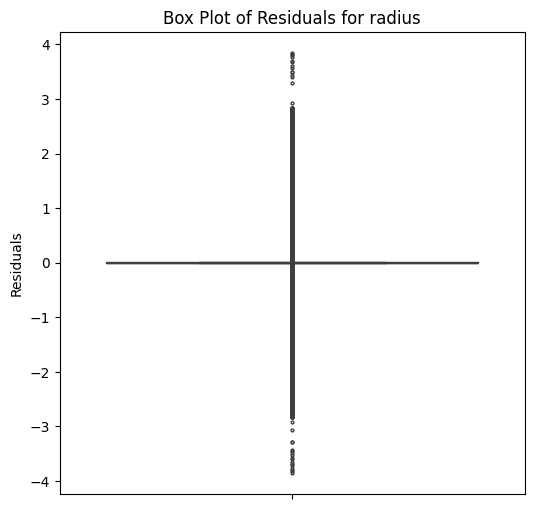

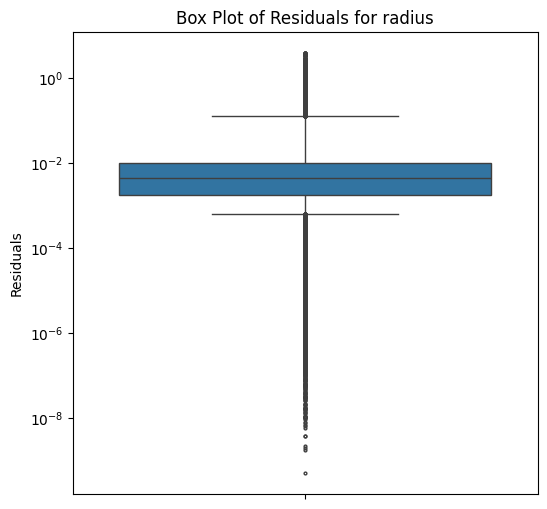

...

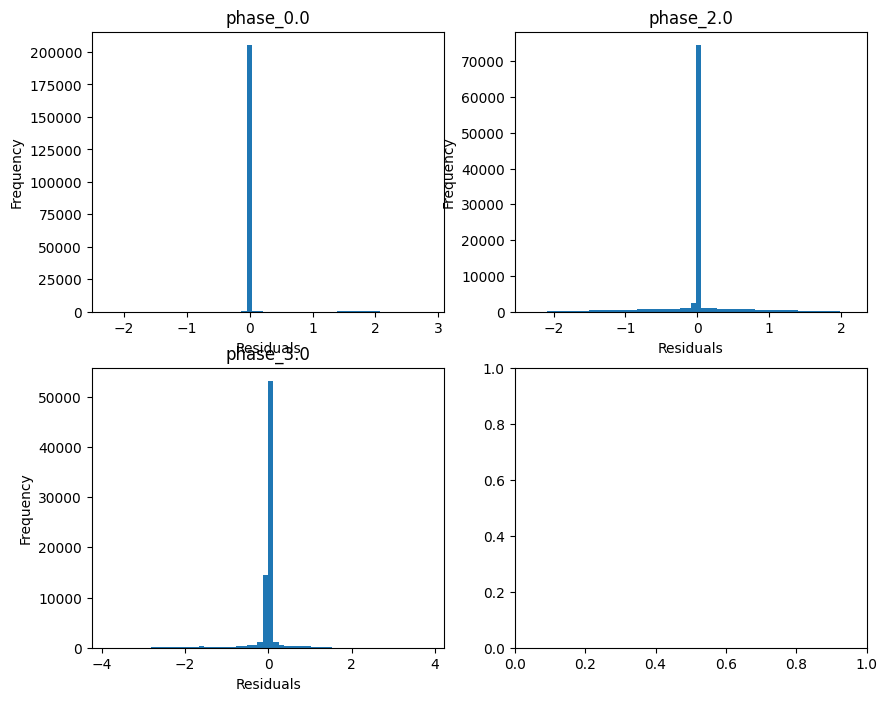

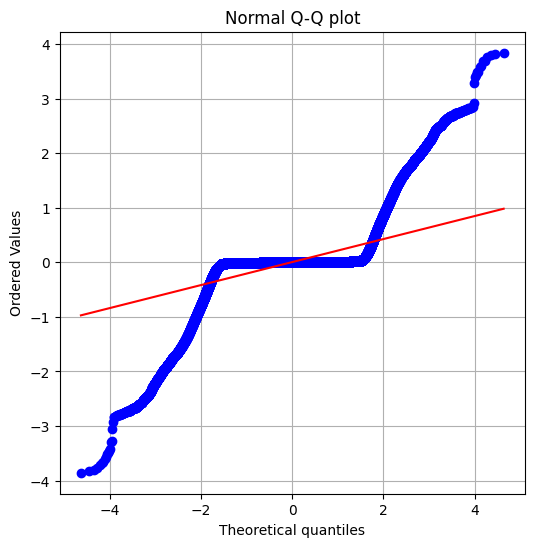

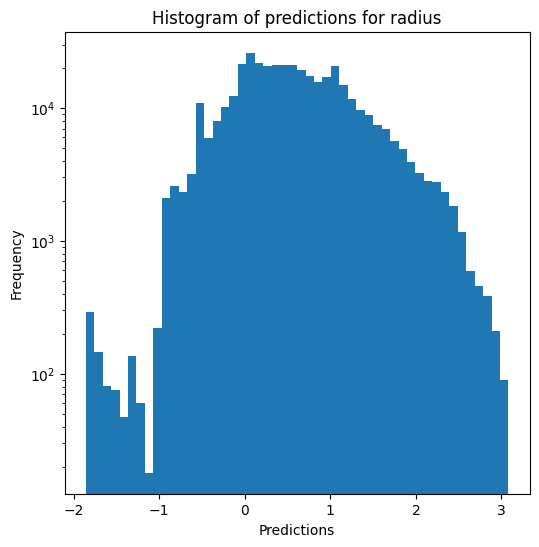

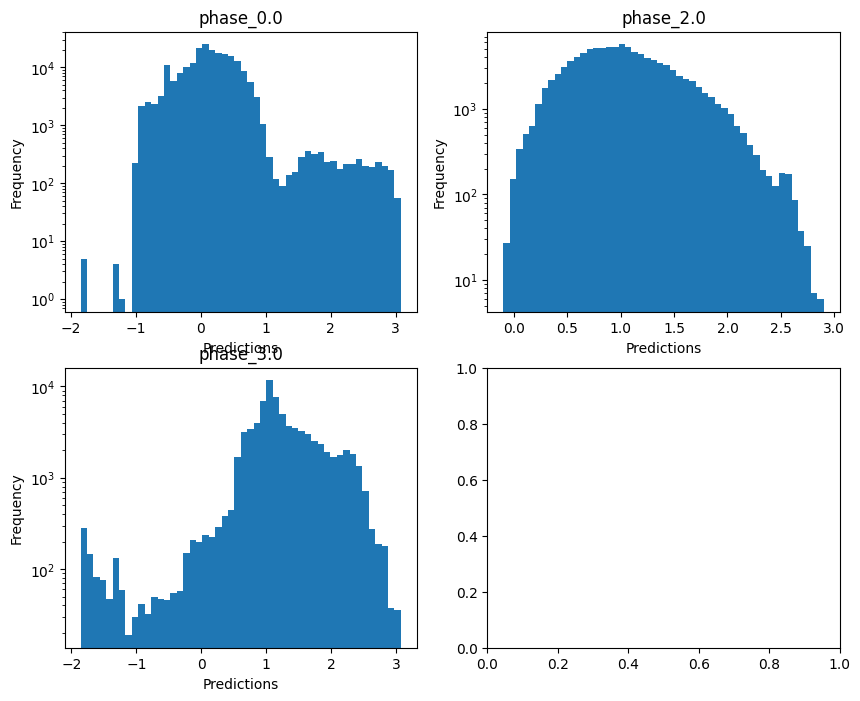

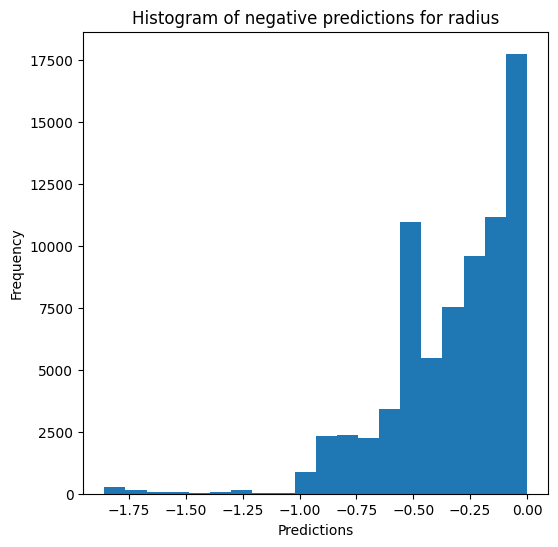

Saving predictions and results...


In [15]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### K-nearest neighbours

In [16]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9796481292703324
  RMSE :  0.042761935936806925
  MAE :  0.007297633784727128
  MedAE :  0.0009875351475678862
  CORR :  0.9898159230567639
  MAX_ER :  1.6250524647433187
  Percentiles : 
    75th percentile :  0.0023285425257872916
    90th percentile :  0.0053434136361425475
    95th percentile :  0.010676111749027713
    99th percentile :  0.1570707251471849

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.9725865388126369
  RMSE :  0.04076563416213259
  MAE :  0.018228877072368515
  MedAE :  0.002662174759885172
  CORR :  0.9862134989016137
  MAX_ER :  0.6982515769958644
  Percentiles : 
    75th percentile :  0.01527684278455066
    90th percentile :  0.0618043086

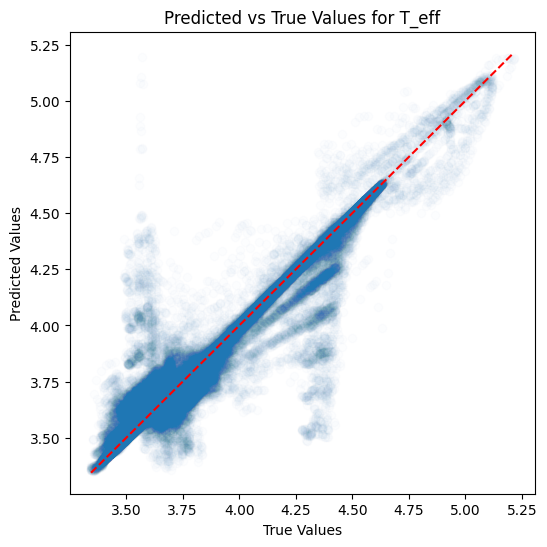

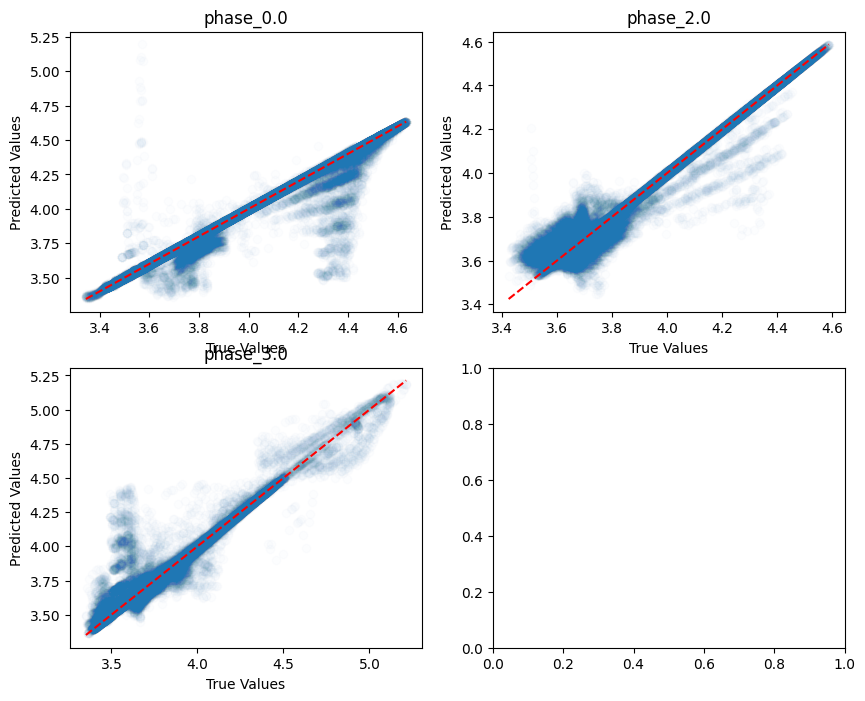

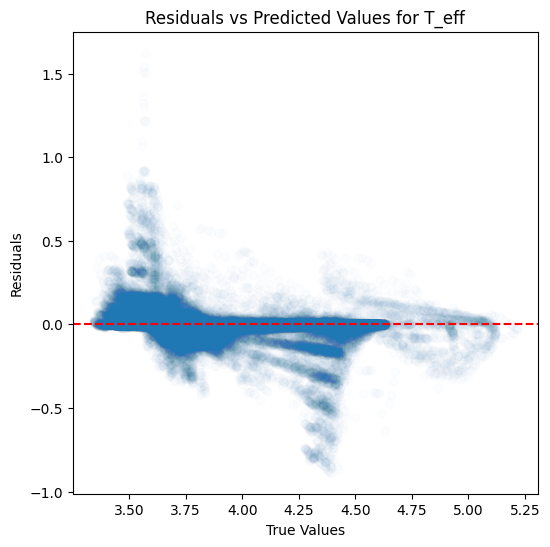

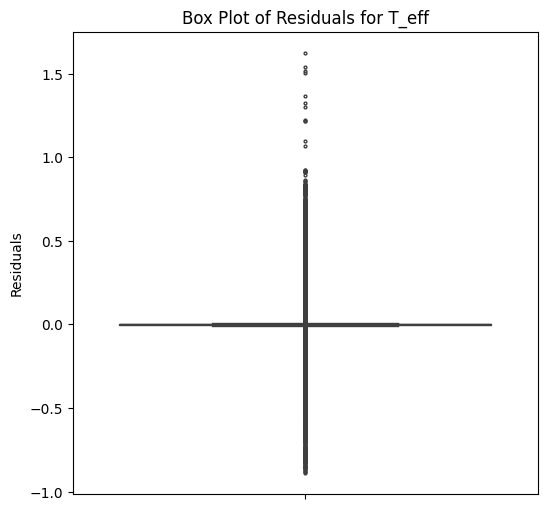

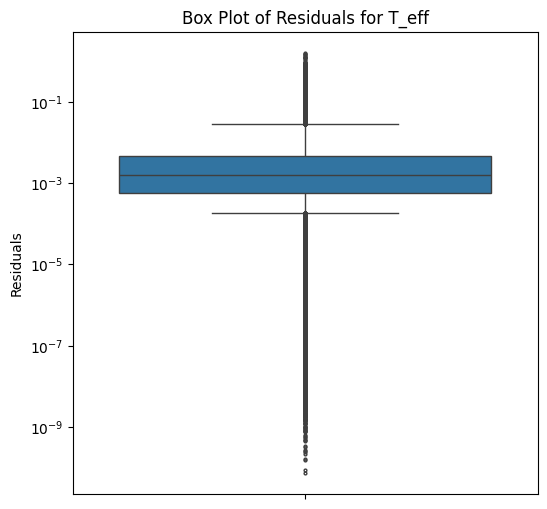

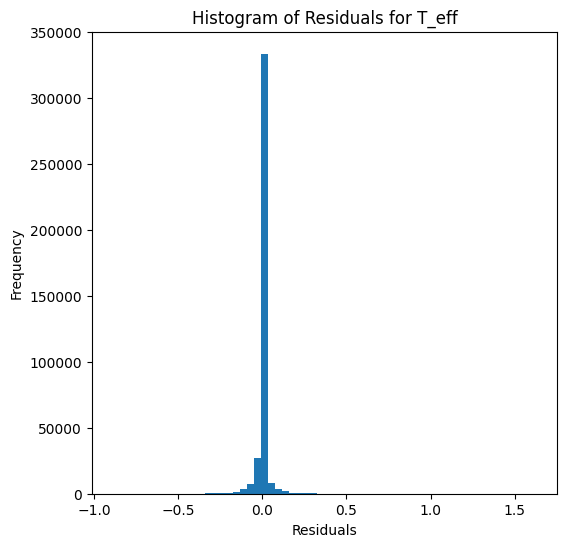

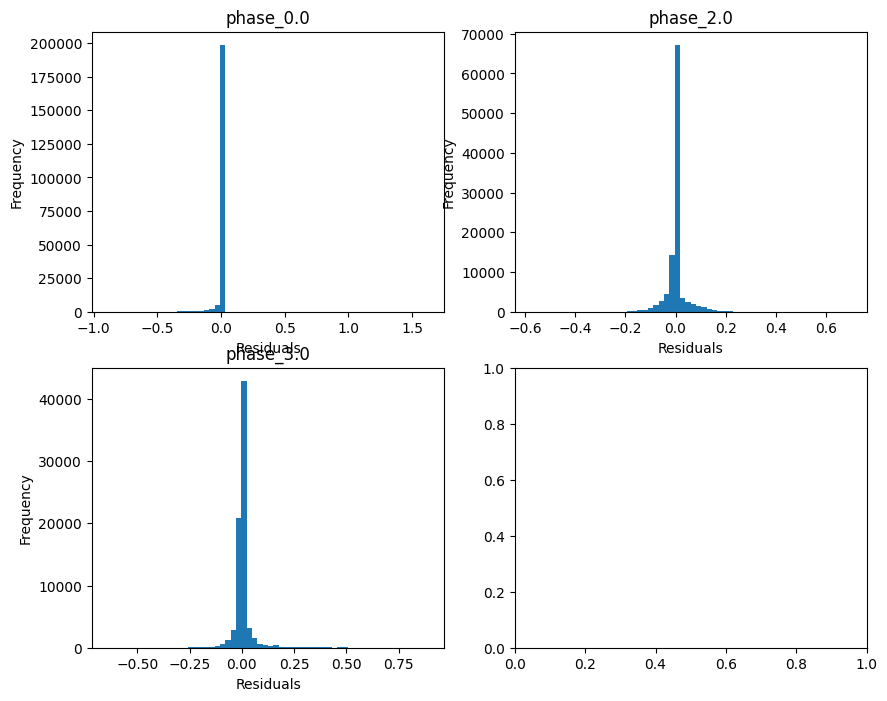

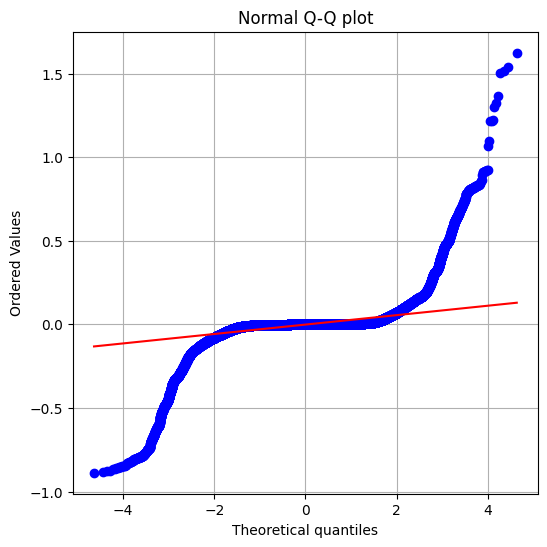

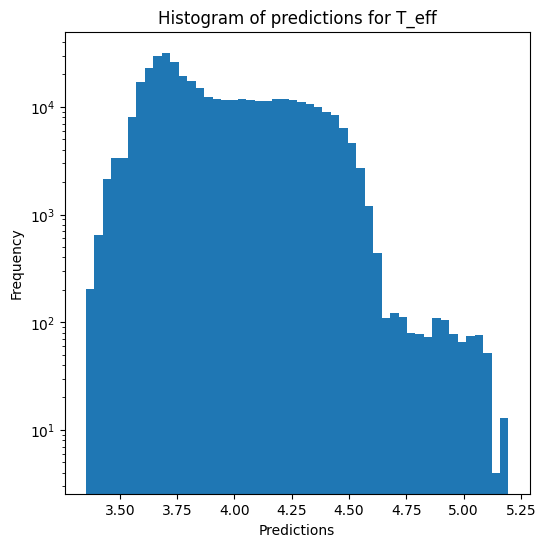

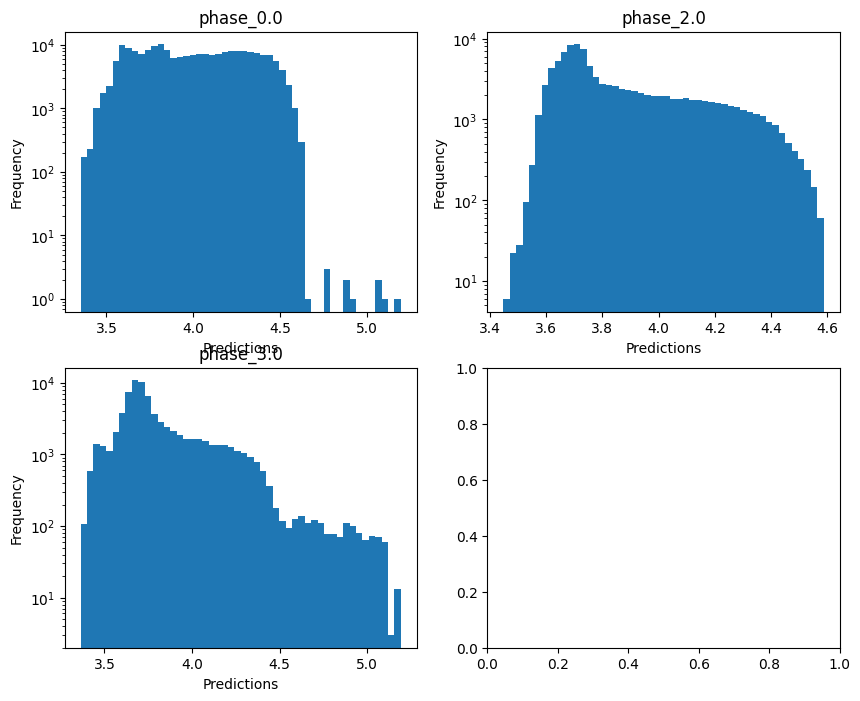


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.4885400666797113
  RMSE :  0.33021073378061483
  MAE :  0.05608389473491097
  MedAE :  0.002547802438244151
  CORR :  0.8335875183983672
  MAX_ER :  5.554949607019481
  Percentiles : 
    75th percentile :  0.00651057847459402
    90th percentile :  0.01876485029190623
    95th percentile :  0.061636529076132124
    99th percentile :  1.7910230323298013

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.5325672683991692
  RMSE :  0.6351597003171418
  MAE :  0.2927821181151094
  MedAE :  0.01302331593685313
  CORR :  0.7362336777073687
  MAX_ER :  4.322330485464448
  Percentiles : 
    75th percentile :  0.3080344510716335
    90th percentile :  1.123015208016411
    95th percentile :  1.6079967590733688
    99th percentile :  2.4036421105557446

log_g results for the phase category with a

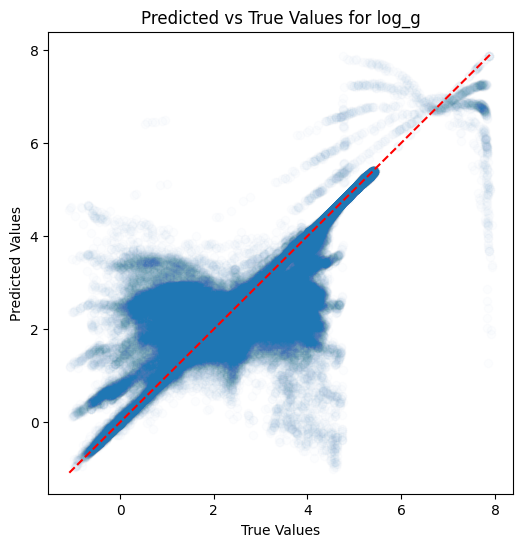

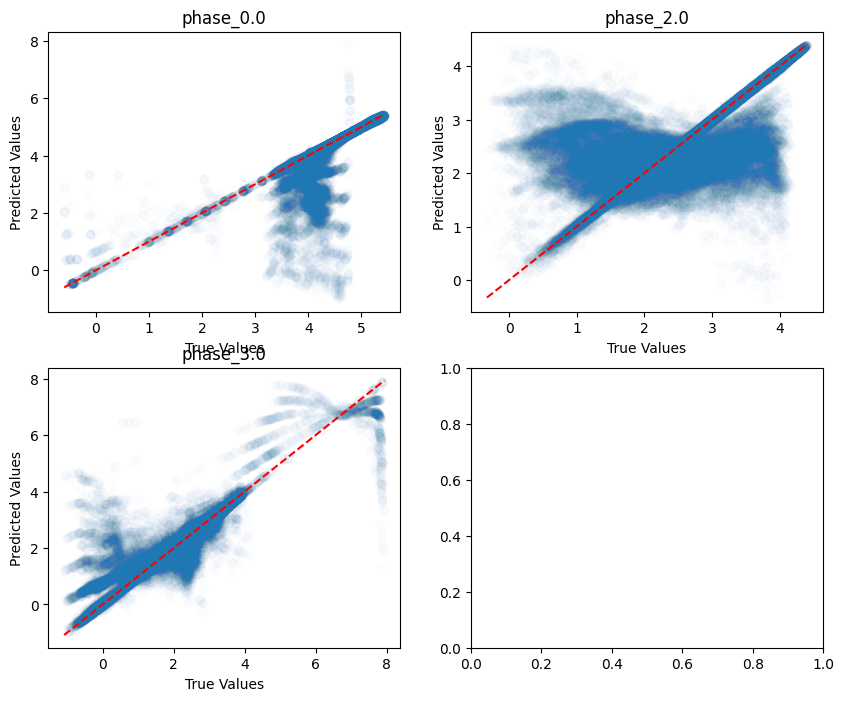

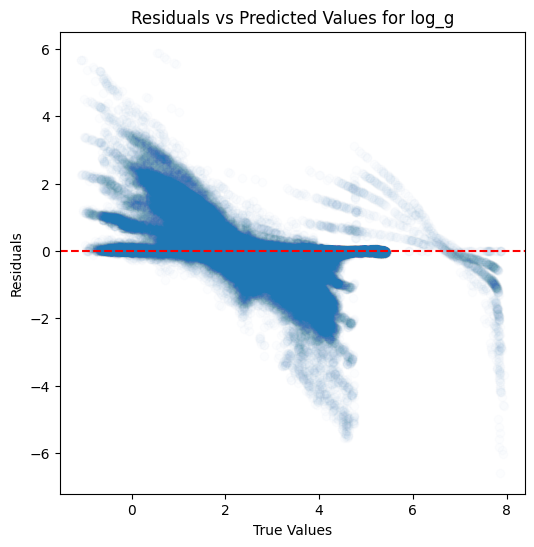

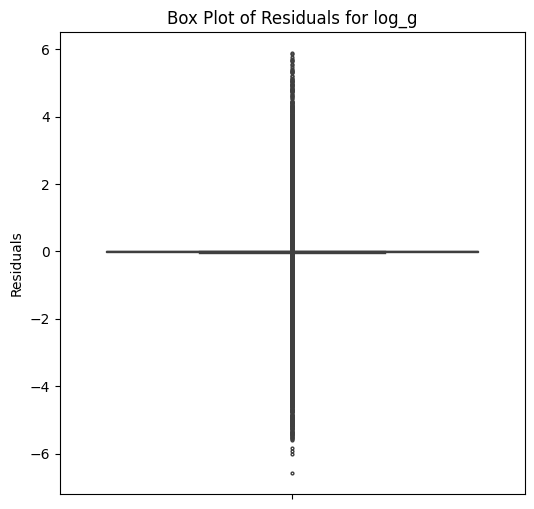

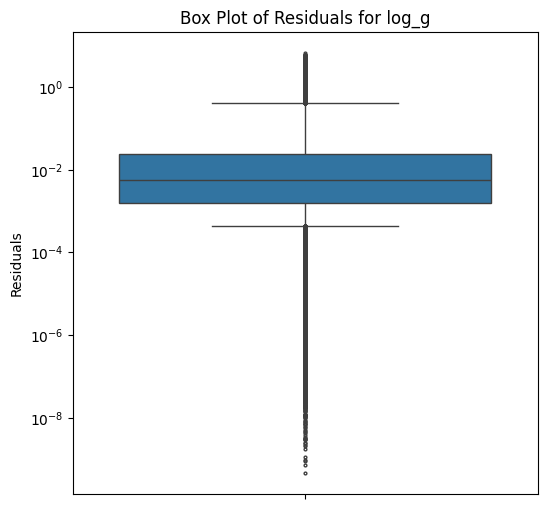

...

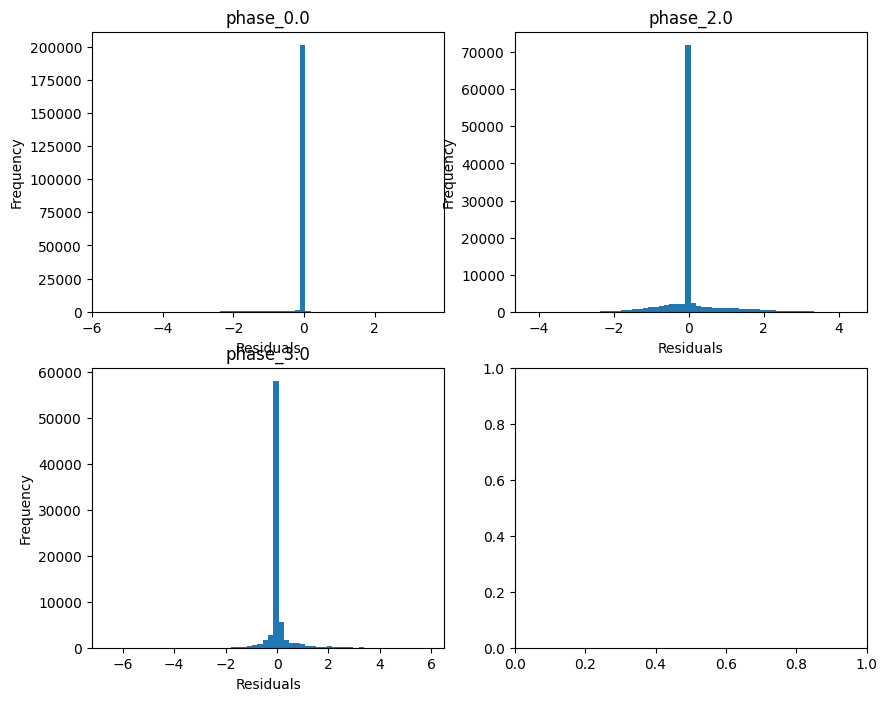

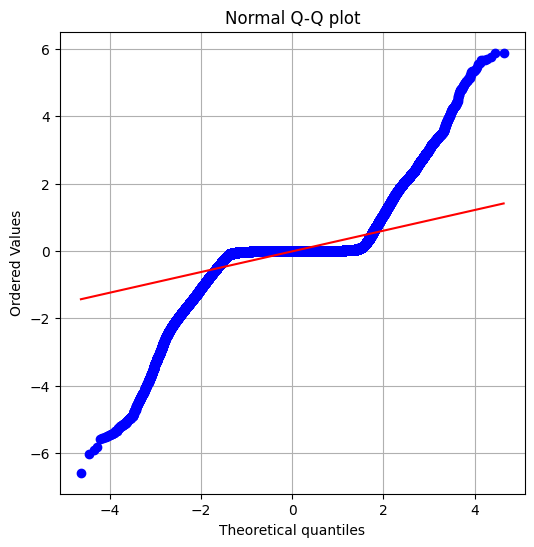

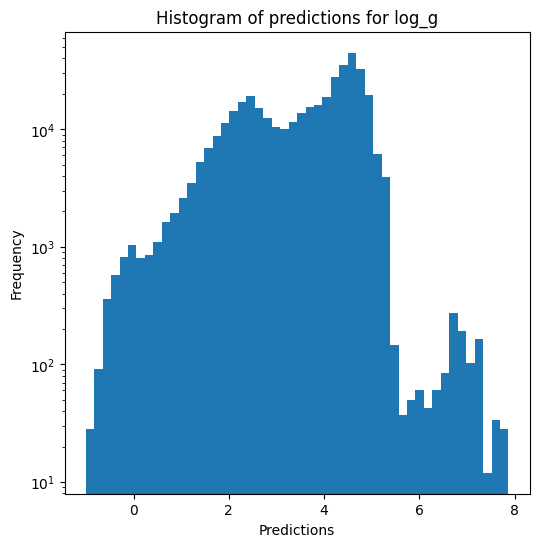

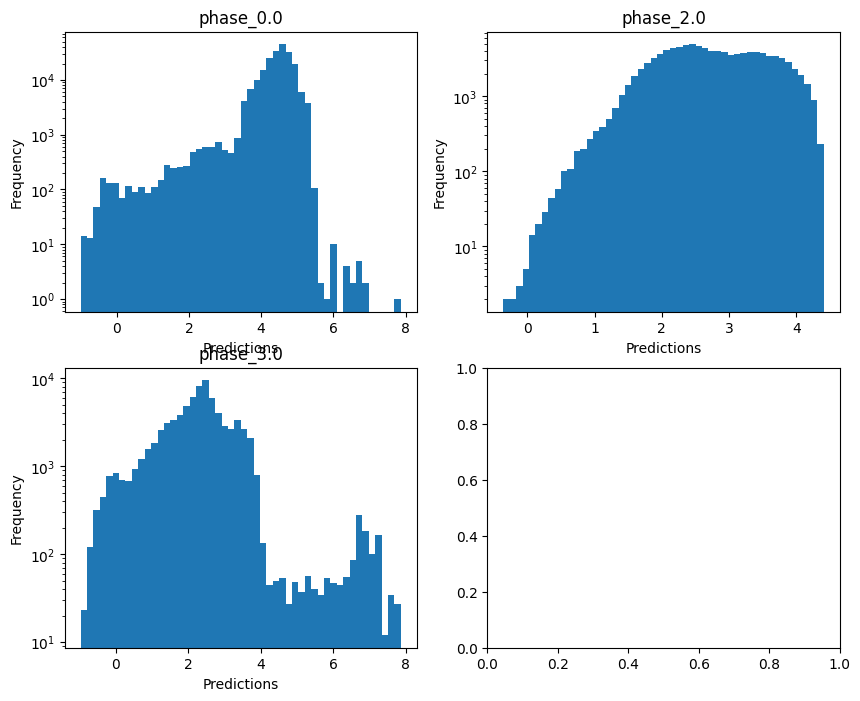

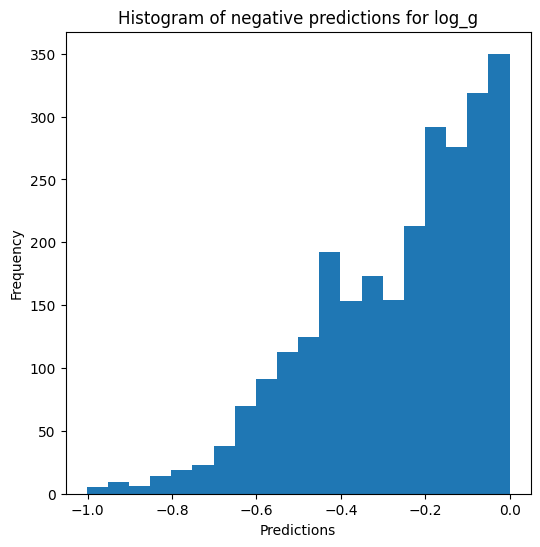


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.8499542423563928
  RMSE :  0.16517101788589067
  MAE :  0.02913127333515771
  MedAE :  0.0019423664536172168
  CORR :  0.9354993552782849
  MAX_ER :  2.778469186433447
  Percentiles : 
    75th percentile :  0.00484688205542233
    90th percentile :  0.013715137843366473
    95th percentile :  0.03579245836520026
    99th percentile :  0.895738140220542

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.5346516431131223
  RMSE :  0.31757371745799856
  MAE :  0.1463952874579565
  MedAE :  0.006528534513789541
  CORR :  0.7412330618524818
  MAX_ER :  2.1618903148847237
  Percentiles : 
    75th percentile :  0.1540146853906812
    90th percentile :  0.5614250508511174
    95th percentile :  0.8039484286979217
    99th percentile :  1.2017606238190264

radius results for the phase category

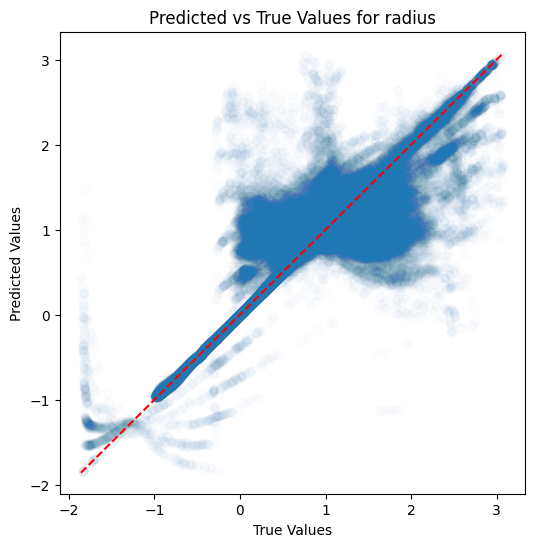

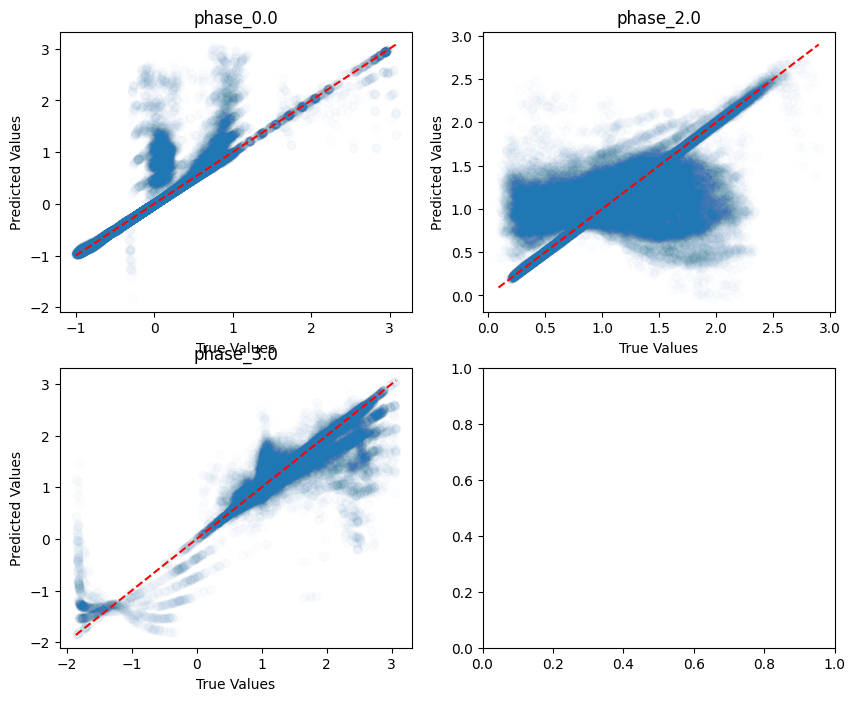

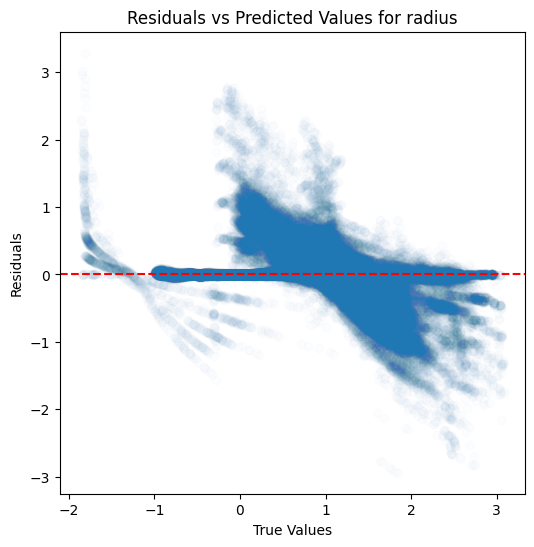

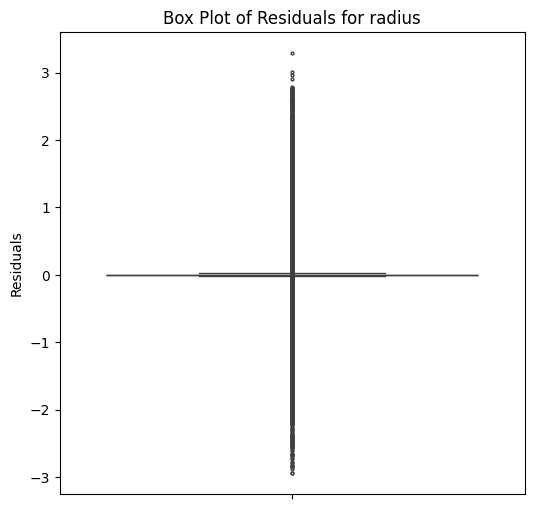

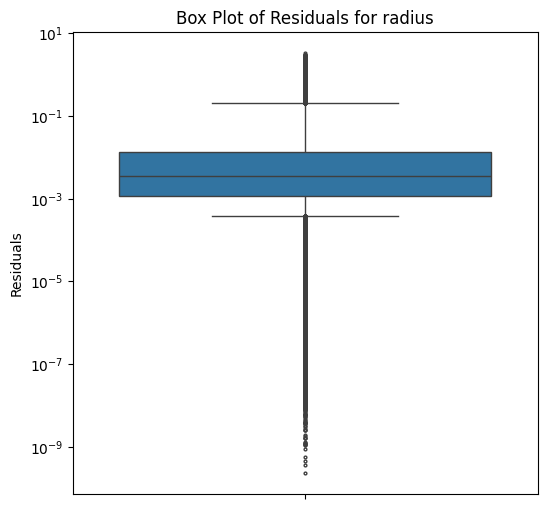

...

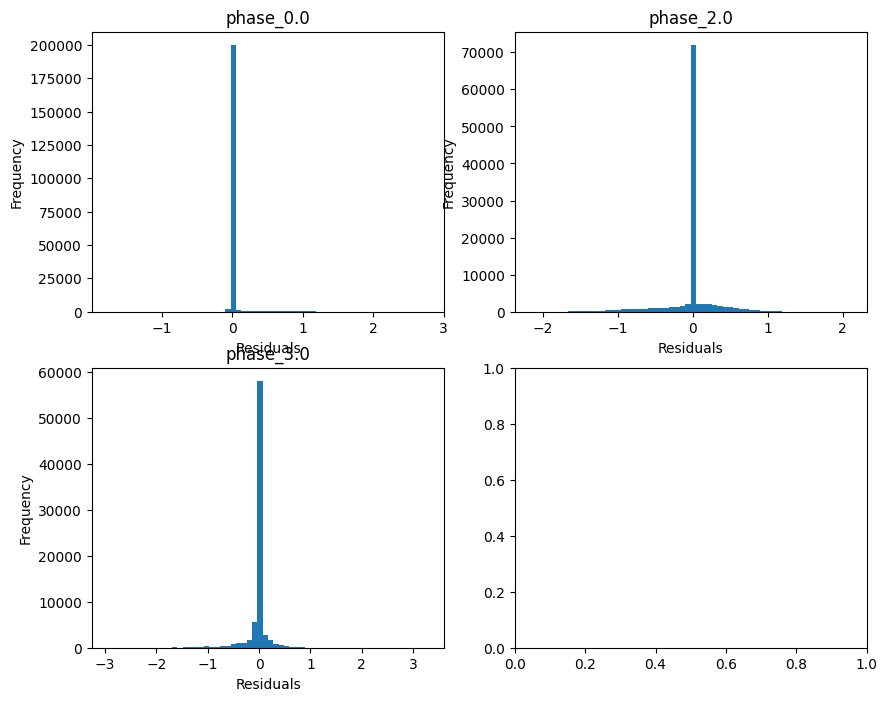

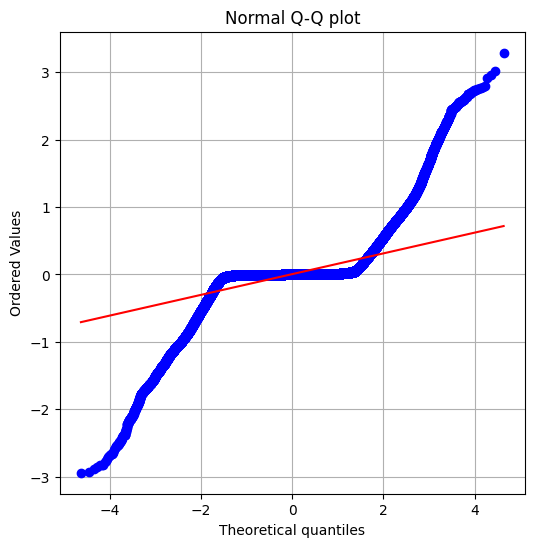

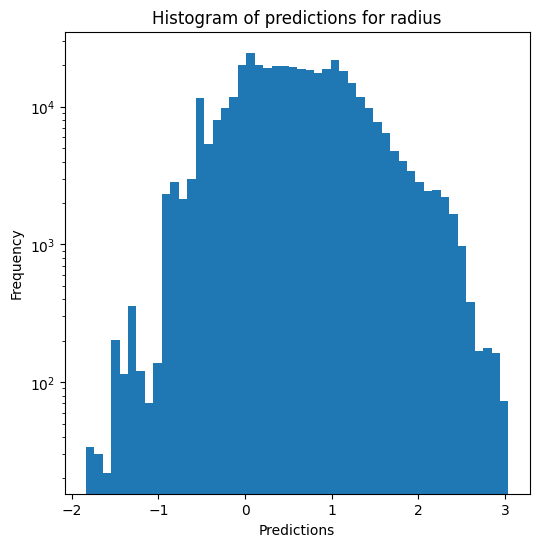

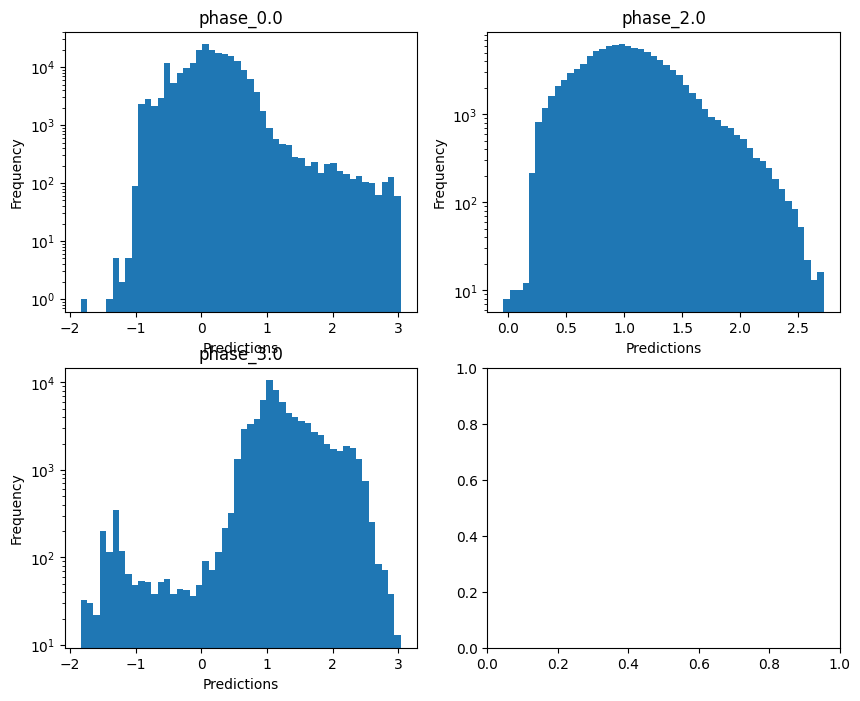

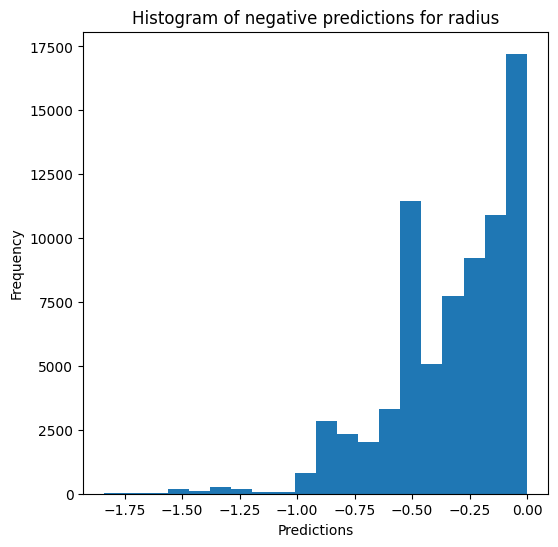

Saving predictions and results...


In [17]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### Random forests

In [18]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.980682285146838
  RMSE :  0.041589351287436856
  MAE :  0.006035121638701865
  MedAE :  0.0005262074205403255
  CORR :  0.9904091321473754
  MAX_ER :  1.5865879994842085
  Percentiles : 
    75th percentile :  0.0012887245407167125
    90th percentile :  0.0034949234660942353
    95th percentile :  0.008892119020187139
    99th percentile :  0.14038225637974425

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.9558904038774645
  RMSE :  0.05170573172768472
  MAE :  0.02221932746696372
  MedAE :  0.0026369344692378505
  CORR :  0.9777054546795083
  MAX_ER :  0.6971182495453743
  Percentiles : 
    75th percentile :  0.0177588028916138
    90th percentile :  0.07705548281

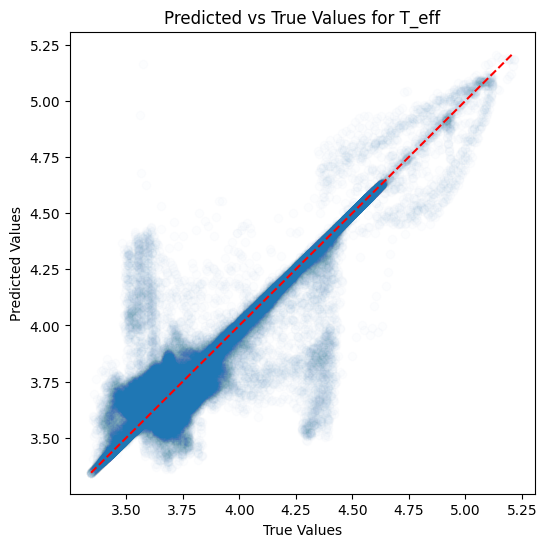

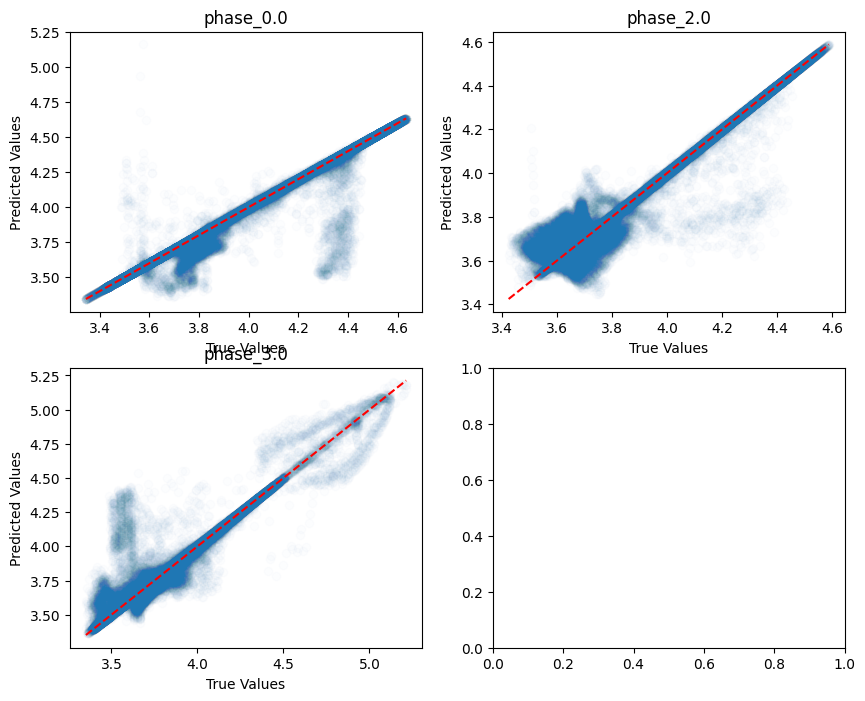

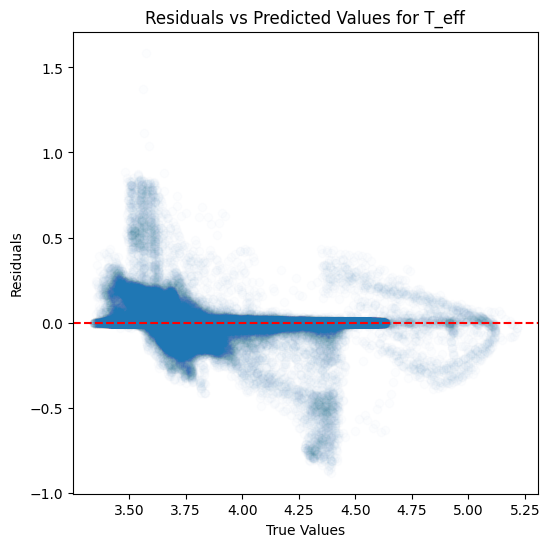

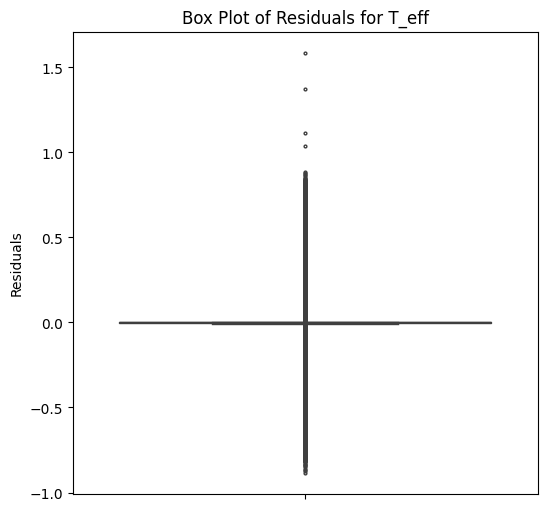

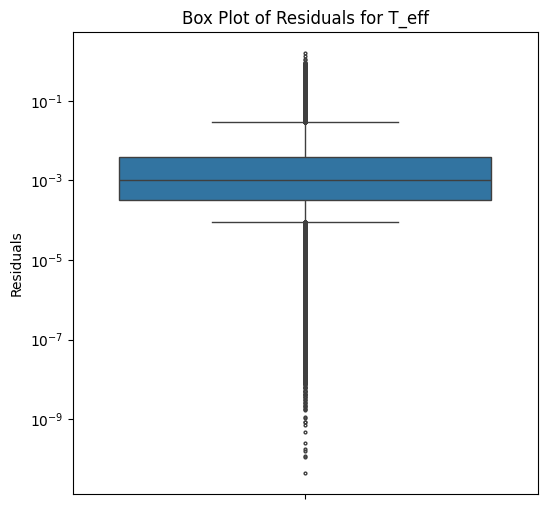

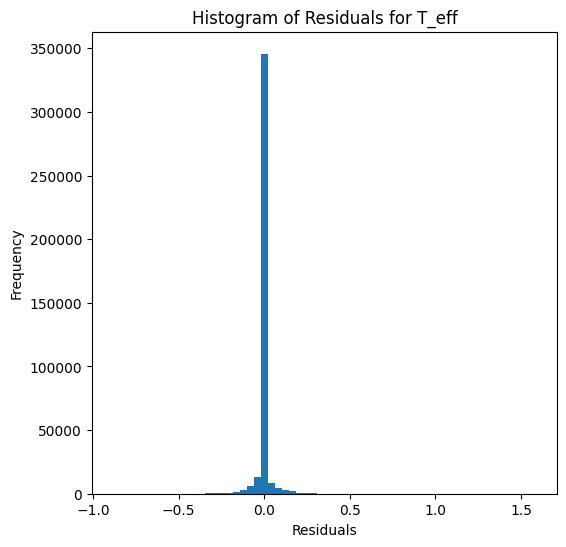

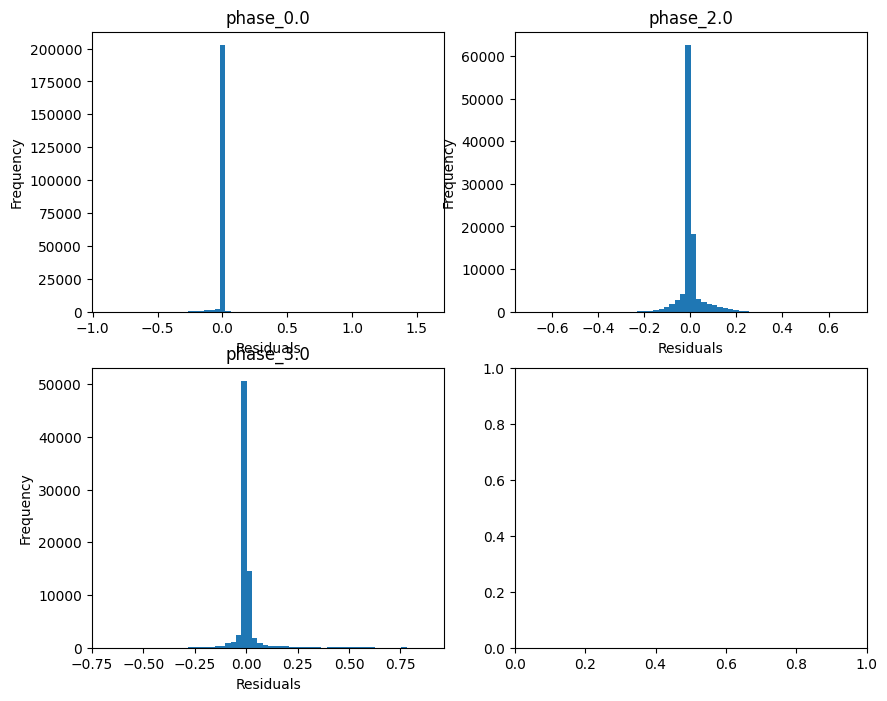

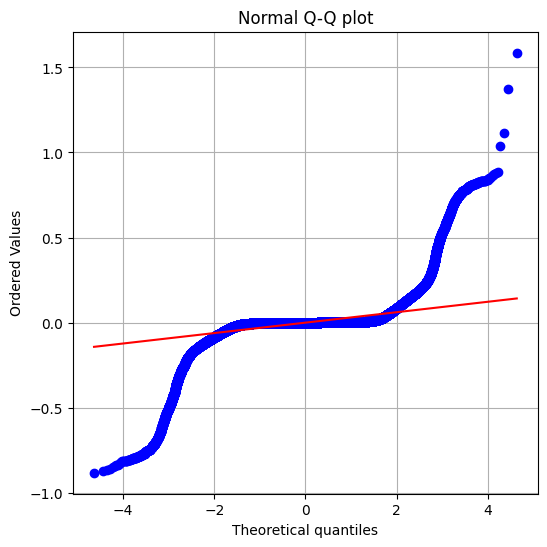

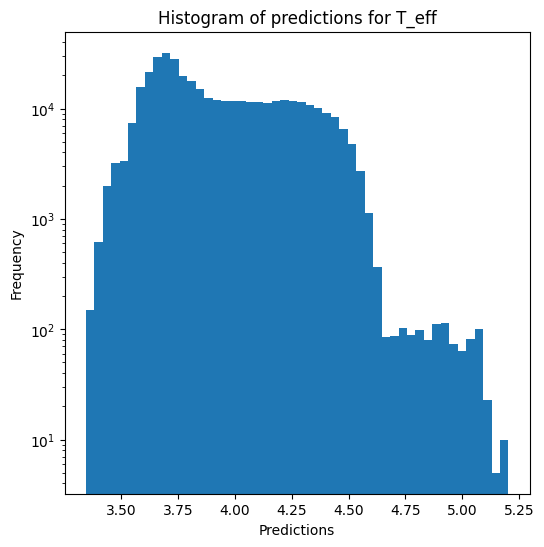

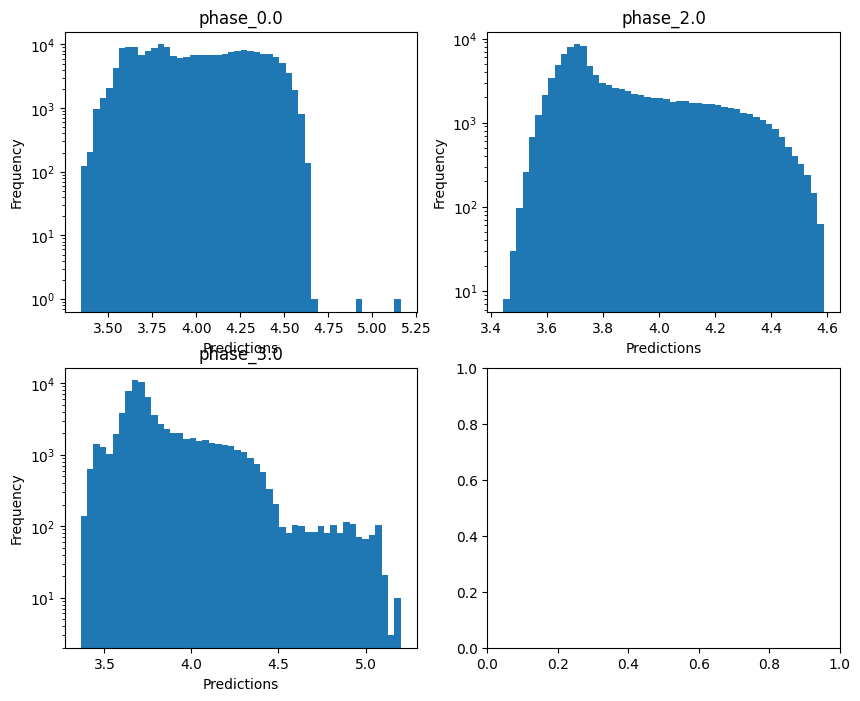


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.4050577756685282
  RMSE :  0.3556748829845738
  MAE :  0.05562708319491163
  MedAE :  0.0015201602641972123
  CORR :  0.8109069284585
  MAX_ER :  5.579738027939895
  Percentiles : 
    75th percentile :  0.0041608922463662705
    90th percentile :  0.012244051740252582
    95th percentile :  0.04815237515467522
    99th percentile :  2.1693719011175663

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.28505215399726713
  RMSE :  0.7854274092790041
  MAE :  0.3599257376450014
  MedAE :  0.013356700711447012
  CORR :  0.6020094917347235
  MAX_ER :  4.4613292203109856
  Percentiles : 
    75th percentile :  0.3339927490467356
    90th percentile :  1.4319346385230578
    95th percentile :  2.0183652917518944
    99th percentile :  2.9845917234171315

log_g results for the phase category wit

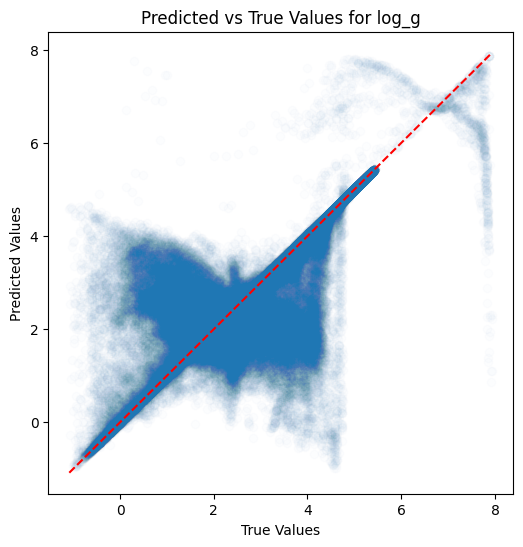

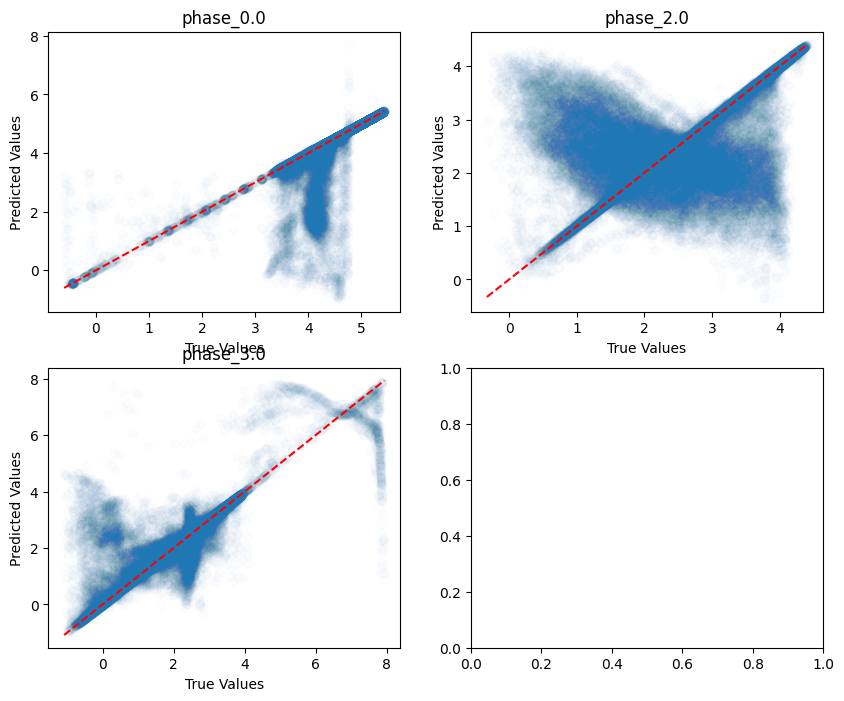

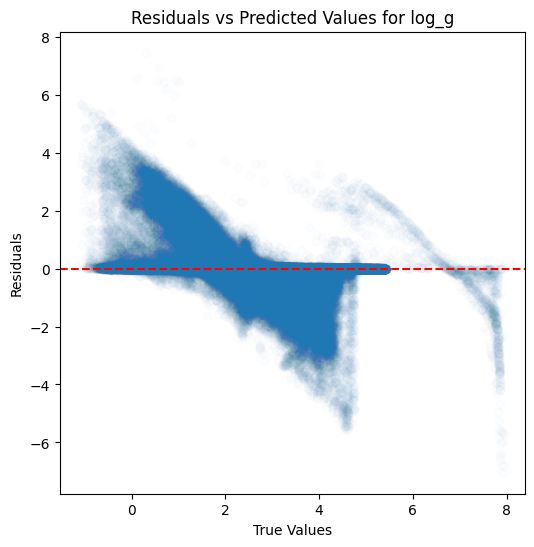

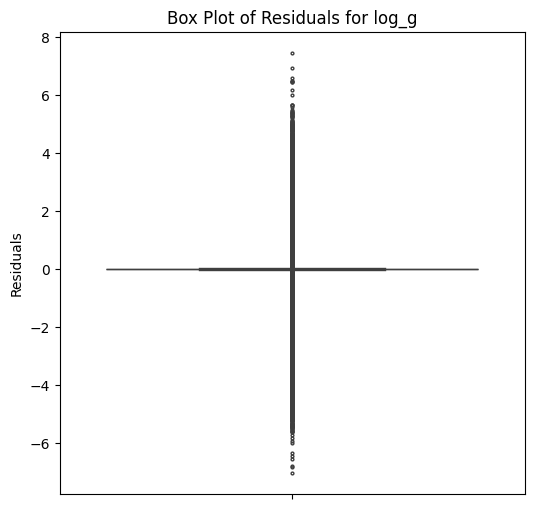

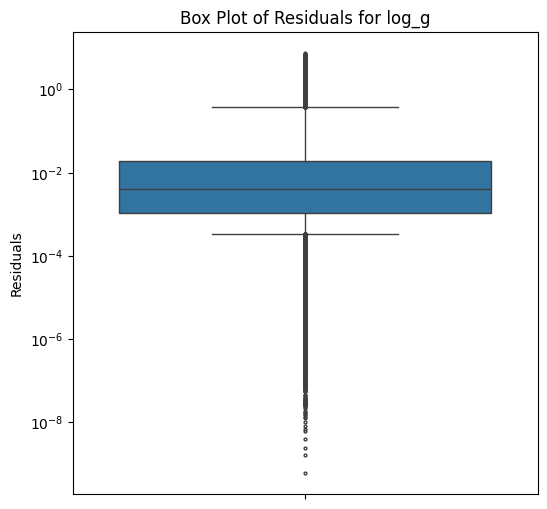

...

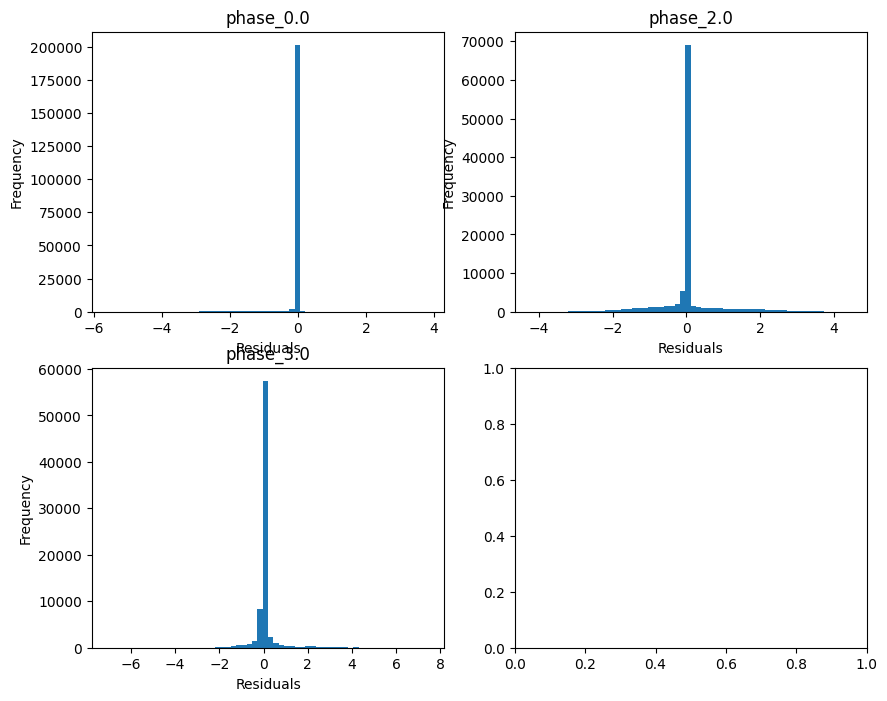

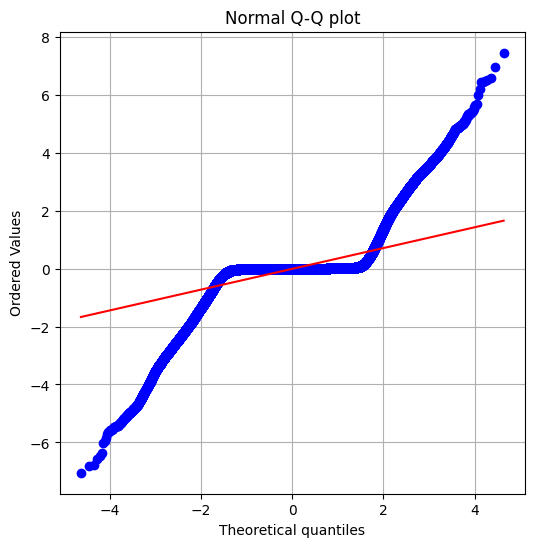

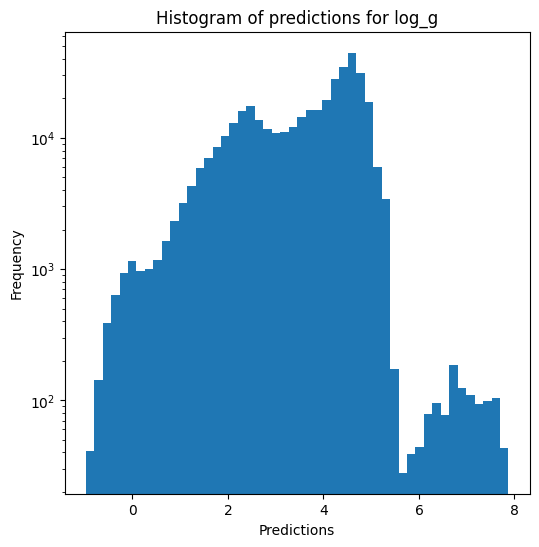

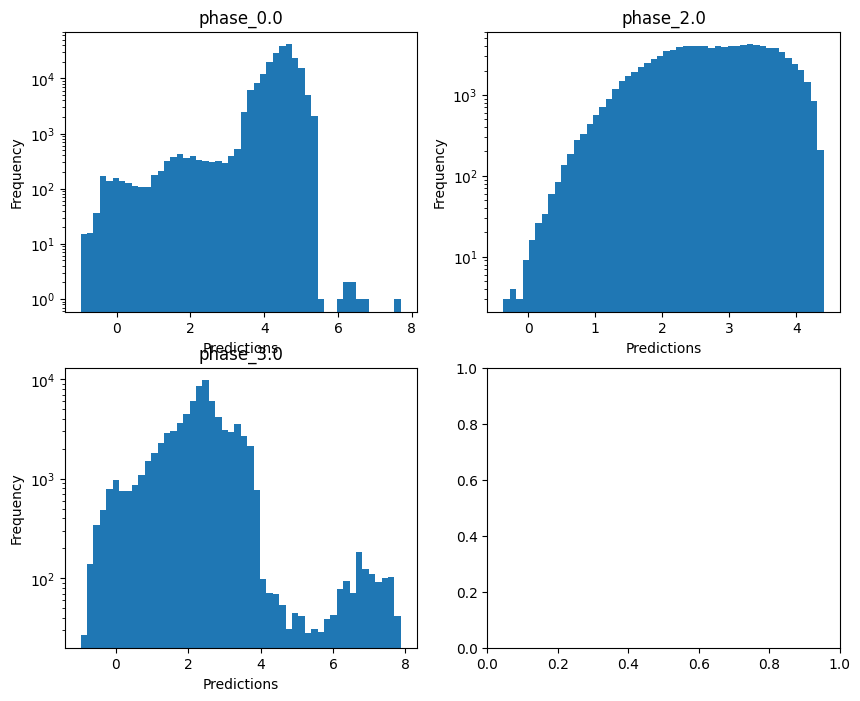

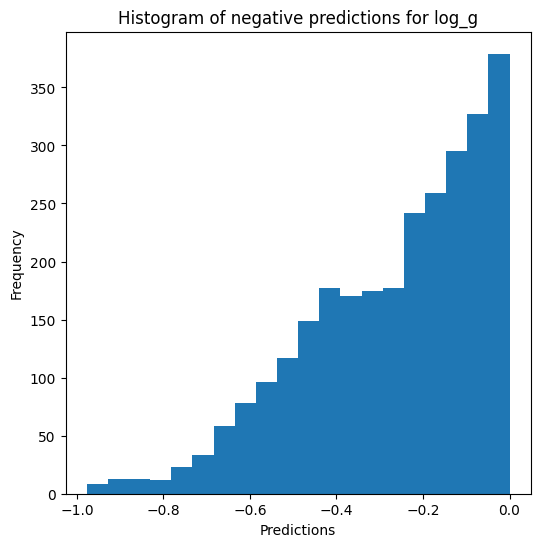


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.8255731573344177
  RMSE :  0.1778559645883879
  MAE :  0.02803912901469565
  MedAE :  0.0009716212725749684
  CORR :  0.9243277103129188
  MAX_ER :  2.7916660025023283
  Percentiles : 
    75th percentile :  0.002470004853010719
    90th percentile :  0.00668675665806903
    95th percentile :  0.024371550122068666
    99th percentile :  1.0851688800339137

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.28824551269832055
  RMSE :  0.39270483152344077
  MAE :  0.17996318239848771
  MedAE :  0.006686984248757244
  CORR :  0.6143388163432143
  MAX_ER :  2.230802917695899
  Percentiles : 
    75th percentile :  0.16685756778954142
    90th percentile :  0.7159116064062375
    95th percentile :  1.009188845544068
    99th percentile :  1.492330966783243

radius results for the phase catego

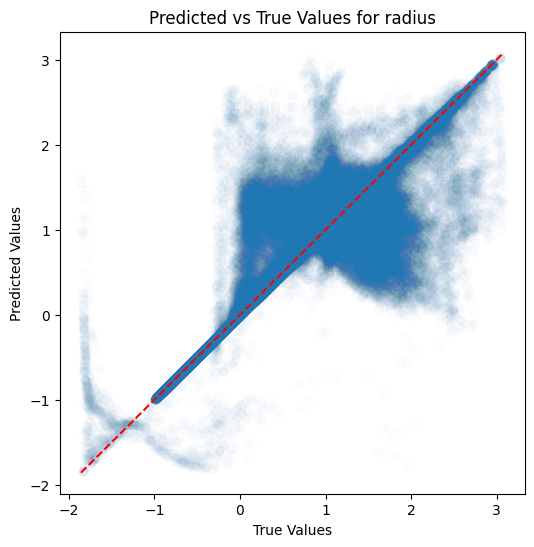

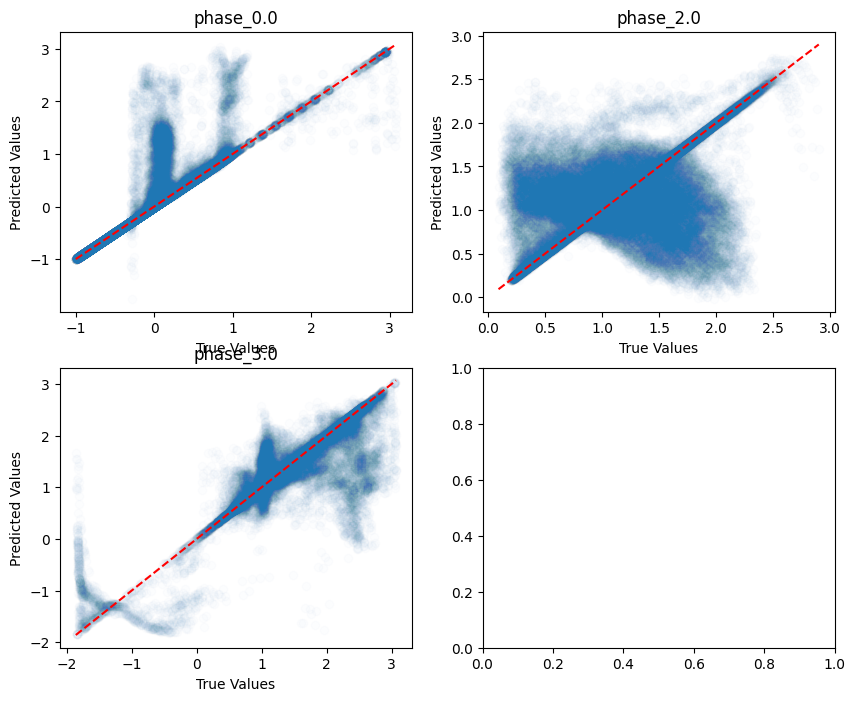

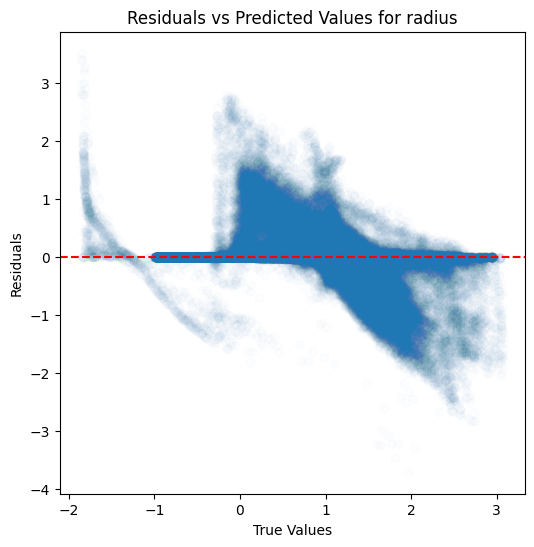

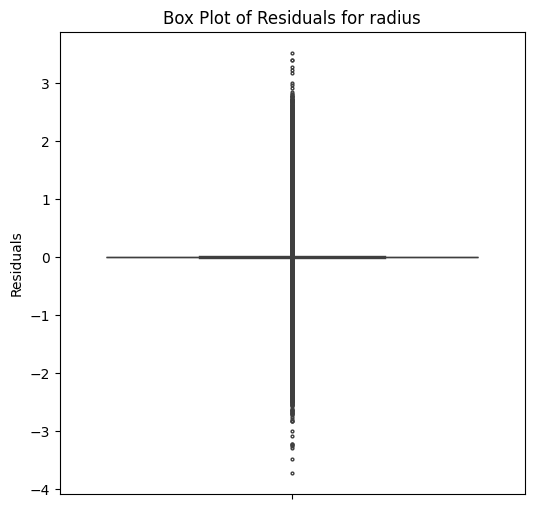

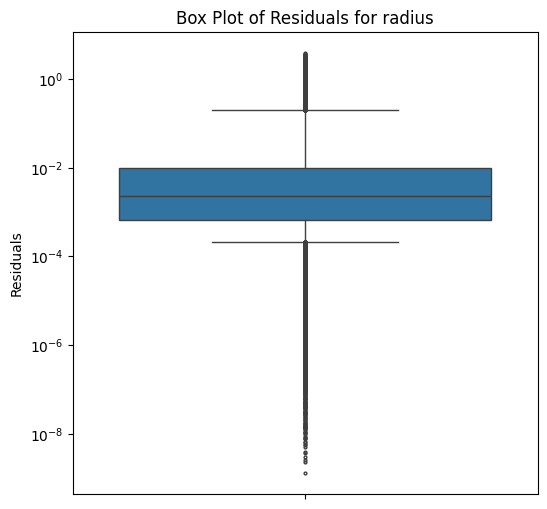

...

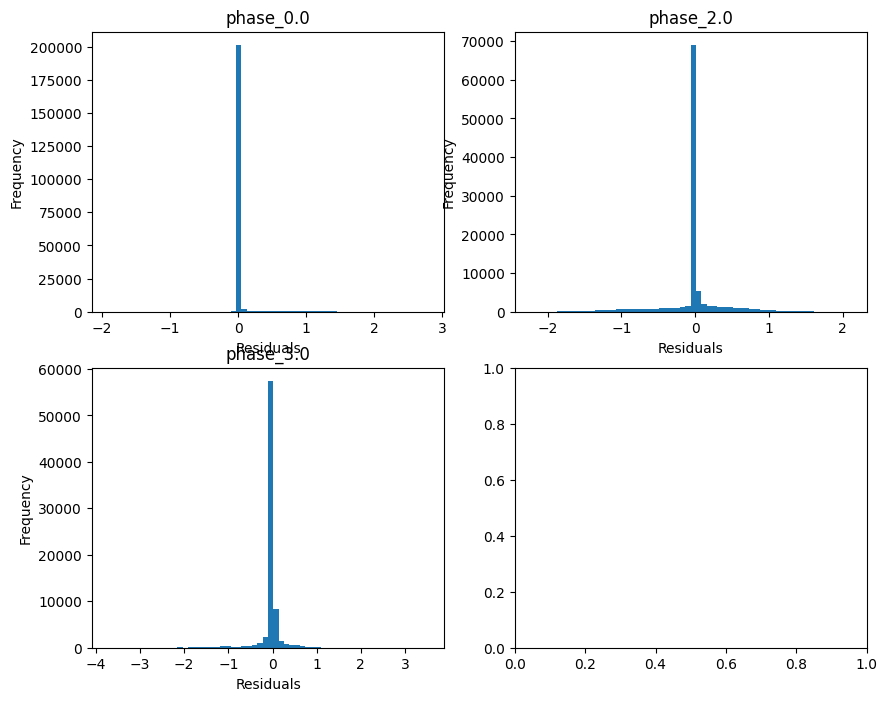

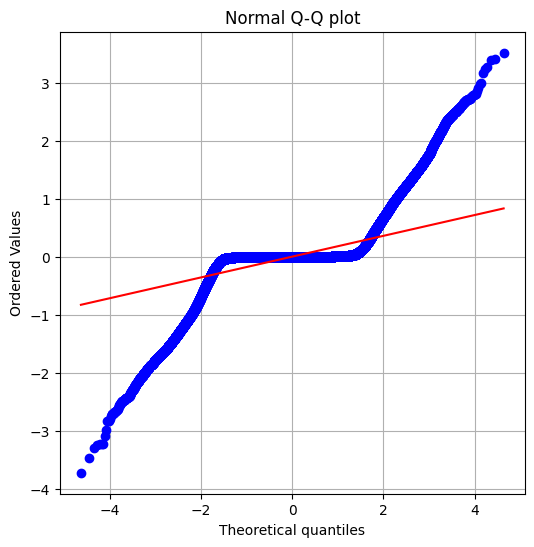

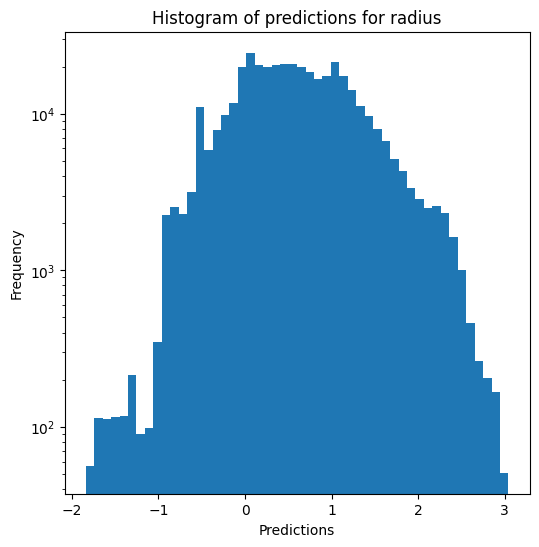

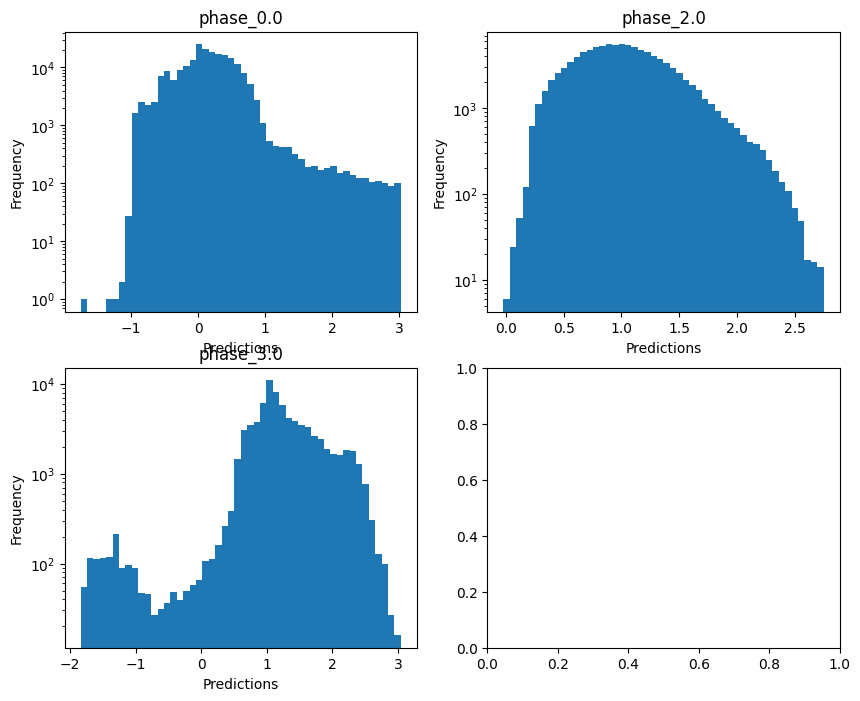

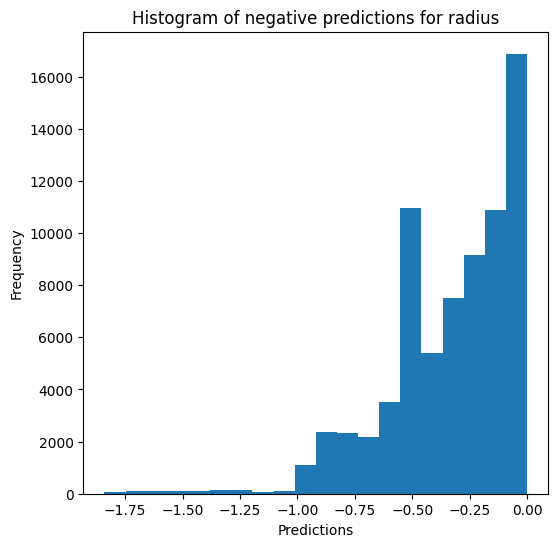

Saving predictions and results...


In [19]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### XGBoost

In [20]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.9305372361341564
  RMSE :  0.08551712359406634
  MAE :  0.045121409475297296
  MedAE :  0.01339392274223239
  CORR :  0.9647268982183418
  MAX_ER :  1.1073126053574387
  Percentiles : 
    75th percentile :  0.0509791035975905
    90th percentile :  0.13816650107192638
    95th percentile :  0.1995649686769235
    99th percentile :  0.3413161237194029

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.7814335973015469
  RMSE :  0.11793851180864
  MAE :  0.08948924354157127
  MedAE :  0.07014601541046028
  CORR :  0.8840688564103876
  MAX_ER :  0.5136370174732301
  Percentiles : 
    75th percentile :  0.12296586872233739
    90th percentile :  0.19499045402335188
    95t

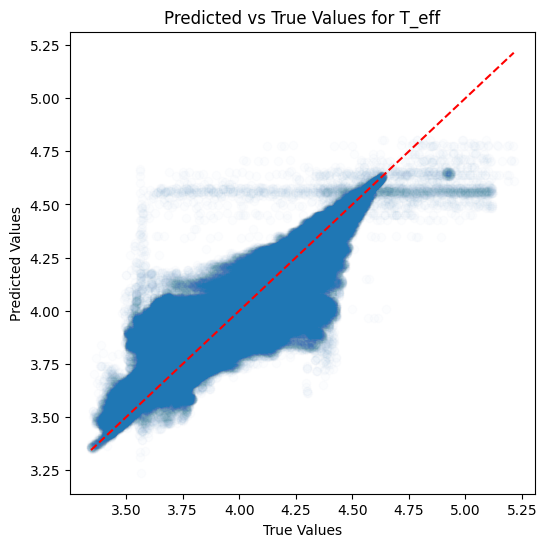

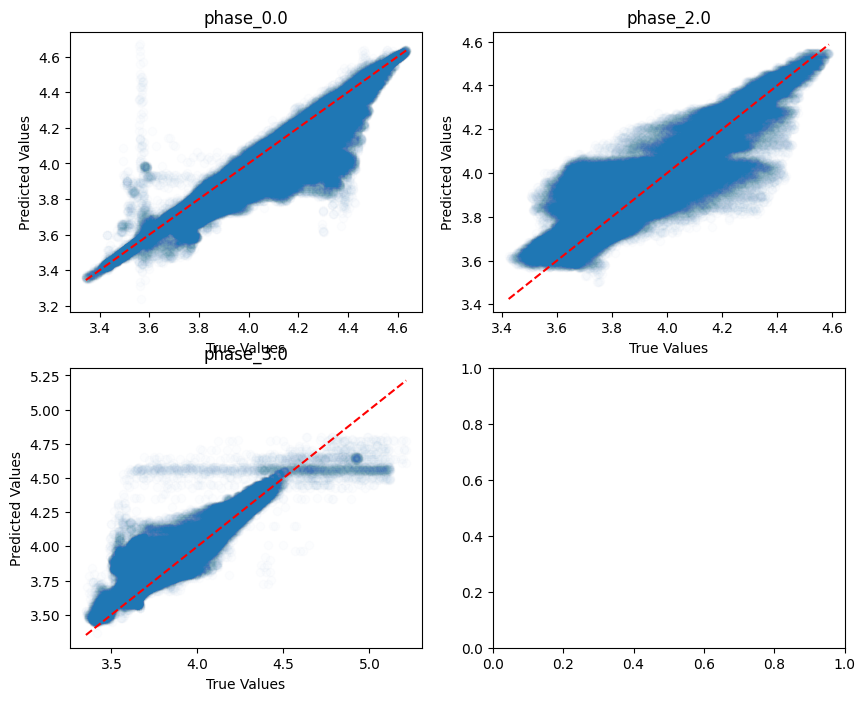

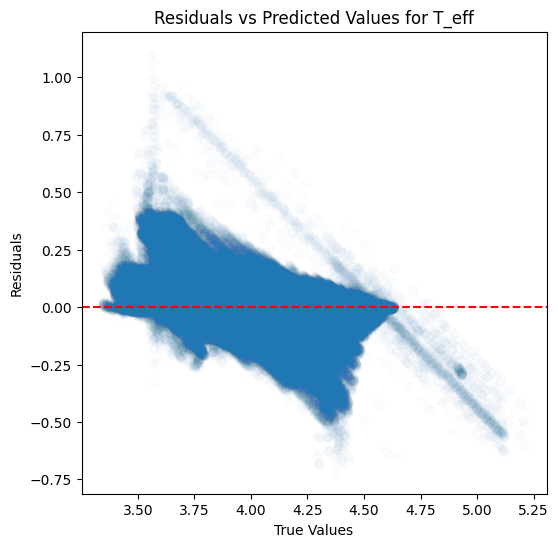

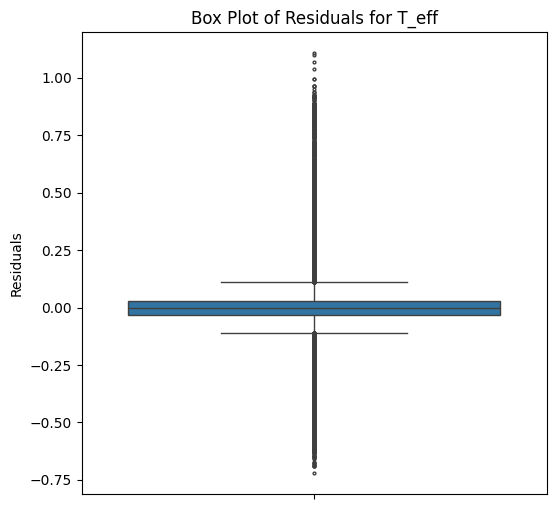

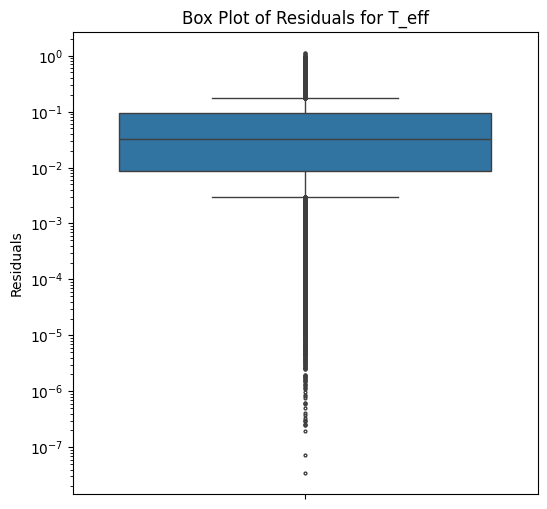

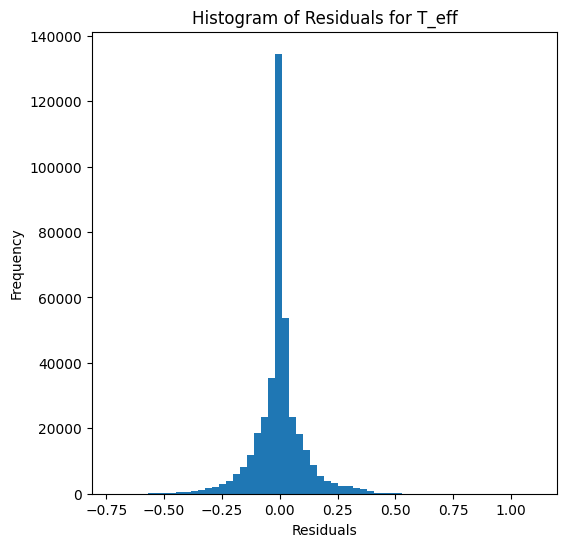

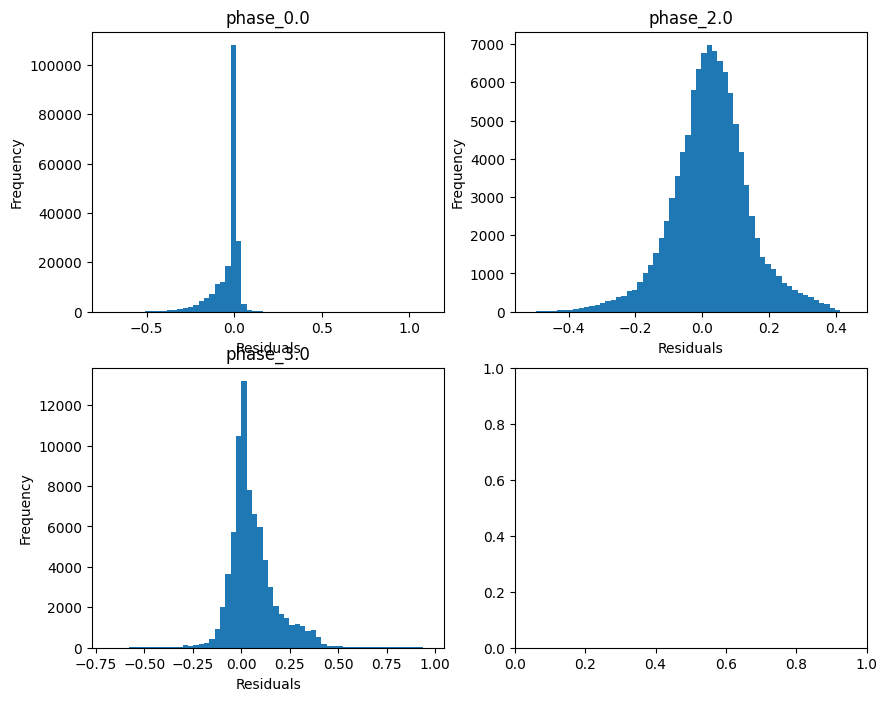

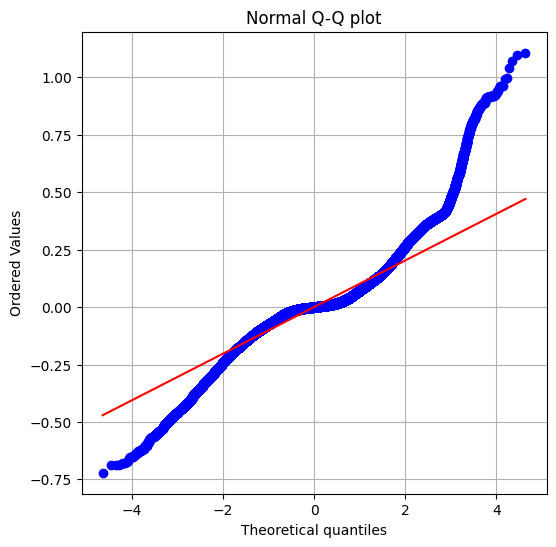

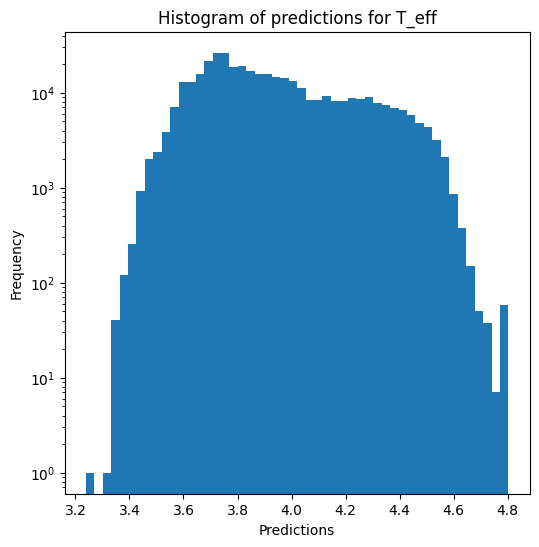

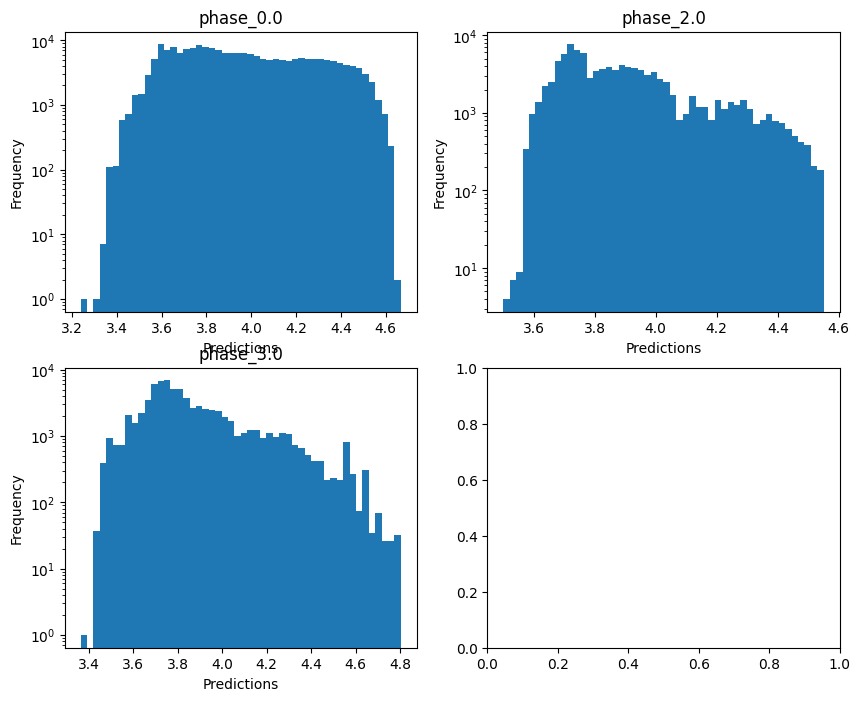


log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  0.030209388120251757
  RMSE :  0.49403905571643486
  MAE :  0.2613608879562451
  MedAE :  0.06460824119703235
  CORR :  0.8412182433810762
  MAX_ER :  5.2367978737213186
  Percentiles : 
    75th percentile :  0.31274691542268185
    90th percentile :  0.8486270141670041
    95th percentile :  1.165257918988363
    99th percentile :  1.7195872010604472

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.36281604489549957
  RMSE :  0.7501718564913221
  MAE :  0.5816125958132723
  MedAE :  0.4654687760669054
  CORR :  0.6023456389169051
  MAX_ER :  3.851671022858464
  Percentiles : 
    75th percentile :  0.8346520646211046
    90th percentile :  1.2403710243326391
    95th percentile :  1.5111500960081257
    99th percentile :  2.098012059894759

log_g results for the phase category with a va

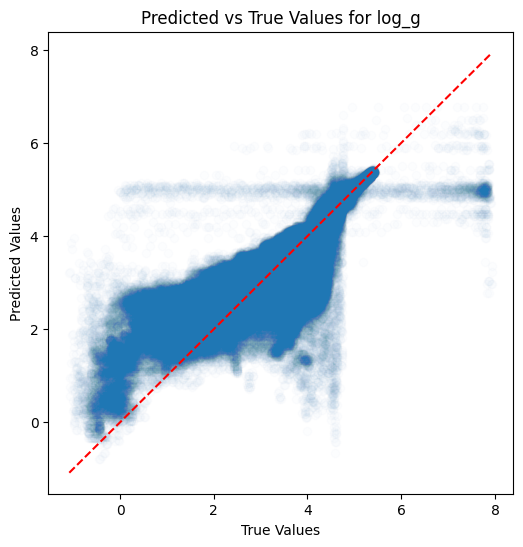

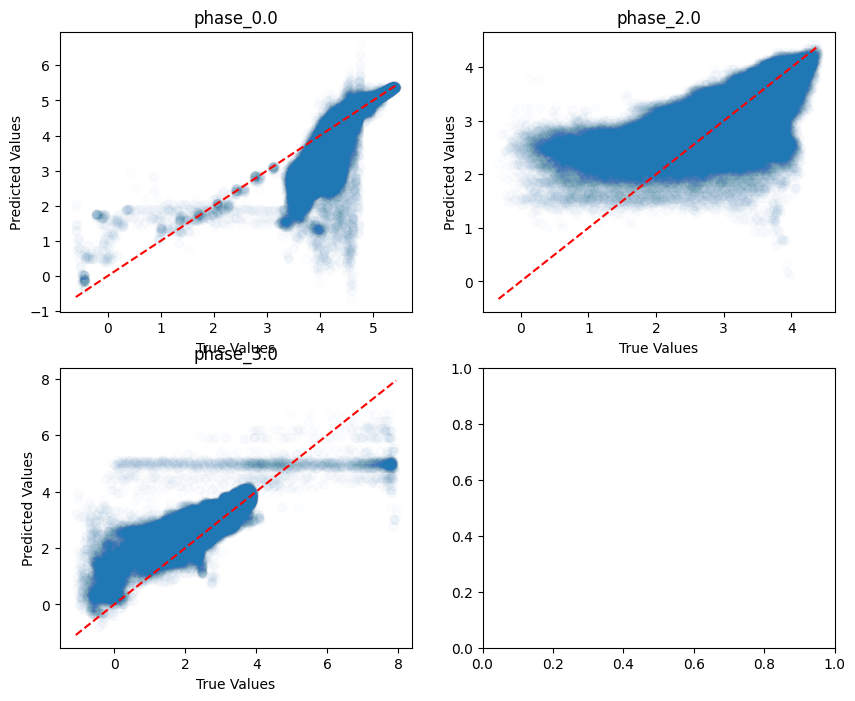

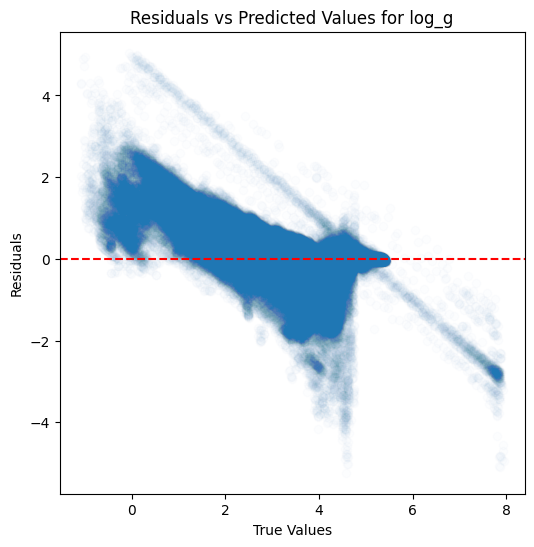

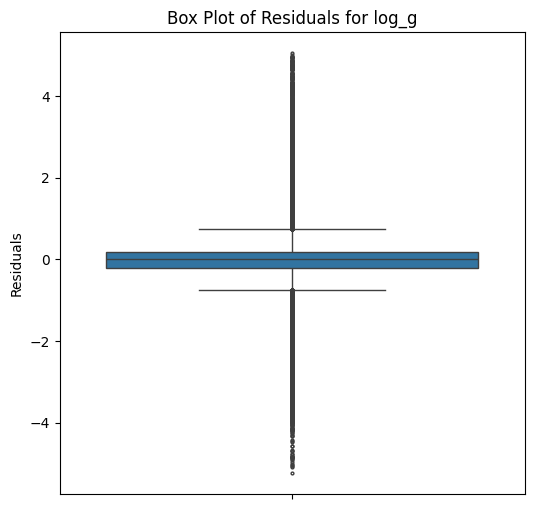

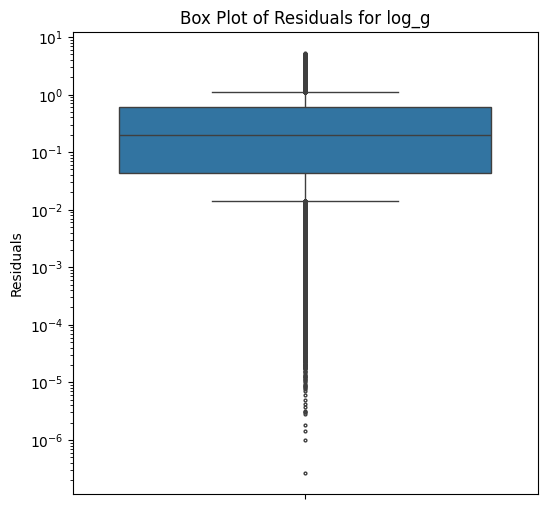

...

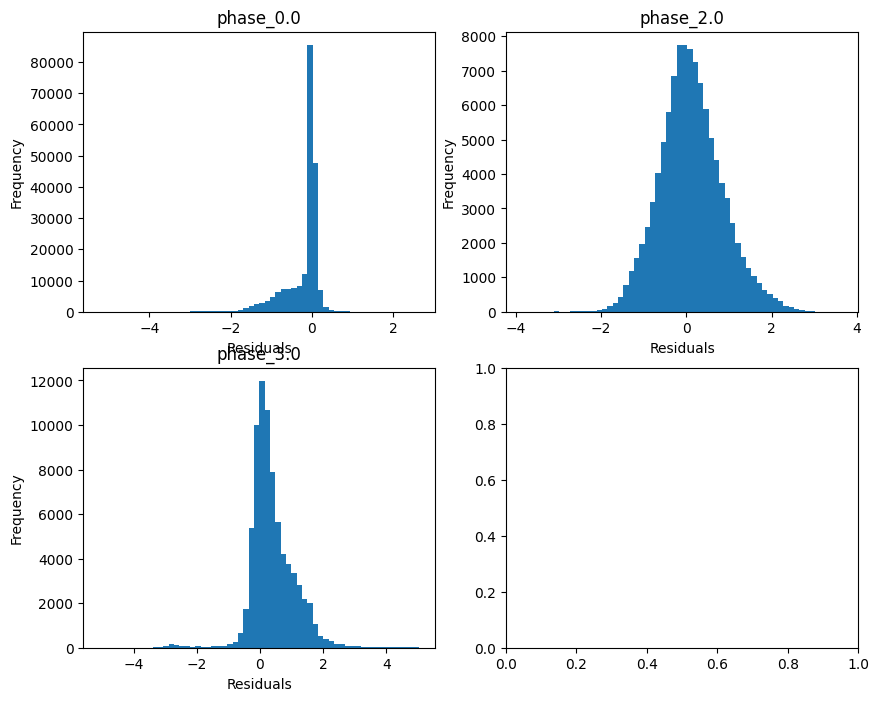

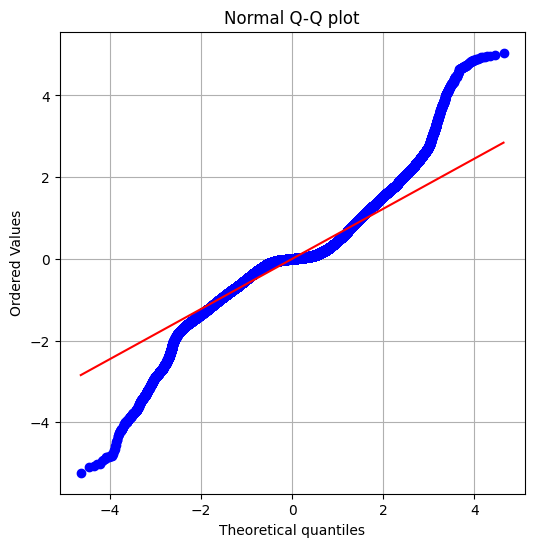

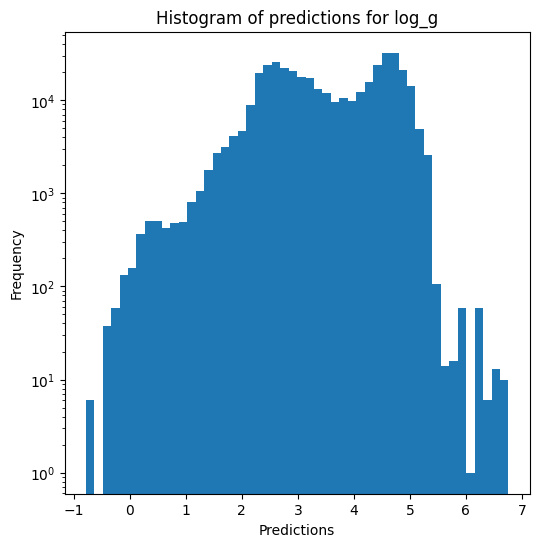

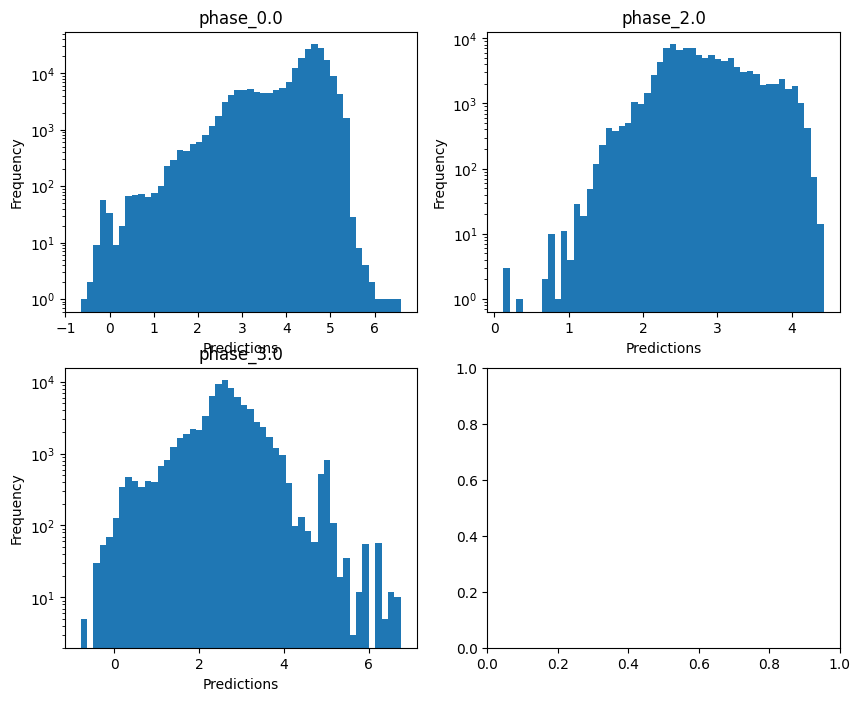

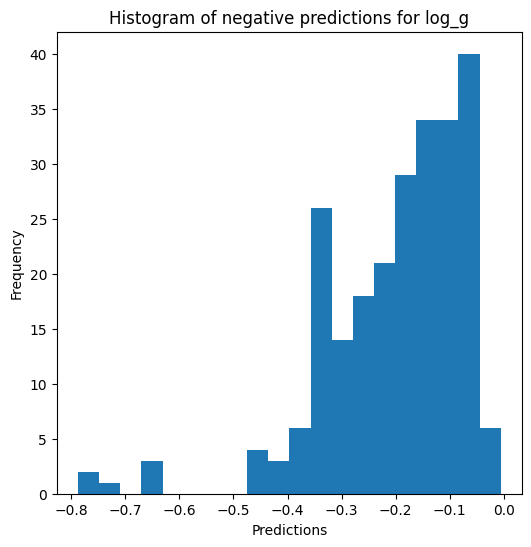


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.7123479059473612
  RMSE :  0.24866635770095347
  MAE :  0.13315777384866465
  MedAE :  0.03433471278175906
  CORR :  0.9159687793469312
  MAX_ER :  2.5929925268333056
  Percentiles : 
    75th percentile :  0.16172028519837411
    90th percentile :  0.42432773868993023
    95th percentile :  0.5868227478360709
    99th percentile :  0.8606352068625639

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.36627669025819976
  RMSE :  0.37480841942566573
  MAE :  0.29056114718388343
  MedAE :  0.23221018237826319
  CORR :  0.6060681178296037
  MAX_ER :  1.8436075538525427
  Percentiles : 
    75th percentile :  0.41761020717068287
    90th percentile :  0.6197332905137931
    95th percentile :  0.7540237355206275
    99th percentile :  1.0476419586107606

radius results for the phase category

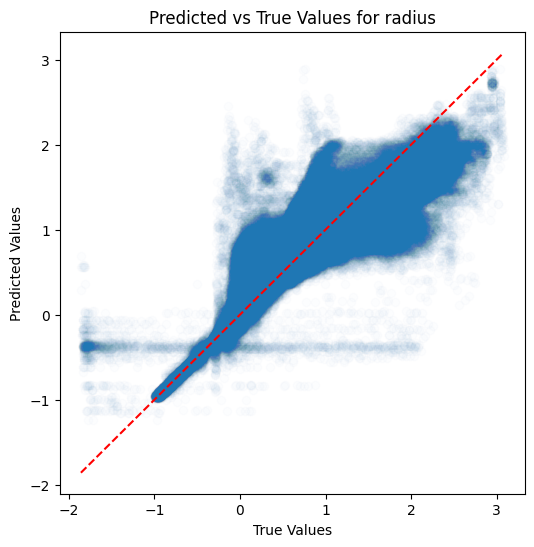

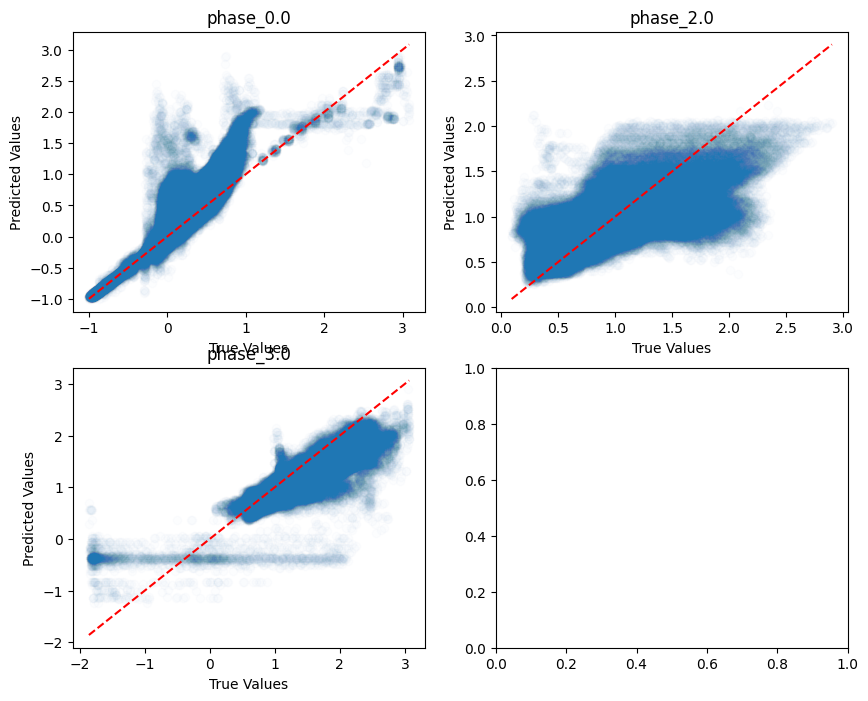

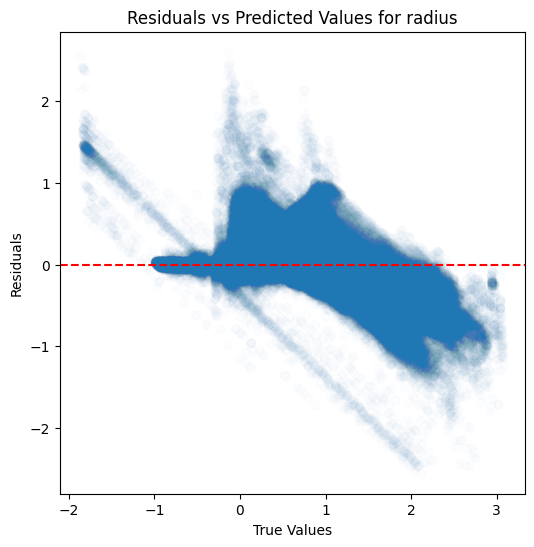

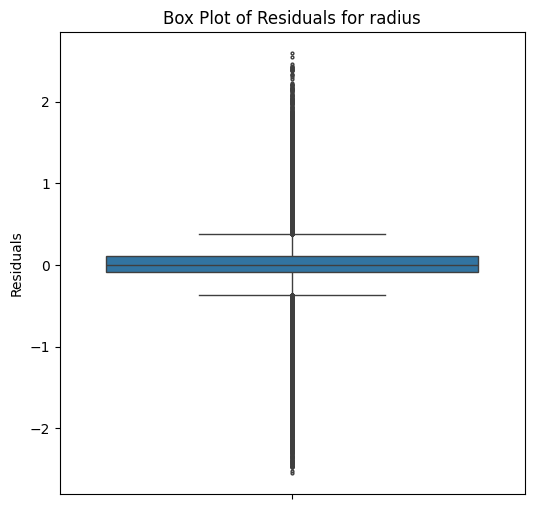

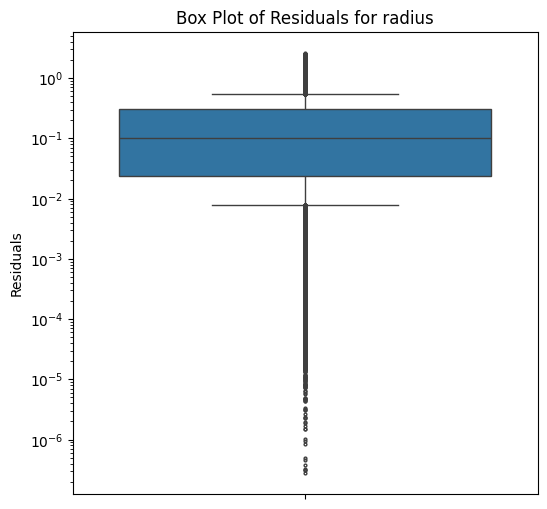

...

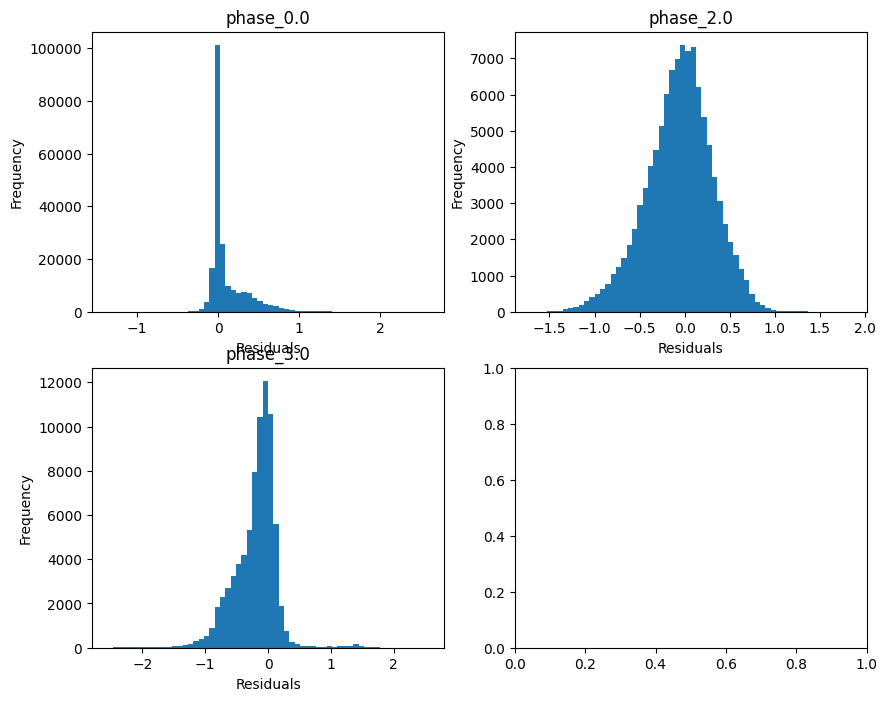

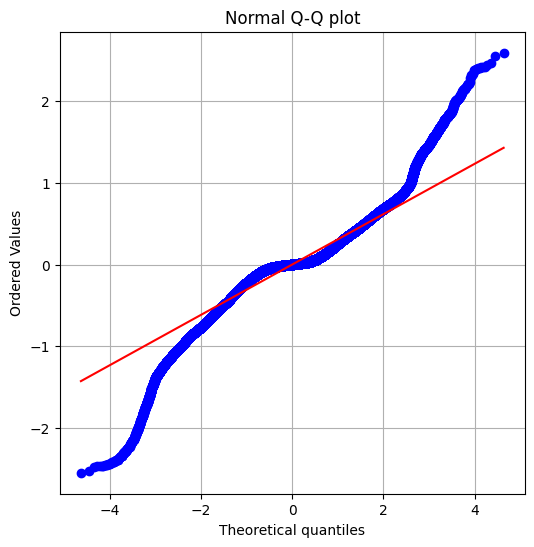

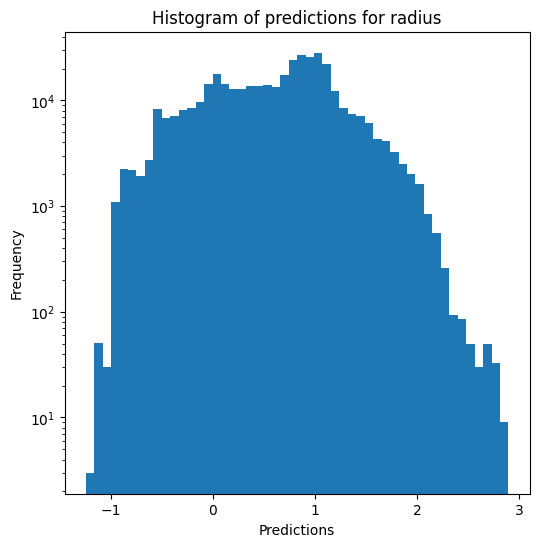

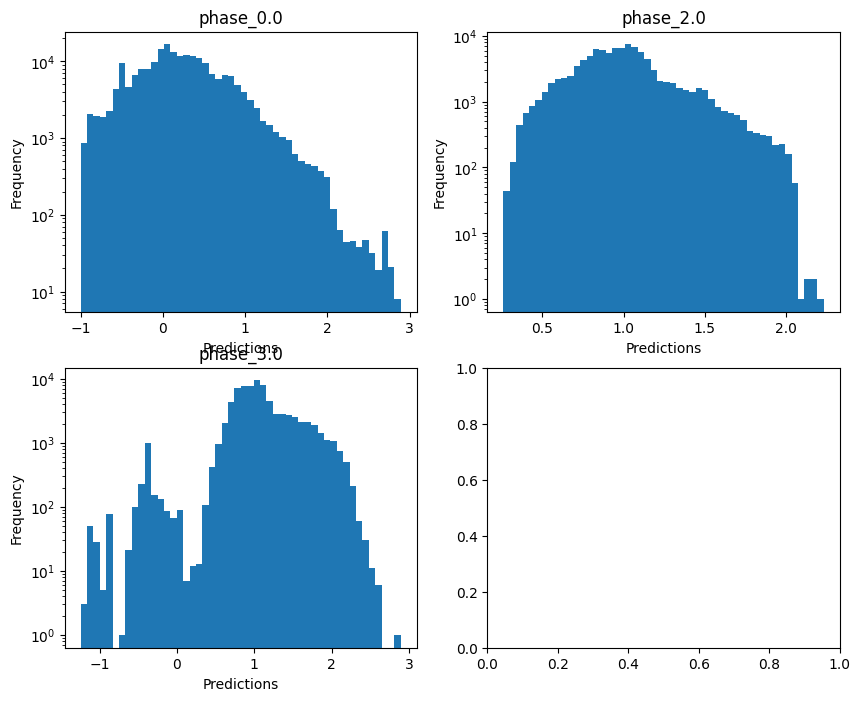

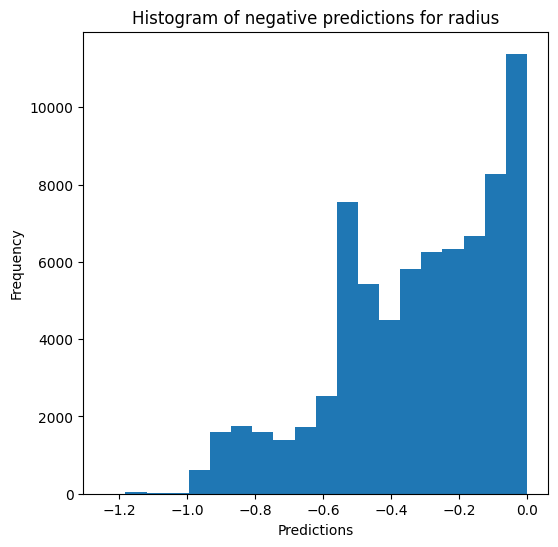

Saving predictions and results...


In [21]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### Multi-layer perceptron

In [22]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_14 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12465144512173008
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12548509567107957
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.1261674029992794
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.12488205347734999
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.1221003366248116

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.634489491902143
  RVE :  0.8150265742487123
  RMSE :  0.1391123117307764
  MAE :  0.0967522632012154
  MedAE :  0.061710733966586995
  CORR :  0.9072618492200268
  MAX_ER :  1.078713133158379
  Percentiles : 
    75th percentile :  0.12710027304619242
    90th percentile :  0.2497720168352206
    95th percentile :  0.3128693435262859
    99th percentile :  0.4293850660252692

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.587503920775571
  RVE :  0.6552475204236923
  RMSE :  0.1447914214431351
  MAE :  0.11322195250554555
  MedAE :  0.09132804629955071
  CORR :  0.8148600795598422
  MAX_ER :  0.6295713609376912
  Percentiles : 
    75th percentile :  0.16502757394390422
    90th percentile :  0.2408063417392828
    95th percentile :  0.2870849713172384
    99th percentile :  0.3

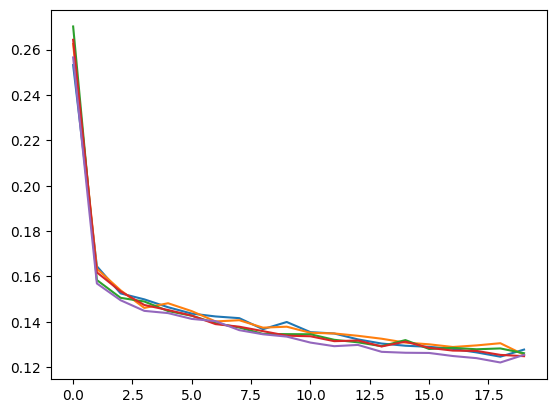

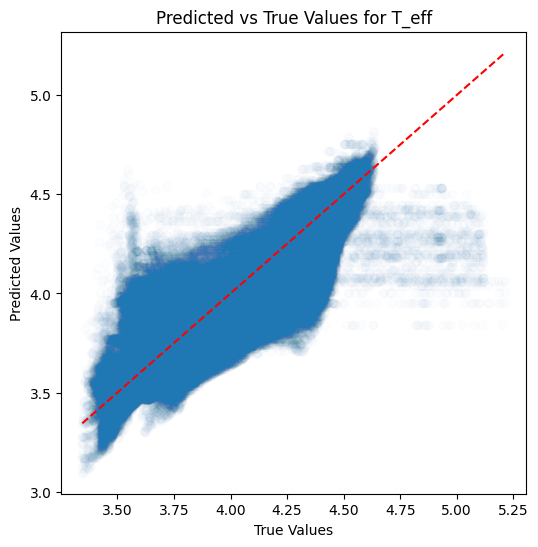

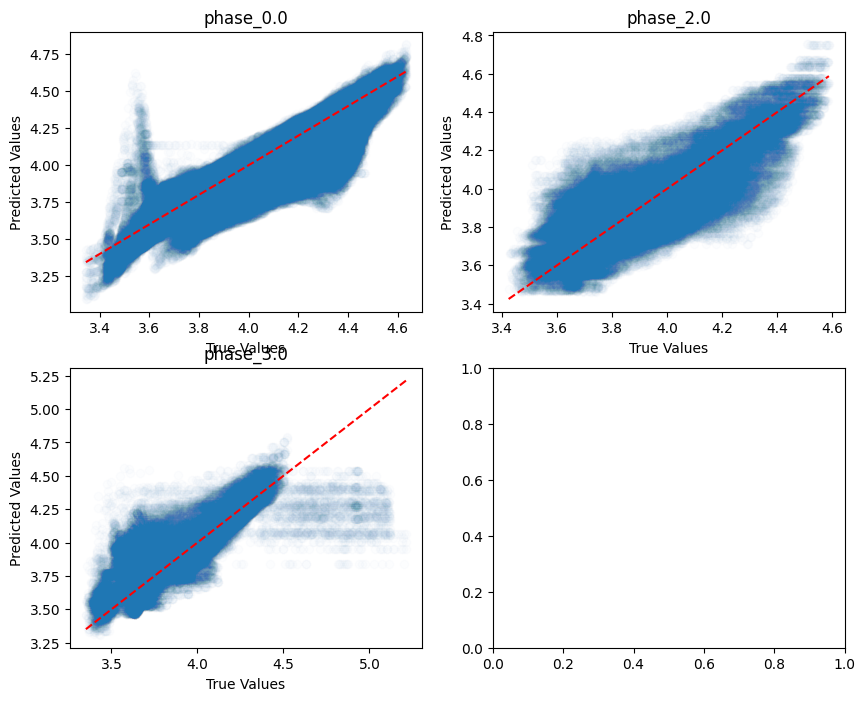

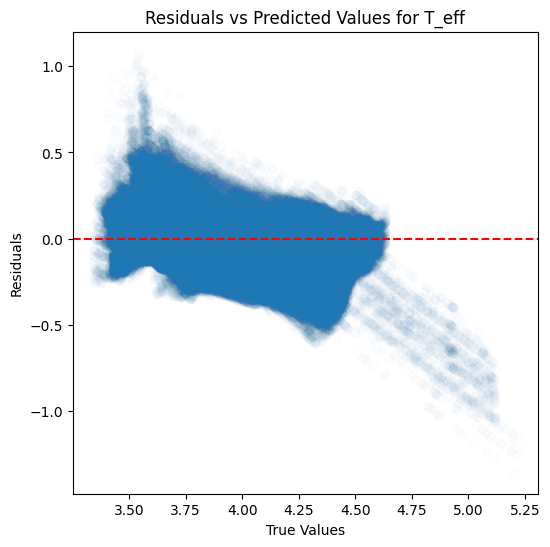

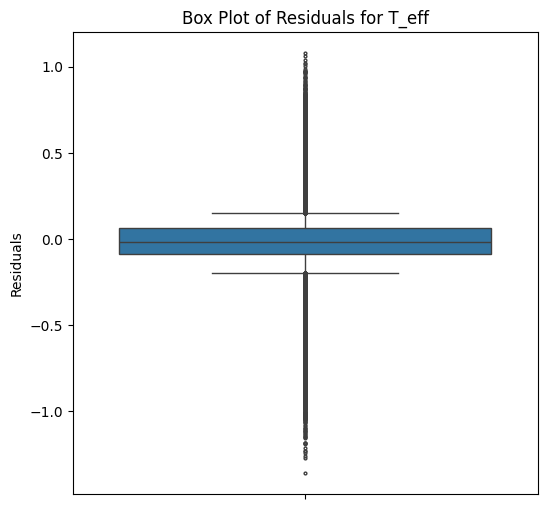

...

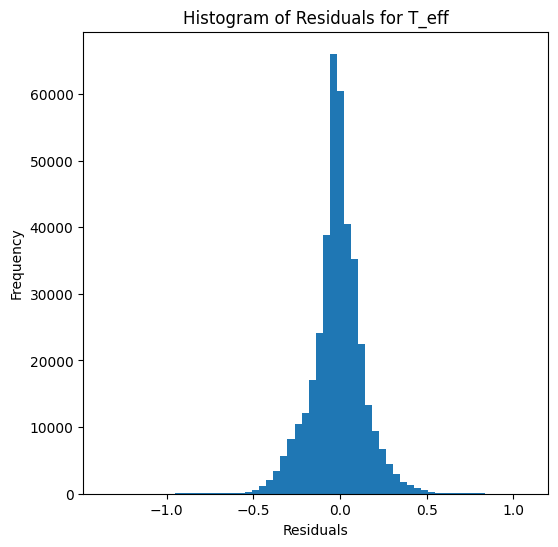

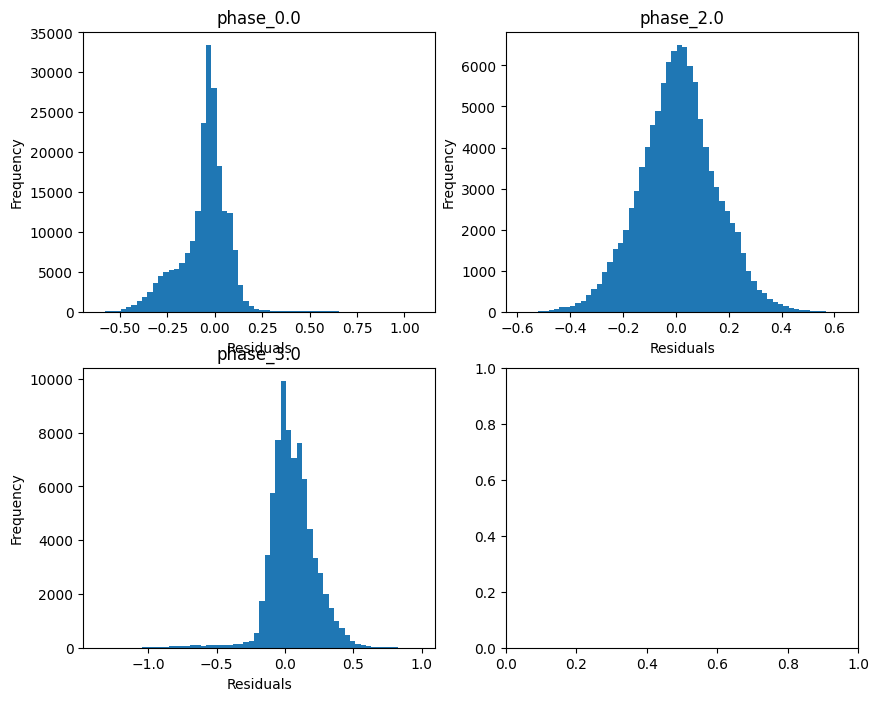

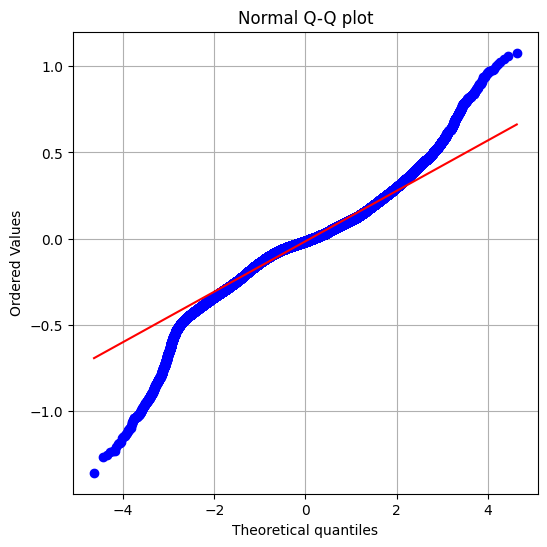

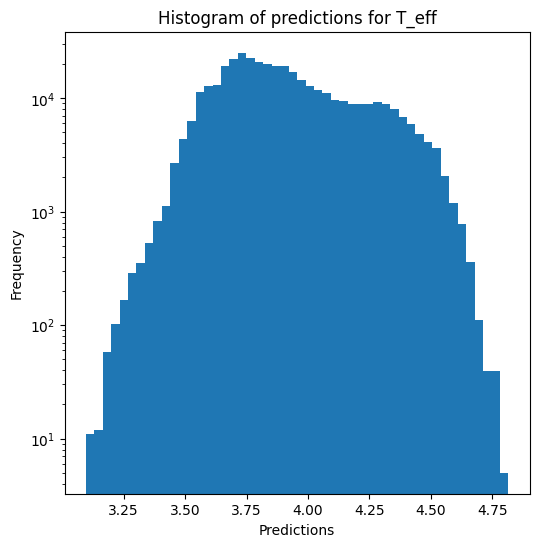

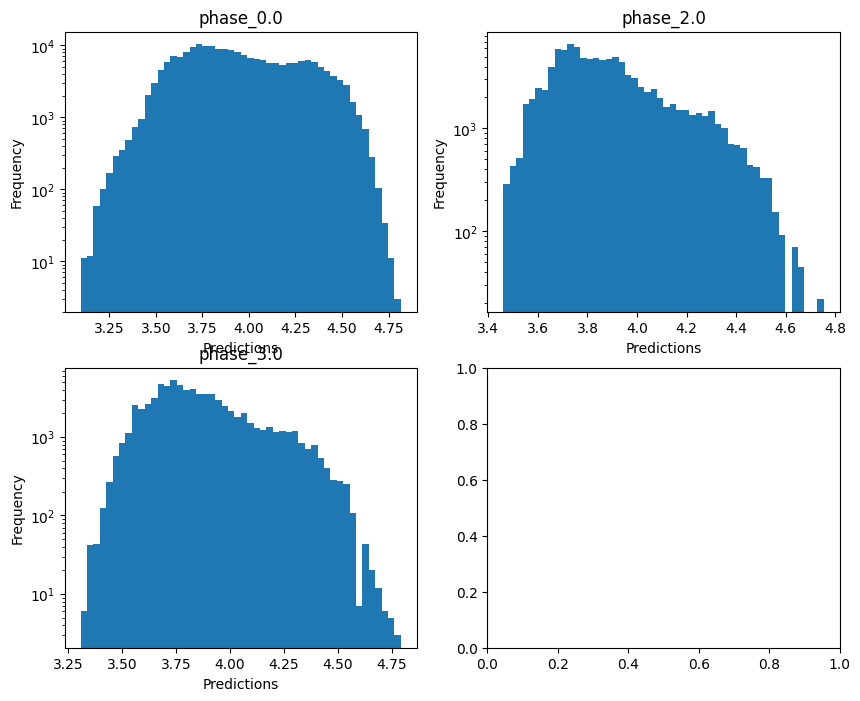

no negative values

log_g results for the phase category with a value of 0.0
  value range :  -0.5973100835175252 - 5.433094523832443
  RVE :  -0.7608869844922279
  RMSE :  0.7136579494926818
  MAE :  0.408130553597824
  MedAE :  0.07956035742280143
  CORR :  0.787485582566741
  MAX_ER :  3.2390309470874454
  Percentiles : 
    75th percentile :  0.6724788239727242
    90th percentile :  1.3882076248845383
    95th percentile :  1.6815004185398696
    99th percentile :  2.173731868606534

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.17936702415315853
  RMSE :  0.8409216078442495
  MAE :  0.6658340453995462
  MedAE :  0.550403465159718
  CORR :  0.46003668666737163
  MAX_ER :  3.559181720986732
  Percentiles : 
    75th percentile :  0.9703690300184444
    90th percentile :  1.393003415454176
    95th percentile :  1.6611099004016965
    99th percentile :  2.2082423454895994

log_g results for the phase cate

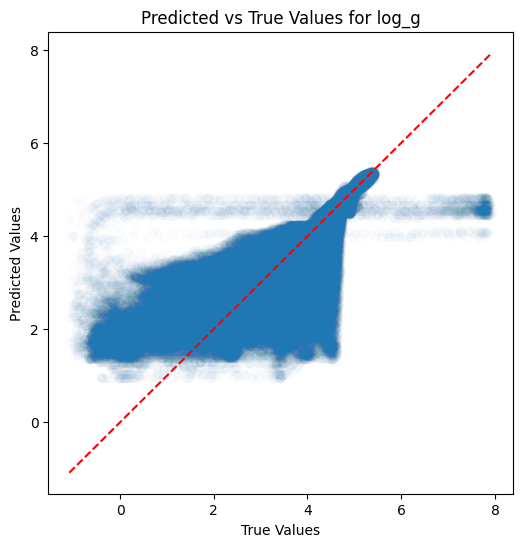

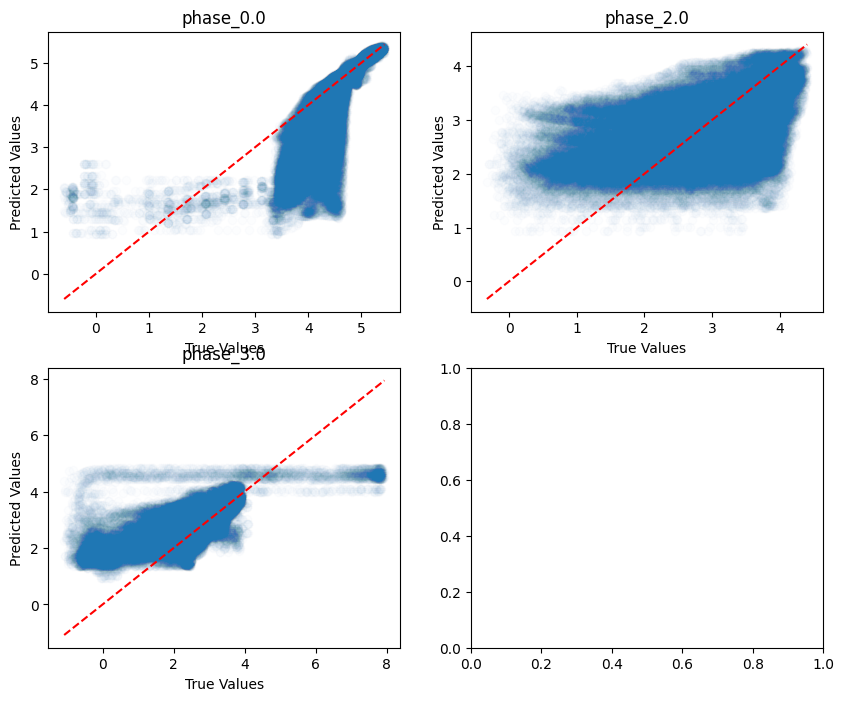

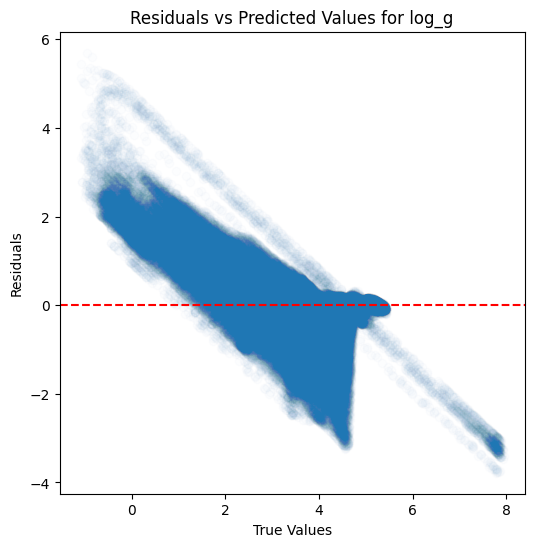

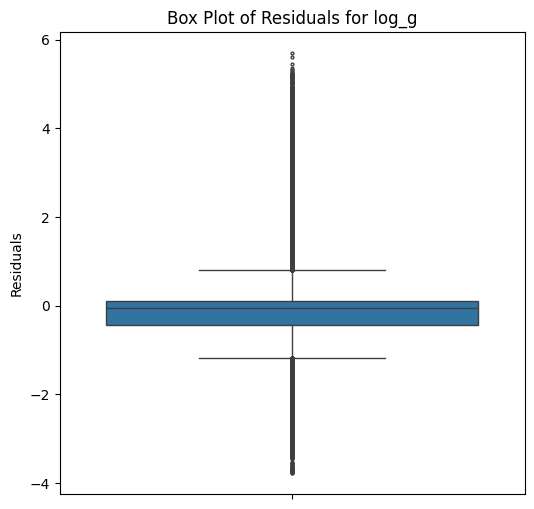

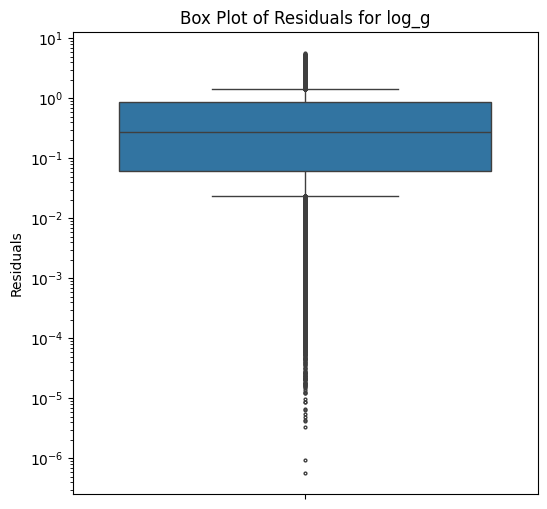

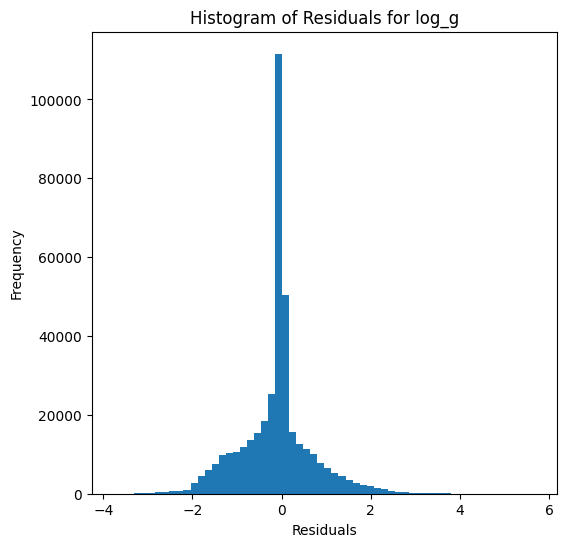

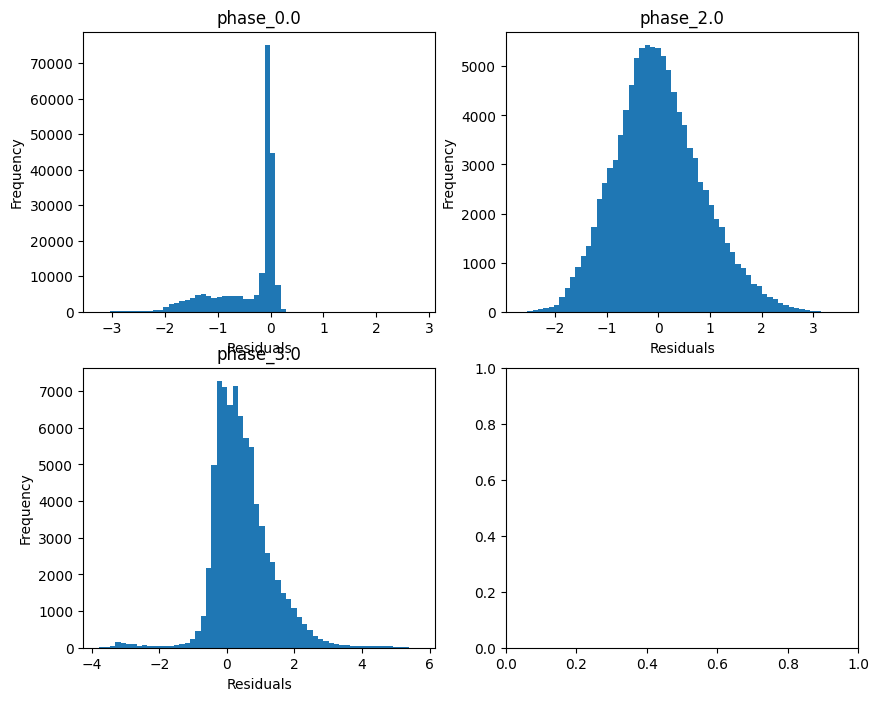

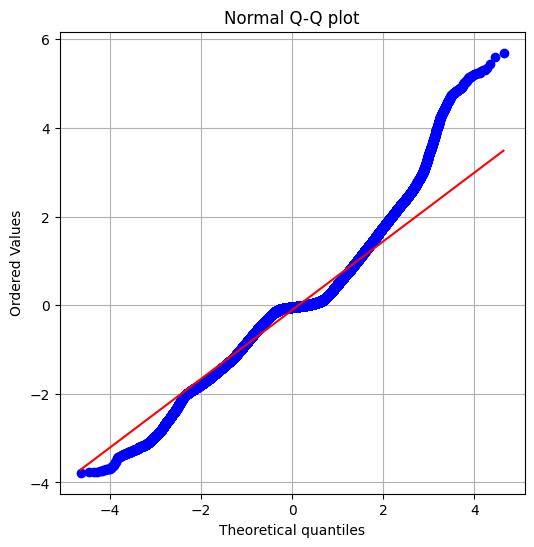

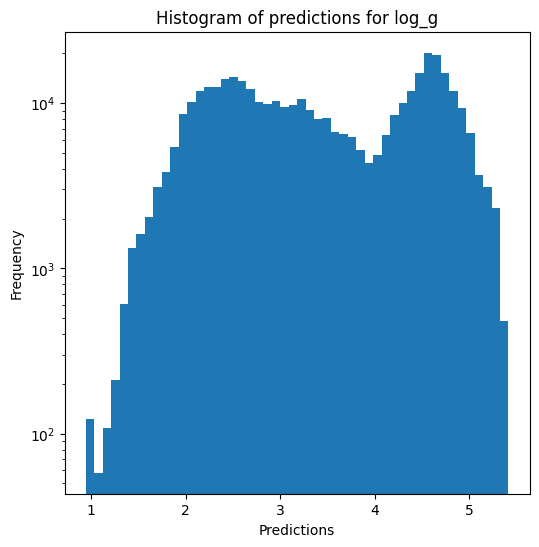

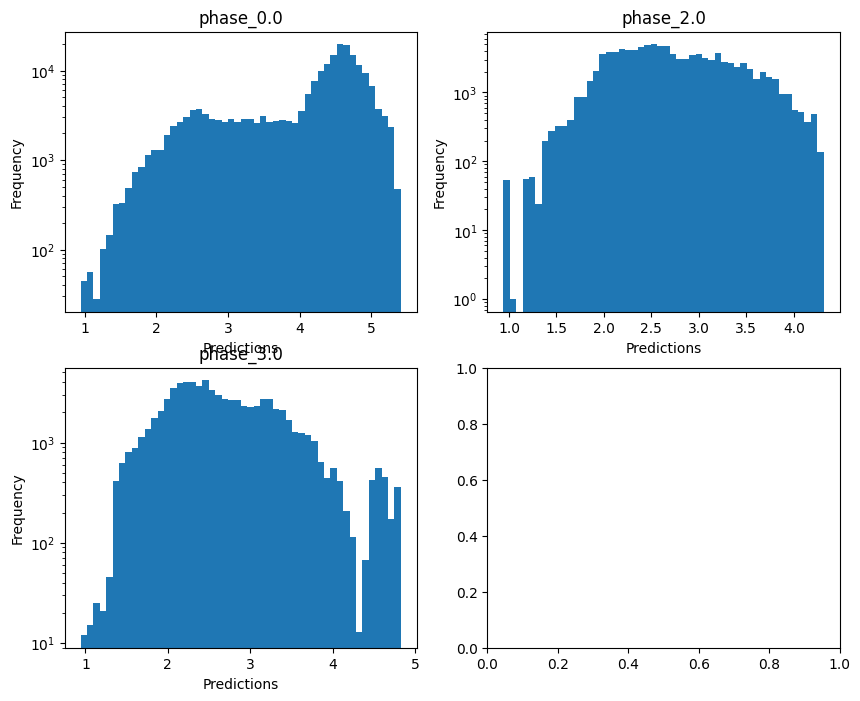


radius results for the phase category with a value of 0.0
  value range :  -0.9974747647513328 - 3.0827540579576227
  RVE :  0.480881509158786
  RMSE :  0.3578453784098455
  MAE :  0.20996815147867184
  MedAE :  0.05406506896391665
  CORR :  0.874455893132534
  MAX_ER :  1.6987828070071218
  Percentiles : 
    75th percentile :  0.3392412505748668
    90th percentile :  0.6909553825910318
    95th percentile :  0.8393165524150226
    99th percentile :  1.0819095413466917

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.900376516729969
  RVE :  0.1922892526123845
  RMSE :  0.41805324576284125
  MAE :  0.3311983526384733
  MedAE :  0.27399091799094744
  CORR :  0.487040653805611
  MAX_ER :  1.7619352275362132
  Percentiles : 
    75th percentile :  0.4813213706024858
    90th percentile :  0.6935326755987054
    95th percentile :  0.8259464604565457
    99th percentile :  1.0943571892305868

radius results for the phase category with a v

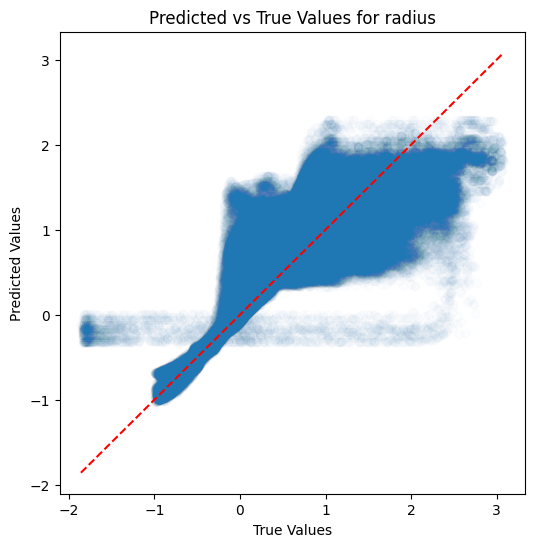

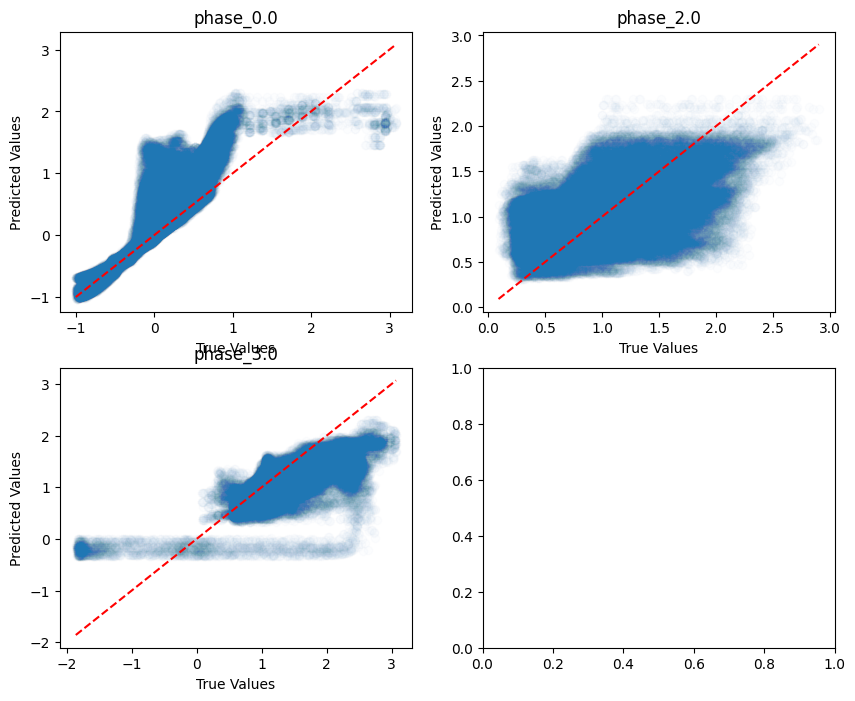

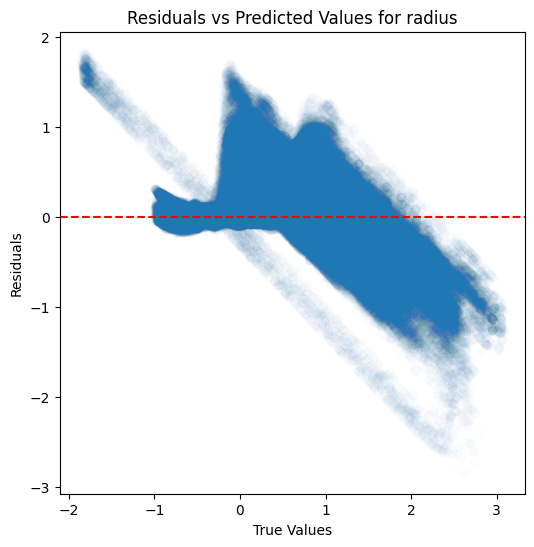

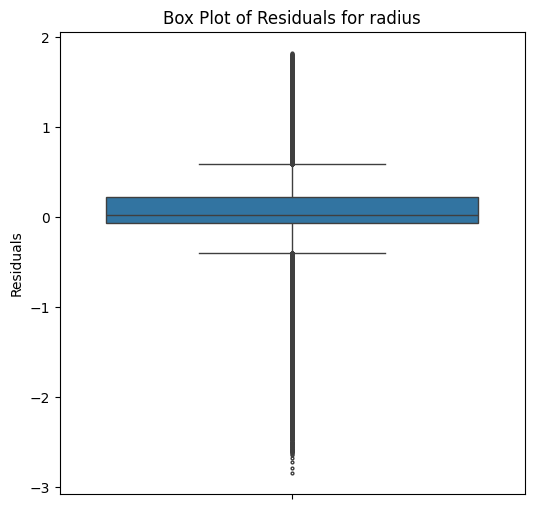

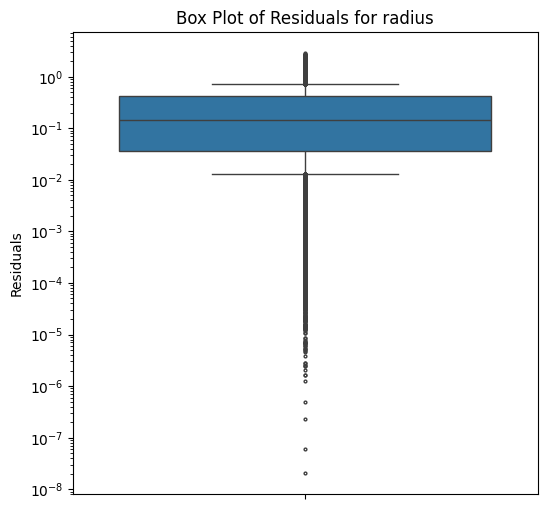

...

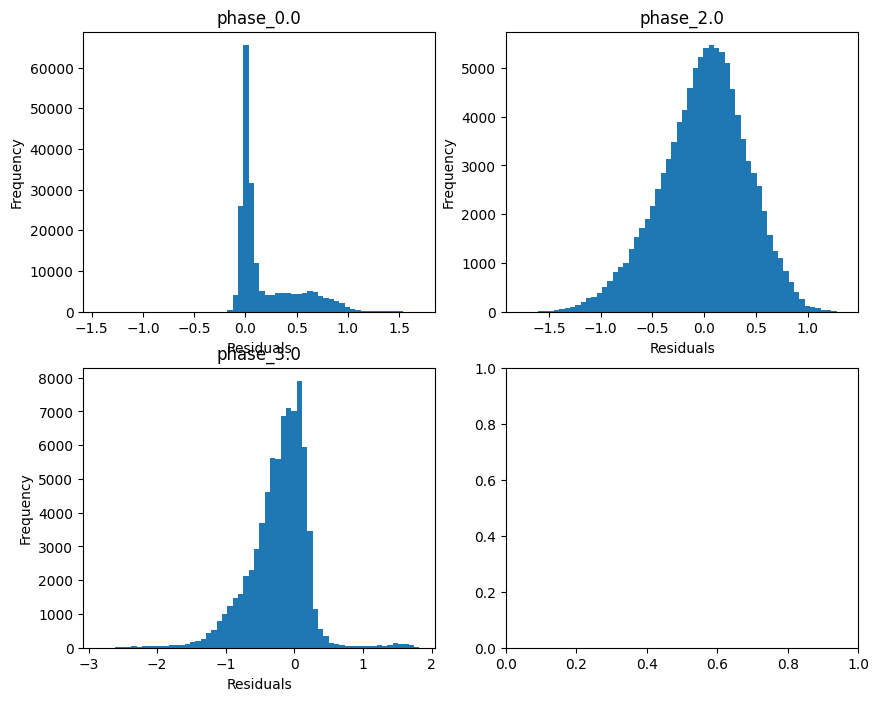

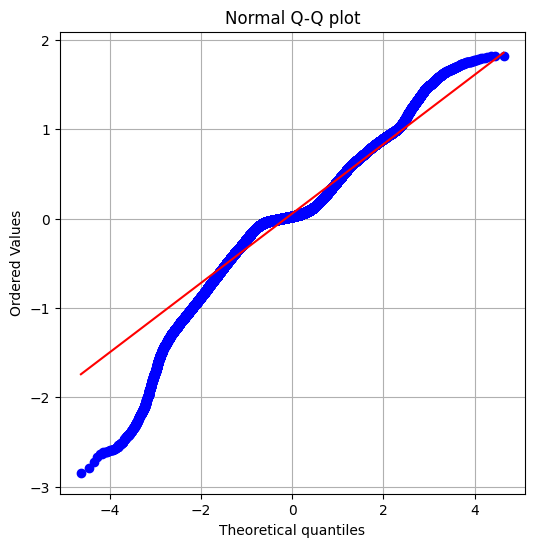

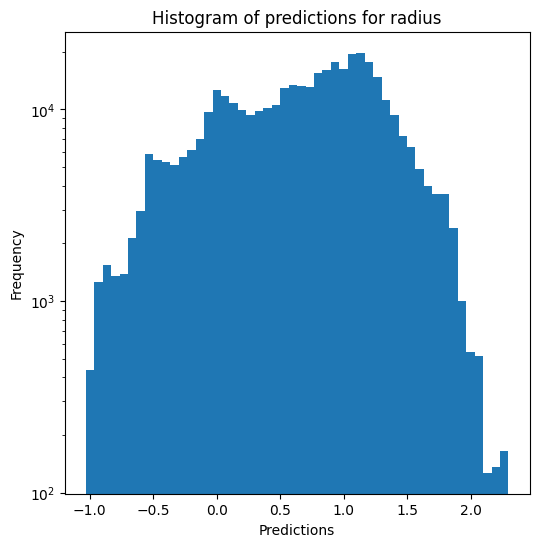

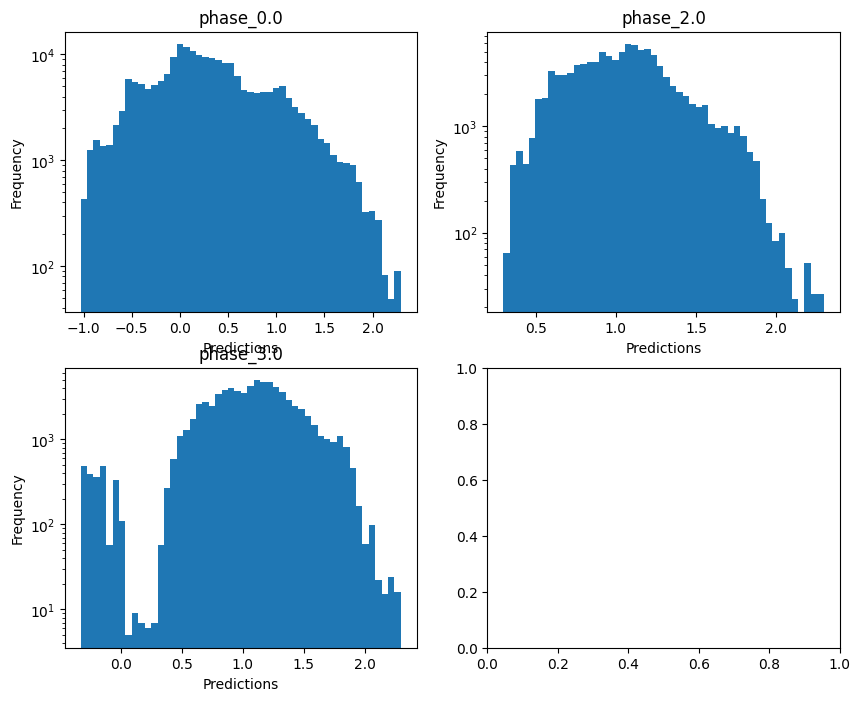

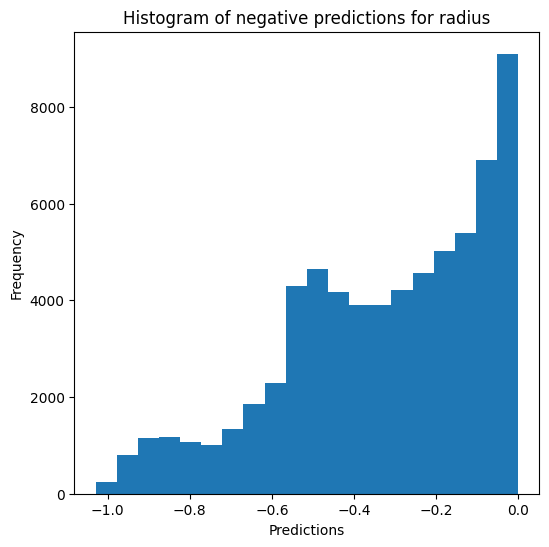

Saving predictions and results...


In [23]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=True, use_preds=False, save=True, show=True, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)